####  Zusammenfassung:

1. **Zunächst müssen wir unsere Zielvariable definieren** – also, was wir vorhersagen möchten.

 - Unser Fokus liegt auf Kreditnehmern und darauf, ob ihre Kredite ausgefallen sind oder nicht.

 -  Zur Vereinfachung bezeichnen wir ausgefallene Kredite als „schlecht“ und zurückgezahlte Kredite als „gut“.

 -  Um gute von schlechten Krediten unterscheiden zu können, benötigen wir eine klare Definition von Zahlungsausfall.

 -  Üblicherweise wird ein Kredit als ausgefallen betrachtet, **wenn eine Zahlung mehr als 90 Tage überfällig ist.**
  
 - Wir erstellen eine neue Variable im Datensatz vom Typ Boolean oder Binär.
 
 -  Dabei steht 0 für einen ausgefallenen oder schlechten Kredit und 1 für einen guten Kredit.
 
 - Die festgelegte statistische Methodik zur Modellierung der Wahrscheinlichkeit eines Zahlungsausfalls ist eine **logistische Regression**, bei der die abhängige Variable genau angibt, ob ein Kunde in Zahlungsverzug ist oder nicht.
 - **Die logistische Regression** schätzt den Zusammenhang zwischen zwei Größen.
 
 
2. **Aufteilen der Daten**

 - Im Kreditkontext ist es wichtig, statt eines klassischen Stichprobensplits (Out-of-Sample) einen zeitbasierten Split (Out-of-Time) zu verwenden. Denn wir möchten wissen, wie gut ein Modell, das mit Vergangenheitsdaten trainiert wurde, künftige Kreditausfälle vorhersagen kann.

 - Die Daten wurden bereits während der Datenbereinigung chronologisch sortiert. Daher genügt es, die ersten **80 %** der Daten als Trainingsdaten und die verbleibenden **20 %** als Testdaten zu verwenden.

 - Ich führe den Split zu diesem frühen Zeitpunkt durch, weil der Testdatensatz ausschließlich aus Daten bestehen sollte, die **das Modell noch nie gesehen hat** – genau wie im realen Einsatz eines Modells. Deshalb wird der Testdatensatz jetzt beiseitegelegt und erst ganz am Ende zur Bewertung des Modells verwendet.

 - Außerdem ist es entscheidend, dass wir Transformationen wie Diskretisierung und das Erstellen von Dummies **nur auf den Trainingsdaten durchführen und danach dieselben Transformationen auf den Testdaten anwenden.** So vermeiden wir Data Leakage und Überanpassung (Overfitting) – und erhalten eine zuverlässige Einschätzung der Modellleistung. Deshalb erfolgt der Split vor dem Encoding.
 
 
3.  **Kategoriebildung und Dummy-Kodierung**

 - Im Rahmen der explorativen Datenanalyse wurde ein strukturiertes Verfahren zur Vorbereitung kategorialer Variablen für die Modellierung entwickelt. Ziel war es, möglichst aussagekräftige und kompakte Dummy-Variablen zu erzeugen.

 - Dazu wurde die Trennschärfe **(Gruppen, die sich ähnlich verhalten, wurden gebündelt.)** der einzelnen Kategorien mithilfe des **Weight of Evidence (WoE) bewertet**. Kategorien mit ähnlichem WoE-Verhalten wurden zusammengefasst, wobei gleichzeitig auf eine ausreichende Fallzahl in jeder Gruppe geachtet wurde. Diese Gruppierung reduziert die Merkmalsdimensionalität und unterstützt die Generalisierbarkeit und Robustheit des Modells.

 - Ein vergleichbares Vorgehen wurde bei kontinuierlichen Variablen angewandt: Sie wurden zunächst diskretisiert(**Man hat Zahlenwerte in Gruppen eingeteilt, diese Gruppen bewertet, und ähnliche Gruppen zusammengelegt.**) und anschließend anhand der **WoE-Verläufe der einzelnen Bins analysiert und ggf. zusammengeführt.**

 - Da die finale Einteilung der Kategorien in der EDA-Phase definiert wurde, erfolgt in diesem Schritt die praktische Umsetzung: die diskretisierten Merkmale werden gruppiert, die Dummy-Variablen erzeugt und der Datensatz für die Modellierung vorbereitet.
 
 - **Warum Kategorien mit ähnlichem WOE kombinieren?**
 Dies liegt daran, dass die Kategorien mit ähnlichem WOE fast den gleichen Anteil an Ereignissen und Nicht-Ereignissen      aufweisen. Mit anderen Worten: Das Verhalten beider Kategorien ist gleich.
 
**Diskrete Variablen:**

3.1 ‘grade’

3.2 'home_ownership'

3.3 'addr_state'

3.4 ‘verification_status’

3.5 ‘initial_list_status’

3.6  ‘purpose’

**kontinuierliche Variablen:**

3.7 ‘term_int’;

3.8 'emp_length_int';

3.9 'mths_since_issue_d';

3.10 ‘interest rate"’;

3.11 'funded amount'

3.12 'months_since_earliest_cr_line'

3.13 'delinq_2yrs'

3.14 'inq_last_6mths'

3.15 'open_acc'

3.16 'pub_rec'

3.17 'total_acc'

3.18 'acc_now_delinq'

3.20 'total_rev_hi_lim_factor'

3.21 'installment_factor'

3.22 'annual_inc'

3.23 'mths_since_last_delinq'

3.24 'dti'

3.25 'mths_since_last_record'


 
**1. Diskretisierung**
- Was es ist:
- Der Vorgang, kontinuierliche Variablen (z. B. Einkommen, Alter, Kreditbetrag) in diskrete Gruppen oder Intervalle (sogenannte Bins) einzuteilen.

Warum man es macht:
- Damit man diese Gruppen besser analysieren oder später in Dummies umwandeln kann. Beispiel: Statt Alter als kontinuierliche Zahl (z. B. 42 Jahre), wird es in Gruppen wie "30–40", "40–50" eingeteilt.

- Beispiel:
Kreditbetrag 0–5k, 5k–10k, 10k–20k usw.

**2. Trennschärfe (Discriminatory Power)**
- Was es ist:
- Die Fähigkeit einer Variable oder Kategorie, zwischen guten und schlechten Zielwerten zu unterscheiden. Also: Trägt diese Gruppe dazu bei, vorherzusagen, ob ein Kredit z. B. zurückgezahlt wird oder nicht?

- Wie sie gemessen wird:
Oft mit Weight of Evidence (WoE) oder Information Value (IV).

- Warum man sie braucht:
Um unwichtige oder schwache Kategorien zu erkennen und ggf. zusammenzulegen oder zu entfernen.

- Zusammenhang beider Begriffe:
Man diskretisiert eine kontinuierliche Variable in Gruppen (Bins).

- Dann prüft man die Trennschärfe dieser Gruppen – also, ob sie sich im Bezug auf das Zielverhalten (z. B. Kreditausfall) unterscheiden.

- Gruppen mit ähnlicher Trennschärfe werden evtl. zusammengefasst, um die Komplexität zu verringern.

Kurz gesagt:

- Diskretisieren = kontinuierliche Werte in Gruppen einteilen.

- Trennschärfe = prüfen, ob diese Gruppen oder Kategorien etwas Nützliches über das Ziel aussagen.

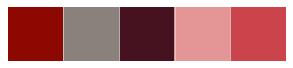

In [116]:
# Data manipulation and visualization.
import pandas as pd
import numpy as np 
import matplotlib as mpl
import matplotlib.pyplot as plt 
import seaborn as sns
from IPython.display import Image

# Imports the libraries we need.
from sklearn.model_selection import train_test_split

from scipy.stats import chi2_contingency

# Display options.
pd.set_option('display.max_rows', None)
pd.set_option('display.max_info_rows', 100)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)

# Filter warnings.
import warnings
warnings.filterwarnings('ignore')


# Visualization Settings
mpl.style.use('ggplot')
mpl.rcParams['axes.facecolor']      = 'white'
mpl.rcParams['grid.color']          = 'lightgray'
mpl.rcParams['xtick.color']         = 'black'
mpl.rcParams['ytick.color']         = 'black'
mpl.rcParams['axes.grid']           = True
#mpl.rcParams['figure.dpi']          = 150

# Palette Seting
instyle_palette = ['#8d0801', '#8a817c', '#461220', '#e39695', '#cc444b']
sns.set_palette(sns.color_palette(instyle_palette))
sns.palplot(sns.color_palette(instyle_palette))

In [117]:
clean_loan_data = pd.read_parquet('input\clean_loan_data.parquet')

In [118]:
pd.set_option('display.max_info_rows', 300)  # Zeige bis zu 300 Spalten
clean_loan_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466285 entries, 0 to 466284
Columns: 208 entries, Unnamed: 0 to initial_list_status:w
dtypes: bool(126), datetime64[ns](2), float64(48), int64(10), object(22)
memory usage: 347.7+ MB


**Umgang mit fehlenden Werten im Datensatz:**
In diesem Abschnitt des Codes werden fehlende Werte im Datensatz clean_loan_data behandelt, um eine saubere und konsistente Grundlage für die weitere Analyse oder Modellierung zu schaffen.

In [119]:
clean_loan_data.isnull().sum().sort_values(ascending=False)

open_il_12m                                                        466285
all_util                                                           466285
annual_inc_joint                                                   466285
dti_joint                                                          466285
verification_status_joint                                          466285
open_acc_6m                                                        466285
open_il_6m                                                         466285
mths_since_rcnt_il                                                 466285
total_bal_il                                                       466285
il_util                                                            466285
open_rv_12m                                                        466285
open_rv_24m                                                        466285
max_bal_bc                                                         466285
open_il_24m                           

In [120]:
# Die fehlenden Werte füllen wir mit dem Mittelwert der nicht fehlenden Werte auf.
clean_loan_data['annual_inc'].fillna(clean_loan_data['annual_inc'].mean(), inplace=True)
clean_loan_data['earliest_cr_line'].fillna(clean_loan_data['earliest_cr_line'].median, inplace=True)
clean_loan_data['earliest_cr_line_date'].fillna(clean_loan_data['earliest_cr_line_date'].mean(), inplace=True)
clean_loan_data['title'].fillna(clean_loan_data['title'].median, inplace=True)

# Die fehlenden Werte füllen wir mit Nullen auf.
clean_loan_data['months_since_earliest_cr_line'].fillna(0, inplace=True)
clean_loan_data['acc_now_delinq'].fillna(0, inplace=True)
clean_loan_data['total_acc'].fillna(0, inplace=True)
clean_loan_data['pub_rec'].fillna(0, inplace=True)
clean_loan_data['open_acc'].fillna(0, inplace=True)
clean_loan_data['inq_last_6mths'].fillna(0, inplace=True)
clean_loan_data['delinq_2yrs'].fillna(0, inplace=True)
clean_loan_data['emp_length_int'].fillna(0, inplace=True)

In [122]:
clean_loan_data.isnull().sum().sort_values(ascending=False)

inq_fi                                                             466285
mths_since_rcnt_il                                                 466285
total_cu_tl                                                        466285
annual_inc_joint                                                   466285
dti_joint                                                          466285
verification_status_joint                                          466285
open_acc_6m                                                        466285
open_il_6m                                                         466285
open_il_24m                                                        466285
open_il_12m                                                        466285
total_bal_il                                                       466285
il_util                                                            466285
open_rv_12m                                                        466285
open_rv_24m                           

In [7]:
 pd_data = clean_loan_data.copy()

### 1. Zielvariable definieren:

In diesem Schritt unterteilen wir die Werte der Spalte loan_status in gute und schlechte Kredite, sodass wir am Ende nur noch zwei Klassen haben:

- 1 für gute Kredite

- 0 für schlechte Kredite

Die Einteilung erfolgt auf Basis der Definitionen und Spezifikationen von Lending Club.

#### Zielvariable:

1. **Fully Paid**

- Der Kredit wurde vollständig zurückgezahlt (kein Ausfallrisiko).

- **Empfohlene Kodierung: 1 (Gut)**

2. **Charged Off**

- Der Kredit wurde als uneinbringlicher Verlust abgeschrieben (Ausfall).

- **Empfohlene Kodierung: 0 (Schlecht)**

3. **Current**

- Der Kredit ist aktiv und wird planmäßig bedient.

- **Empfohlene Kodierung:**

   - (Gut), falls keine Verzögerungen vorliegen.

   -**Vorsicht: Bei späteren Analysen sollte geprüft werden, ob "Current"-Kredite tatsächlich bis zum Ende bedient wurden.**



4. **Default**

- Der Kreditnehmer hat die Zahlungen eingestellt (schwerwiegender Ausfall).

- **Empfohlene Kodierung: 0 (Schlecht)**

5. **Late (16-30 days) / Late (31-120 days)**

- Zahlungsverzögerung in den angegebenen Tagen.

- **Empfohlene Kodierung: 0 (Schlecht), da erhöhtes Ausfallrisiko.**


6. **In Grace Period**

- Der Kreditnehmer hat eine kurze Schonfrist (meist 15 Tage) zur Nachzahlung.

- **Empfohlene Kodierung:**

- 0 (Schlecht), falls konservativ (da potenzieller Vorbote eines Ausfalls).

- Alternativ: 1 (Gut), falls die Mehrheit später zahlt – hier wäre eine Datenanalyse nötig.

7. **Does not meet the credit policy. Status:Fully Paid**

- Der Kredit wurde zurückgezahlt, entsprach aber nicht den internen Richtlinien von Lending Club (z. B. aufgrund von Bonitätsabweichungen).
- **Empfohlene Kodierung: 1 (Gut), da kein Ausfall.**


8. **Does not meet the credit policy. Status:Charged Off**

- Wie oben, aber mit Ausfall.

- **Empfohlene Kodierung: 0 (Schlecht).**


<br>

**Die Zielvariable wird binär (dichotom) kodiert:**

Gut (1): 
- Fully Paid, eventuell 
- Current (wenn keine Verzögerung)

Schlecht (0): 
- Charged Off
- Default
- Late (31-120 days)
- Late (16-30 days)
- In Grace Period

In [8]:
# Unique Werte Zielvariable 
pd_data['loan_status'].unique()

array(['Fully Paid', 'Charged Off', 'Current', 'Default',
       'Late (31-120 days)', 'In Grace Period', 'Late (16-30 days)',
       'Does not meet the credit policy. Status:Fully Paid',
       'Does not meet the credit policy. Status:Charged Off'],
      dtype=object)

+ Berechnet die Anzahl der Beobachtungen für jeden eindeutigen Wert einer Variablen.

In [9]:
# Berechnet die Anzahl der Beobachtungen für jeden eindeutigen Wert einer Variablen.
pd_data['loan_status'].value_counts()

Current                                                224226
Fully Paid                                             184739
Charged Off                                             42475
Late (31-120 days)                                       6900
In Grace Period                                          3146
Does not meet the credit policy. Status:Fully Paid       1988
Late (16-30 days)                                        1218
Default                                                   832
Does not meet the credit policy. Status:Charged Off       761
Name: loan_status, dtype: int64

+ Wir teilen die Anzahl der Beobachtungen für jeden eindeutigen Wert einer Variablen durch die Gesamtzahl der Beobachtungen.
So erhalten wir den Anteil der Beobachtungen für jeden eindeutigen Wert einer Variablen.

In [10]:
# Wir teilen die Anzahl der Beobachtungen für jeden eindeutigen Wert einer Variablen durch die Gesamtzahl der Beobachtungen.
# So erhalten wir den Anteil der Beobachtungen für jeden eindeutigen Wert einer Variablen.
pd_data['loan_status'].value_counts() /  pd_data['loan_status'].count()

Current                                                0.480878
Fully Paid                                             0.396193
Charged Off                                            0.091092
Late (31-120 days)                                     0.014798
In Grace Period                                        0.006747
Does not meet the credit policy. Status:Fully Paid     0.004263
Late (16-30 days)                                      0.002612
Default                                                0.001784
Does not meet the credit policy. Status:Charged Off    0.001632
Name: loan_status, dtype: float64

In [11]:
# 1. Erstelle die Erklärungstabelle
status_table = pd.DataFrame({
    'Status': [
        'Fully Paid',
        'Charged Off',
        'Current',
        'Default',
        'Late (16-30 days)',
        'Late (31-120 days)',
        'In Grace Period',
        'Does not meet the credit policy. Status:Fully Paid',
        'Does not meet the credit policy. Status:Charged Off'
    ],
    'Bedeutung': [
        'Erfolgreich zurückgezahlt.',
        'Kredit wurde abgeschrieben (Totalausfall).',
        'Wird aktuell bedient, aber noch nicht abgeschlossen.',
        'Schwerer Ausfall (> 120 Tage verzögert).',
        'Leichte Verzögerung (16-30 Tage).',
        'Schwere Verzögerung (31-120 Tage).',
        'Schonfrist (meist 15 Tage) zur Nachzahlung.',
        'Rückzahlung, aber nicht den Kreditrichtlinien entsprochen.',
        'Wie oben, aber mit Ausfall.'
    ],
    'Binäre Kodierung': [1, 0, 1, 0, 0, 0, 0, 1, 0],
    'Begründung': [
        'Kein Ausfall.',
        'Definitiver Verlust.',
        'Annahme: Keine Verzögerungen. Risiko: Survivorship Bias.',
        'Zahlungsausfall.',
        'Erhöhtes Ausfallrisiko.',
        'Vorbote für Default.',
        'Konservative Einstufung als Risikofall.',
        'Technisch kein Ausfall.',
        'Definitiver Verlust.'
    ]
})

# 2. Erstelle die binäre Zielvariable in deinem DataFrame
good_statuses = [
    'Fully Paid',
    'Current',
    'Does not meet the credit policy. Status:Fully Paid'
]

pd_data['good_bad'] = np.where(pd_data['loan_status'].isin(good_statuses), 1, 0)

# 3. Analysiere die Ergebnisse
print("="*50)
print("Erklärung der Kreditstatus-Werte:")
display(status_table)

print("\n" + "="*50)
print("Verteilung der Zielvariable in deinen Daten:")
target_distribution = pd_data['good_bad'].value_counts(normalize=True).mul(100).round(2)
print(target_distribution)

print("\n" + "="*50)
print("Detailaufschlüsselung nach loan_status:")
status_distribution = pd_data.groupby('loan_status')['good_bad'] \
                            .value_counts(normalize=True) \
                            .unstack() \
                            .fillna(0) \
                            .mul(100) \
                            .round(2)
display(status_distribution)

Erklärung der Kreditstatus-Werte:


,Status,Bedeutung,Binäre Kodierung,Begründung
0,Fully Paid,Erfolgreich zurückgezahlt.,1,Kein Ausfall.
1,Charged Off,Kredit wurde abgeschrieben (Totalausfall).,0,Definitiver Verlust.
2,Current,"Wird aktuell bedient, aber noch nicht abgeschl...",1,Annahme: Keine Verzögerungen. Risiko: Survivor...
3,Default,Schwerer Ausfall (> 120 Tage verzögert).,0,Zahlungsausfall.
4,Late (16-30 days),Leichte Verzögerung (16-30 Tage).,0,Erhöhtes Ausfallrisiko.
5,Late (31-120 days),Schwere Verzögerung (31-120 Tage).,0,Vorbote für Default.
6,In Grace Period,Schonfrist (meist 15 Tage) zur Nachzahlung.,0,Konservative Einstufung als Risikofall.
7,Does not meet the credit policy. Status:Fully ...,"Rückzahlung, aber nicht den Kreditrichtlinien ...",1,Technisch kein Ausfall.
8,Does not meet the credit policy. Status:Charge...,"Wie oben, aber mit Ausfall.",0,Definitiver Verlust.



Verteilung der Zielvariable in deinen Daten:
1    88.13
0    11.87
Name: good_bad, dtype: float64

Detailaufschlüsselung nach loan_status:


good_bad,0,1
loan_status,,
Charged Off,100.0,0.0
Current,0.0,100.0
Default,100.0,0.0
Does not meet the credit policy. Status:Charged Off,100.0,0.0
Does not meet the credit policy. Status:Fully Paid,0.0,100.0
Fully Paid,0.0,100.0
In Grace Period,100.0,0.0
Late (16-30 days),100.0,0.0
Late (31-120 days),100.0,0.0


**Verteilung der Zielvariable**

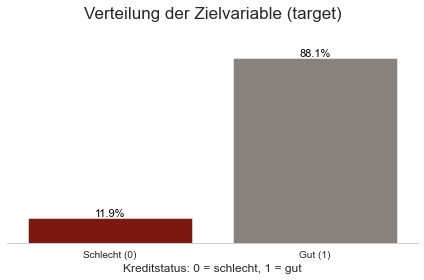

In [12]:
# Stil und Größe festlegen
plt.figure(figsize=(6, 4))
sns.set_style("whitegrid")

# Farben festlegen
colors = ['#8d0801', '#8a817c']

# Barplot erstellen
ax = sns.countplot(x='good_bad', data=pd_data, palette=colors)

# Prozentwerte auf die Balken schreiben
total = len(pd_data)
for p in ax.patches:
    count = int(p.get_height())
    percent = 100 * count / total
    ax.annotate(f'{percent:.1f}%', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='bottom', fontsize=11, color='black')

# Achsentitel und y-Achse entfernen
ax.set_ylabel('')
ax.set_yticks([])
ax.set_yticklabels([])

# X-Achsenbeschriftung
plt.xlabel('Kreditstatus: 0 = schlecht, 1 = gut', fontsize=12)
plt.title('Verteilung der Zielvariable (target)', fontsize=17, pad=30)
plt.xticks([0, 1], ['Schlecht (0)', 'Gut (1)'])

# Ränder (Spines) entfernen
sns.despine(left=True, bottom=False)

# Layout anpassen und anzeigen
plt.tight_layout()
plt.show()



Die Ausfallquote liegt bei rund 12 %. Das motiviert unser Projekt, denn bei der Kreditvergabe von Lending Club besteht tatsächlich Verbesserungspotenzial.
Wir haben es mit einem Problem der unausgewogenen Klassifizierung zu tun.

### 2.  Aufteilen der Daten:

- Wir teilen zwei Datenrahmen mit Eingaben  und Zielen jeweils in einen Trainings- und einen Testdatenrahmen auf und speichern sie in Variablen.
-  Dieses Mal legen wir die Größe des Testdatensatzes auf 20 % fest.
-  Entsprechend beträgt die Größe des Trainingsdatensatzes 80 %.
- Wir legen außerdem einen bestimmten Zufallszustand fest.
-  Dadurch können wir die gleiche Aufteilung mehrfach durchführen.
- Das bedeutet, dass wir den Trainings- und Testdatensätzen genau dieselben Beobachtungen zuordnen.

In [13]:
# Daten nach Ausgabezeitpunkt sortieren
pd_data = pd_data.sort_values('issue_d_date').reset_index(drop=True)

In [14]:
# Wir teilen zwei Datenrahmen mit Eingaben 
# und Zielen jeweils in einen Trainings- und einen Testdatenrahmen auf und speichern sie in Variablen.
# Dieses Mal legen wir die Größe des Testdatensatzes auf 20 % fest.
# Entsprechend beträgt die Größe des Trainingsdatensatzes 80 %.
# Wir legen außerdem einen bestimmten Zufallszustand fest.
# Dadurch können wir die gleiche Aufteilung mehrfach durchführen.
# Das bedeutet, dass wir den Trainings- und Testdatensätzen genau dieselben Beobachtungen zuordnen.
loan_data_inputs_train, loan_data_inputs_test, loan_data_targets_train, loan_data_targets_test = train_test_split(pd_data.drop('good_bad', axis = 1), pd_data['good_bad'], test_size = 0.2, random_state = 42)

# Zeigt die Größe des Datenrahmens an.
print(f"loan_data_inputs_train: {loan_data_inputs_train.shape[0]}")

# Zeigt die Größe des Datenrahmens an.
print(f"loan_data_targets_train.shape: {loan_data_targets_train.shape[0]}")

# Zeigt die Größe des Datenrahmens an.
print(f"loan_data_inputs_test.shape: {loan_data_inputs_test.shape[0]}")

# Zeigt die Größe des Datenrahmens an.
print(f"loan_data_targets_test.shape: {loan_data_targets_test.shape[0]}")



# 3. Überprüfung der Aufteilung
print(f"Trainingsdaten: {loan_data_inputs_train.shape[0]} Beispiele")
print(f"Testdaten: {loan_data_inputs_test.shape[0]} Beispiele")
print('')
print("\nKlassenverteilung im gesamten Datensatz:")
print(loan_data_targets_test.value_counts(normalize=True))
print("\nKlassenverteilung im Trainingsset:")
print(loan_data_targets_train.value_counts(normalize=True))
print("\nKlassenverteilung im Testset:")
print(loan_data_targets_test.value_counts(normalize=True))


#####
df_inputs_prepr = loan_data_inputs_train
df_targets_prepr = loan_data_targets_train
#df_inputs_prepr = loan_data_inputs_test
#df_targets_prepr = loan_data_targets_test
#####

loan_data_inputs_train: 373028
loan_data_targets_train.shape: 373028
loan_data_inputs_test.shape: 93257
loan_data_targets_test.shape: 93257
Trainingsdaten: 373028 Beispiele
Testdaten: 93257 Beispiele


Klassenverteilung im gesamten Datensatz:
1    0.881467
0    0.118533
Name: good_bad, dtype: float64

Klassenverteilung im Trainingsset:
1    0.881301
0    0.118699
Name: good_bad, dtype: float64

Klassenverteilung im Testset:
1    0.881467
0    0.118533
Name: good_bad, dtype: float64


**Was ist Weight of Evidence (Beweiskraft)?**

Die Gewichtung der Beweise (WOE) gibt die Vorhersagekraft einer unabhängigen Variable im Verhältnis zur abhängigen Variable an. Da sie aus der Welt der Kreditbewertung hervorgegangen ist, wird sie allgemein als Maß für die Unterscheidung zwischen guten und schlechten Kunden beschrieben. „Schlechte Kunden“ bezieht sich auf Kunden, die einen Kredit nicht zurückgezahlt haben, und „Gute Kunden“ bezieht sich auf Kunden, die ihren Kredit zurückgezahlt haben.

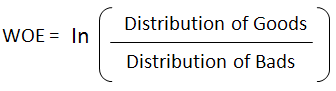

In [15]:
from IPython.display import Image
Image(filename='bild\woe.png')


- Verteilung der Güter - % der guten Kunden in einer bestimmten Gruppe

- Verteilung der schlechten Kunden - % der schlechten Kunden in einer bestimmten Gruppe

- ln - Natürlicher Logarithmus

**Bedeutung von WoE:**

- **Ein positiver WoE-Wert bedeutet**, dass die Kategorie überdurchschnittlich viele gute Kunden enthält (d.h. die Verteilung guter Kunden ist größer als die der schlechten).

- **Ein negativer WoE-Wert bedeutet**, dass die Kategorie überdurchschnittlich viele schlechte Kunden enthält (d.h. die Verteilung schlechter Kunden ist größer).

**Hinweis:**
- Der natürliche Logarithmus einer Zahl größer als 1 ergibt einen positiven Wert.

- Der natürliche Logarithmus einer Zahl kleiner als 1 ergibt einen negativen Wert.

Genau dieser Zusammenhang wird bei der WoE-Berechnung genutzt:

**Wie berechnet man die Beweiskraft?**

1. Teilen Sie bei einer kontinuierlichen Variable die Daten in 10 Teile auf (oder weniger, je nach Verteilung).
2. Berechnen Sie die Anzahl der Ereignisse und Nicht-Ereignisse in jeder Gruppe (Bin).
3. Berechnen Sie den Prozentsatz der Ereignisse und den Prozentsatz der Nicht-Ereignisse in jeder Gruppe.
4. Berechnen Sie den WOE, indem Sie den natürlichen Logarithmus der Division von % der Nicht-Ereignisse und % der Ereignisse nehmen

**Was ist Informationswert?**

Der Informationswert (IV) wird verwendet, um die Vorhersagekraft unabhängiger Variablen zu messen. Er wird als Variablenauswahltechnik verwendet, wenn die abhängige Variable binär ist, also nur zwei Werte hat. Diese Technik ist in der Banken-(Risiko-)Analyse sehr beliebt, wenn Sie Kredit-Scoring oder Kundenabwanderungsmodelle erstellen.


Die Gewichtung der Beweise (WOE) wird als Methode zur Transformation unabhängiger Variablen verwendet, um eine streng lineare Beziehung mit Log-Odds (bei logistischer Regression) aufzubauen. Mit WOE können wir kategoriale Variablen verarbeiten, wodurch die Erstellung von Dummy-Variablen bei kategorialen Variablen vermieden wird.

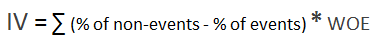

In [16]:
Image(filename='bild\IV.png')

**Regeln zum Informationswert**

Wenn die IV-Statistik lautet:
    
- Weniger als 0,02, dann ist der Prädiktor für die Modellierung nicht nützlich (Trennung der Guten von den Schlechten).
- 0,02 bis 0,1, dann hat der Prädiktor nur eine schwache Beziehung zum Gut/Schlecht-Odds-Verhältnis.
- 0,1 bis 0,3, dann hat der Prädiktor eine mittlere Beziehung zum Gut/Schlecht-Odds-Verhältnis.
- 0,3 bis 0,5, dann hat der Prädiktor eine starke Beziehung zum Gut/Schlecht-Odds-Verhältnis.
- IV > 0,5, verdächtige Beziehung (einmal prüfen).

**Wichtige Punkte**

- Der Informationswert steigt mit zunehmender Anzahl von Bins/Gruppen für eine unabhängige Variable. Seien Sie vorsichtig, wenn mehr als 20 Bins vorhanden sind, da einige Bins möglicherweise nur eine sehr geringe Anzahl von Ereignissen und Nicht-Ereignissen enthalten.
- Der Informationswert ist keine optimale Methode zur Merkmalsauswahl (Variablenauswahl), wenn Sie ein anderes Klassifizierungsmodell als die binäre logistische Regression (z. B. Random Forest oder SVM) erstellen, da die bedingten Log-Odds (die wir in einem logistischen Regressionsmodell vorhersagen) stark mit der Berechnung der Beweiskraft zusammenhängen. Anders ausgedrückt: Random Forest kann nichtlineare Beziehungen sehr gut erkennen, sodass die Auswahl von Variablen über den Informationswert und deren Verwendung im Random-Forest-Modell möglicherweise nicht das genaueste und robusteste Vorhersagemodell ergibt.

**WoE-Funktion für diskrete, ungeordnete Variablen**

Diese Funktion dient der Berechnung des Weight of Evidence (WoE) und des Information Value (IV) für kategoriale, nicht geordnete Merkmale im Rahmen der Risikomodellierung. Sie durchläuft die folgenden Schritte:

1- Kombination der Eingabedaten
Die Zielvariable und die zu analysierende Merkmalsspalte werden in einem DataFrame zusammengeführt.

2- Berechnung von Häufigkeiten und Anteilen
Für jede Ausprägung der Merkmalsvariable werden die Anzahl der „guten“ und „schlechten“ Fälle sowie deren relativen Anteile berechnet.

3- Berechnung von WoE und IV
Auf Basis der Verteilung von Gut- und Schlecht-Fällen in jeder Kategorie werden WoE-Werte als Maß für das Trennvermögen der Kategorie sowie der Informationswert (IV) zur Bewertung der Variablenrelevanz ermittelt.

4- Ausgabe eines Analyse-DataFrames
Die Funktion gibt einen übersichtlichen DataFrame zurück, der für jede Merkmalsausprägung die berechneten Kennzahlen enthält.

In [17]:
# WoE-Funktion für diskrete, ungeordnete Variablen
# Die Funktion führt folgende Operationen durch:
# 1. Kombiniert die Eingabedaten
# 2. Berechnet Häufigkeiten und Anteile
# 3. Kalkuliert WoE und IV als Risikomaße
# 4. Gibt einen DataFrame mit Analyseergebnissen zurück

def woe_discrete(df, discrete_variabe_name, good_bad_variable_df):
    # Kombiniere die diskrete Variable mit der Zielvariable (Good/Bad)
    df = pd.concat([df[discrete_variabe_name], good_bad_variable_df], axis=1)
    
    # Berechne Gesamtanzahl der Beobachtungen pro Kategorie
    grouped_count = df.groupby(df.columns.values[0], as_index=False)[df.columns.values[1]].count()
    
    # Berechne den Anteil "guter" Ereignisse pro Kategorie (Mittelwert der binären Zielvariable)
    grouped_mean = df.groupby(df.columns.values[0], as_index=False)[df.columns.values[1]].mean()
    
    # Kombiniere die beiden DataFrames horizontal
    df = pd.concat([grouped_count, grouped_mean], axis=1)
    
    # Wähle relevante Spalten aus (Kategorie, Anzahl Beobachtungen, Anteil Good)
    df = df.iloc[:, [0, 1, 3]]
    
    # Benenne Spalten um für bessere Lesbarkeit
    df.columns = [df.columns.values[0], 'n_obs', 'prop_good']
    
    # Berechne den Anteil der Beobachtungen pro Kategorie
    df['prop_n_obs'] = df['n_obs'] / df['n_obs'].sum()
    
    # Berechne absolute Anzahl guter/schlechter Ereignisse
    df['n_good'] = df['prop_good'] * df['n_obs']  # Anzahl Good pro Kategorie
    df['n_bad'] = (1 - df['prop_good']) * df['n_obs']  # Anzahl Bad pro Kategorie
    
    # Berechne den Anteil der Goods/Bads pro Kategorie
    df['prop_n_good'] = df['n_good'] / df['n_good'].sum()  # Anteil aller Goods in dieser Kategorie
    df['prop_n_bad'] = df['n_bad'] / df['n_bad'].sum()  # Anteil aller Bads in dieser Kategorie
    
    # Berechne Weight of Evidence (WoE)
    df['WoE'] = np.log(df['prop_n_good'] / df['prop_n_bad'])  # Log-Odds-Ratio
    
    # Sortiere die Kategorien nach WoE für bessere Interpretierbarkeit
    df = df.sort_values(['WoE'])
    df = df.reset_index(drop=True)
    
    # Berechne Unterschiede zwischen benachbarten Kategorien
    df['diff_prop_good'] = df['prop_good'].diff().abs()  # Absolute Differenz der Good-Anteile
    df['diff_WoE'] = df['WoE'].diff().abs()  # Absolute Differenz der WoE-Werte
    
    # Berechne Information Value (IV)
    df['IV'] = (df['prop_n_good'] - df['prop_n_bad']) * df['WoE']  # Beitrag jeder Kategorie zum IV
    df['IV'] = df['IV'].sum()  # Gesamt-IV für die Variable (ACHTUNG: Wert wird in allen Zeilen wiederholt)
    
    return df



**Funktion zur Visualisierung mit Standardparameter**

Diese Funktion erwartet zwei Eingabeargumente:

1- Ein DataFrame – die Datengrundlage für die Visualisierung.

2- Einen numerischen Parameter – optional; hat einen voreingestellten Standardwert von 0.

- Wird die Funktion ohne Angabe eines Zahlenwertes aufgerufen, wird automatisch der Standardwert 0 verwendet.

- Die Funktion erstellt und zeigt anschließend ein Diagramm basierend auf dem DataFrame und dem übergebenen Zahlenwert.

In [18]:
# Diese Funktion nimmt 2 Argumente entgegen: einen DataFrame und eine Zahl.
# Der Zahlenparameter hat einen Standardwert von 0.
# Das bedeutet, wenn die Funktion ohne Angabe des Zahlenparameters aufgerufen wird, wird dieser automatisch auf 0 gesetzt.
# Die Funktion zeigt ein Diagramm an.
def plot_by_woe(df_WoE, rotation_of_x_axis_labels = 0):
    x = np.array(df_WoE.iloc[:, 0].apply(str))
    # Wandelt die Werte der Spalte mit Index 0 in Strings um, erstellt ein Array und weist es Variable x zu
    y = df_WoE['WoE']
    # Wählt die Spalte 'WoE' aus und weist sie Variable y zu
    plt.figure(figsize=(18, 6))
    # Legt die Diagrammgröße auf Breite 18 x Höhe 6 fest
    plt.plot(x, y, marker = 'o', linestyle = '--', color = 'k')
    # Plottet Datenpunkte mit x-Werten aus Variable x und y-Werten aus Variable y
    # Setzt Marker auf Kreise, Linienstil auf gestrichelt und Farbe auf Schwarz
    plt.xlabel(df_WoE.columns[0])
    # Benennt die x-Achse mit dem Namen der Spalte mit Index 0
    plt.ylabel('Weight of Evidence')
    # Benennt die y-Achse 'Weight of Evidence'
    plt.title(str('Weight of Evidence by ' + df_WoE.columns[0]))
    # Setzt den Diagrammtitel auf 'Weight of Evidence by [Spaltenname]'
    plt.xticks(rotation = rotation_of_x_axis_labels)
    # Rotiert die x-Achsen-Beschriftungen um vordefinierte Gradzahl


### 3. Vorgehensweise zur Diskrete Variablen

- Bei der Datenaufbereitung geht es darum, vorhandene Informationen so aufzubereiten, dass ein Modell sie gut verarbeiten kann. Diskrete Variablen – also Merkmale mit klar abgegrenzten Kategorien – müssen nicht weiter aufgeteilt werden. Stattdessen werden ähnliche Kategorien zusammengefasst. Das macht die Daten übersichtlicher und hilft dem Modell, zuverlässigere und allgemein gültige Entscheidungen zu treffen.




- Die Datenaufbereitung dient als vorbereitender Schritt für diskrete Variablen, die bereits kategorial vorliegen und daher keiner weiteren Aufteilung in Gruppen bedürfen. Stattdessen werden Kategorien mit ähnlichem Verhalten im Weight of Evidence (WoE) zusammengefasst. Diese Bündelung reduziert die Merkmalsdimensionalität und verbessert sowohl die Generalisierbarkeit als auch die Robustheit des Modells.


**Variablen:**

3.1 ‘grade’

3.2 'home_ownership'

3.3 'addr_state'

3.4 ‘verification_status’

3.5 ‘initial_list_status’

3.6  ‘purpose’

###  3.1 Variable: höher die Bonitätsstufe ('grade' )

- Die grade-Kategorien reichen von A (beste Bonität) bis G (schlechteste Bonität).

In [19]:
woe_results = woe_discrete(
    df = df_inputs_prepr,
    discrete_variabe_name = 'grade',
    good_bad_variable_df = df_targets_prepr
)

In [20]:
woe_results

,grade,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,G,2658,0.711437,0.007125,1891.0,767.0,0.005752,0.017322,-1.102435,NaN,NaN,0.290828
1,F,10546,0.743505,0.028271,7841.0,2705.0,0.023851,0.061091,-0.940545,0.032067,0.161890,0.290828
2,E,28749,0.789106,0.077069,22686.0,6063.0,0.069007,0.136930,-0.685266,0.045601,0.255279,0.290828
3,D,61414,0.832204,0.164636,51109.0,10305.0,0.155465,0.232734,-0.403478,0.043099,0.281788,0.290828
4,C,100246,0.875107,0.268736,87726.0,12520.0,0.266847,0.282759,-0.057919,0.042903,0.345560,0.290828
5,B,109712,0.914348,0.294112,100315.0,9397.0,0.305141,0.212227,0.363115,0.039241,0.421034,0.290828
6,A,59703,0.957774,0.160050,57182.0,2521.0,0.173938,0.056936,1.116774,0.043426,0.753659,0.290828


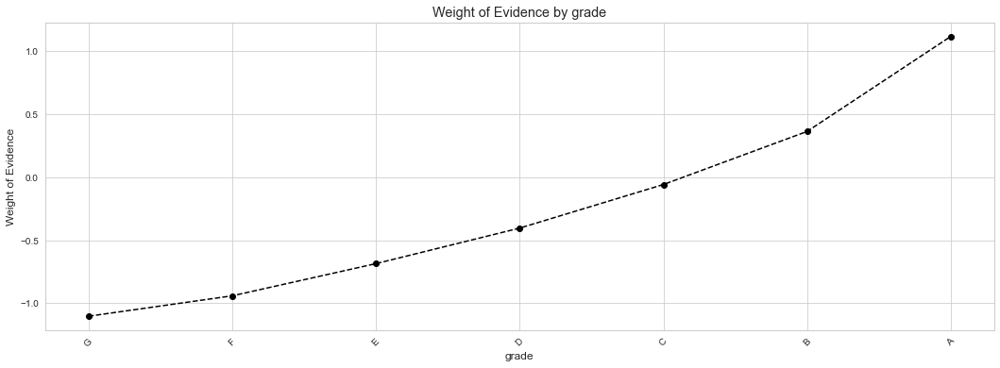

In [21]:
plot_by_woe(woe_results,45)

**Erkenntnisse:**

- Es zeigt sich ein monoton abnehmender Trend der Ausfallquote, je höher die Bonitätsstufe („Grade“) des Antragstellers ist (von G bis A).

- Je besser der Grade, desto geringer das Kreditrisiko.

- Die WoE-Werte zeigen einen klaren, monotonen Trend: von stark negativen Werten in den unteren Bonitätsklassen (z. B. G: -1.10) bis hin zu hohen positiven Werten in den oberen Klassen (z. B. A: +1.12). Dieser Verlauf deutet darauf hin, dass grade sehr gut zwischen guten und schlechten Kreditnehmern unterscheidet, was ideal für die Verwendung in linearen Modellen wie der logistischen Regression ist.

- Zusätzlich wurde der Information Value (IV) für die Variable berechnet, der mit 0.29 im Bereich einer starken prädiktiven Kraft liegt. Dies bestätigt, dass grade eine der wichtigsten Variablen im Modell darstellt.

- Aufgrund der ausreichenden Fallzahlen pro Kategorie und der deutlichen diskriminierenden Aussagekraft wird für jede Bonitätsstufe eine separate Dummy-Variable erstellt. Die monotone Risikobeziehung (höherer Grade = geringeres Risiko) wird so im Modell abgebildet.

- Insgesamt spricht die WoE-Analyse für eine hohe Modellrelevanz der Variable grade und legt nahe, sie direkt (z. B. in transformierter Form) in das Scoring-Modell aufzunehmen.

- **Basierend auf diesem Weight-of-Evidence-Muster werden wir die sieben ursprünglichen Kategorien der Bonitätsvariable als unabhängige Variablen für das PD-Modell beibehalten.“**

**Referenzkategorie: Dient als Basis für den Vergleich aller anderen Grades im Modell (z. B. „Wie viel geringer ist das Risiko von A vs. G?“).**

### 3.2 Variable: Wohnsituation  ('home_ownership')

In [22]:
# 'home_ownership'
df_temp = woe_discrete(df_inputs_prepr, 'home_ownership', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,home_ownership,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,OTHER,151,0.794702,0.000405,120.0,31.0,0.000365,0.000700,-0.651305,NaN,NaN,0.019432
1,NONE,44,0.818182,0.000118,36.0,8.0,0.000110,0.000181,-0.500732,0.023480,0.150573,0.019432
2,RENT,151002,0.864326,0.404801,130515.0,20487.0,0.397004,0.462690,-0.153112,0.046144,0.347620,0.019432
3,OWN,33371,0.881274,0.089460,29409.0,3962.0,0.089457,0.089480,-0.000258,0.016948,0.152854,0.019432
4,MORTGAGE,188460,0.894991,0.505217,168670.0,19790.0,0.513065,0.446949,0.137958,0.013717,0.138216,0.019432


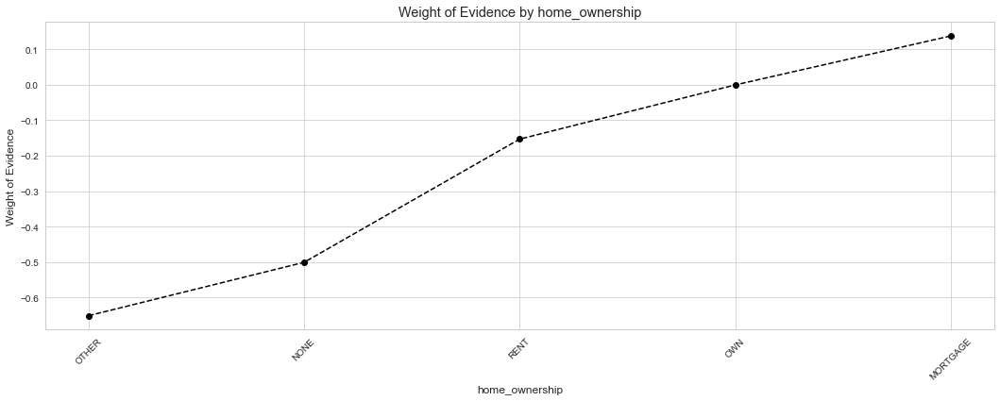

In [23]:
# We plot the weight of evidence values.
plot_by_woe(df_temp,45)

- Da die Kategorien 'Other' (Sonstige) und 'None' (Keine) nur sehr wenige Beobachtungen darstellen **(ca. 0,06% der Gesamtdaten)**, werden sie mit 'Rent' (Miete) zusammengefasst. Die Kategorie 'Any' (Beliebig) wird ebenfalls dieser Gruppe hinzugefügt, **obwohl sie keine Beobachtungen aufweist** – möglicherweise gab es einige wenige Datensätze im Testset. Da diese vier Kategorien das **höchste Kreditrisiko** und den **niedrigsten Weight of Evidence (WoE) aufweisen**, werden sie als **Referenzkategorie** für die Variable home_ownership (Wohneigentum) gruppiert.



- 'Own' (Eigentum) und 'Mortgage' (Hypothek) weisen hingegen **ausreichend Beobachtungen** und unterschiedliche Risikoprofile auf. Daher werden für sie **separate Dummy-Variablen erstellt**.


- Der berechnete IV-Wert liegt bei 0.0194, was auf eine sehr geringe Trennschärfe der Variable hinweist. Das bedeutet, dass die Wohnsituation nur einen sehr geringen Beitrag zur Vorhersagekraft des Modells leistet und eher eine unterstützende als eine zentrale Rolle spielt.


**Referenzkategorie: RENT_OTHER_NONE_ANY' will be the reference category.**

In [24]:
# Viele Kategorien haben sehr wenige Beobachtungen und stark abweichende "Good"-Anteile.
# Daher erstellen wir eine neue diskrete Variable, in der wir einige Kategorien kombinieren.
# 'OTHERS' und 'NONE' sind am riskantesten, aber sehr selten. 
# 'RENT' ist die nächstriskante Kategorie.
# 'ANY' ist am wenigsten riskant, aber ebenfalls zu selten. 
# Konzeptionell gehören sie zur gleichen Gruppe. Ihre Aufnahme würde nichts Wesentliches ändern.

# Wir kombinieren sie in einer Kategorie: 'RENT_OTHER_NONE_ANY'
# Ergebnis: 3 Kategorien - 'RENT_OTHER_NONE_ANY', 'OWN', 'MORTGAGE'

# Kombiniert vier Dummy-Variablen durch logische ODER-Verknüpfung
df_inputs_prepr['home_ownership:RENT_OTHER_NONE_ANY'] = sum([
    df_inputs_prepr['home_ownership:RENT'],
    df_inputs_prepr['home_ownership:OTHER'],
    df_inputs_prepr['home_ownership:NONE'],
    df_inputs_prepr['home_ownership:ANY']
])

# 'RENT_OTHER_NONE_ANY' will be the reference category.

Was passiert hier?

- Wir summieren vier Dummy-Variablen (RENT, OTHER, NONE, ANY), also Variablen mit Werten 0 oder 1.

- Wenn eine dieser vier Kategorien wahr (==1) ist, wird die Summe ebenfalls 1 sein, andernfalls 0.

- Dadurch entsteht eine neue kombinierte Dummy-Variable, die alle diese Wohnsituationen zusammenfasst.

1. Hintergrund:

- Die ursprüngliche home_ownership-Variable hatte viele seltene Kategorien
- Durch One-Hot-Encoding entstanden einzelne Dummy-Spalten (RENT, OTHER, etc.)

2. Logik der Kombination:

- Seltene aber riskante Kategorien (RENT, OTHER, NONE, ANY) werden zusammengefasst

- Reduziert Overfitting durch zu viele seltene Kategorien

- Vereinfacht die Modellinterpretation

3. Technische Umsetzung:

- sum() addiert die binären Dummy-Variablen (0/1)

- Da bei One-Hot-Encoding nur eine Kategorie pro Zeile =1 sein kann,
wird das Ergebnis wieder binär (0/1)

- Alternativ könnte man | (logisches ODER) verwenden:


**Wichtiger Hinweis**

Die Verwendung von sum() funktioniert hier nur, weil: 
- Es sich um mutual exclusive Dummy-Variablen handelt (nur eine Kategorie =1 pro Zeile)
- Bei Überlappungen würde sum() Werte >1 produzieren - hier aber unmöglich

In [25]:
df_inputs_prepr['home_ownership:RENT_OTHER_NONE_ANY'].head(15)

427211    0
206088    1
136020    0
412305    0
36159     1
260400    1
29626     0
117003    0
378696    0
159555    0
258931    0
435023    1
434939    0
166714    1
397514    1
Name: home_ownership:RENT_OTHER_NONE_ANY, dtype: int32

In [26]:
 df_inputs_prepr['home_ownership'].head(15)

427211    MORTGAGE
206088        RENT
136020    MORTGAGE
412305    MORTGAGE
36159         RENT
260400        RENT
29626          OWN
117003         OWN
378696    MORTGAGE
159555    MORTGAGE
258931    MORTGAGE
435023        RENT
434939    MORTGAGE
166714        RENT
397514        RENT
Name: home_ownership, dtype: object

Zur Bewertung des Einflusses der Wohnsituation auf das Kreditrisiko wurde die kategoriale Variable home_ownership mithilfe von WoE und Information Value (IV) analysiert.

Die Kategorien „OTHER“ und „NONE“ weisen negative WoE-Werte auf, was auf eine überdurchschnittlich hohe Ausfallwahrscheinlichkeit hinweist. „MORTGAGE“ hingegen zeigt einen positiven WoE-Wert, was auf eine leicht geringere Ausfallwahrscheinlichkeit schließen lässt. Die Kategorie „OWN“ ist nahezu neutral und spiegelt die Gesamtverteilung wider.



### 3.3 Variablen:  Bundesstaat ('addr_state')

Um kategoriale Variablen wie den Bundesstaat („addr_state“) für ein logistisch-regressives Kreditrisikomodell nutzen zu können, wurde der Weight of Evidence (WoE) berechnet. Diese Transformation erlaubt es, die Beziehung zwischen dem Merkmal und dem Zielvariable (z. B. Kreditausfall) auf eine skalierte und modellkompatible Weise darzustellen.

In [27]:
# 'addr_state'
df_inputs_prepr['addr_state'].unique()
    

array(['AL', 'NY', 'IL', 'NV', 'FL', 'NM', 'CT', 'CA', 'NC', 'TX', 'NH',
       'TN', 'PA', 'WA', 'VT', 'IN', 'CO', 'MA', 'NJ', 'VA', 'MO', 'GA',
       'SC', 'OH', 'MI', 'AZ', 'WY', 'MD', 'MN', 'KS', 'WI', 'AR', 'OR',
       'RI', 'DC', 'KY', 'LA', 'AK', 'HI', 'MT', 'UT', 'DE', 'OK', 'WV',
       'MS', 'SD', 'NE', 'ID', 'ME', 'IA'], dtype=object)

In [28]:
df_temp = woe_discrete(df_inputs_prepr, 'addr_state', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,addr_state,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,NE,11,0.363636,0.000029,4.0,7.0,0.000012,0.000158,-2.564425,NaN,NaN,inf
1,IA,12,0.750000,0.000032,9.0,3.0,0.000027,0.000068,-0.906197,0.386364,1.658228,inf
2,NV,5178,0.857281,0.013881,4439.0,739.0,0.013503,0.016690,-0.211923,0.107281,0.694274,inf
3,AL,4677,0.860594,0.012538,4025.0,652.0,0.012243,0.014725,-0.184574,0.003314,0.027349,inf
4,HI,1995,0.862155,0.005348,1720.0,275.0,0.005232,0.006211,-0.171501,0.001561,0.013073,inf
5,FL,25309,0.866846,0.067847,21939.0,3370.0,0.066735,0.076110,-0.131457,0.004690,0.040045,inf
6,LA,4375,0.870171,0.011728,3807.0,568.0,0.011580,0.012828,-0.102334,0.003326,0.029122,inf
7,NY,32358,0.870727,0.086744,28175.0,4183.0,0.085703,0.094471,-0.097403,0.000556,0.004931,inf
8,DE,1022,0.871820,0.002740,891.0,131.0,0.002710,0.002959,-0.087663,0.001092,0.009741,inf
9,MD,8763,0.873217,0.023492,7652.0,1111.0,0.023276,0.025091,-0.075103,0.001397,0.012559,inf


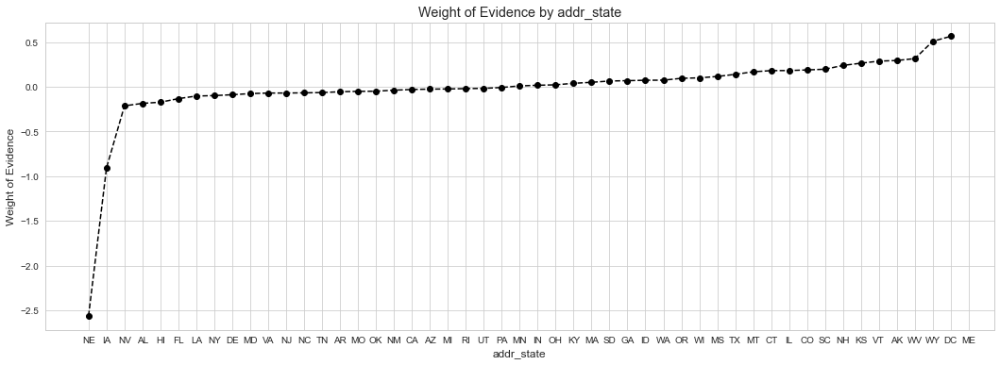

In [29]:
# 'ND' 'NE' 'IA' NV' 'FL' 'HI' 'AL'
# We plot the weight of evidence values.
plot_by_woe(df_temp)


Um kategoriale Variablen wie den Bundesstaat („addr_state“) für ein logistisch-regressives Kreditrisikomodell nutzen zu können, wurde der Weight of Evidence (WoE) berechnet. Diese Transformation erlaubt es, die Beziehung zwischen dem Merkmal und dem Zielvariable (z. B. Kreditausfall) auf eine skalierte und modellkompatible Weise darzustellen.

Da einzelne Bundesstaaten nur wenige Beobachtungen enthalten oder sehr extreme WoE-Werte aufweisen, ist es sinnvoll, diese Staaten in Gruppen mit ähnlichem Risikoprofil zusammenzufassen. Ziel ist es, stabile und generalisierbare Prädiktoren zu schaffen, die sowohl interpretierbar als auch robust gegenüber Ausreißern und Datenknappheit sind. Die Gruppe mit dem höchsten Risiko dient dabei als Referenzkategorie.


- In der Ergebnistabelle erscheinen lediglich 50 Bundesstaaten. Grund dafür ist, dass aus North Dakota (ND) offenbar keine Kreditnehmer im Datensatz enthalten sind. Um zukünftige Fälle aus diesem Bundesstaat dennoch korrekt verarbeiten zu können, wird eine eigene Dummy-Variable für ND vorgesehen.

- Beim Vergleich der WoE-Werte zeigt sich, dass insbesondere **Nebraska (NE) und Iowa (IA)** deutlich niedrigere Werte aufweisen als die übrigen Staaten. Im ursprünglichen Diagramm erweckte dies den Eindruck, dass alle Bundesstaaten ähnliche WoE-Werte hätten – was jedoch auf die extremen Ausreißer zurückzuführen ist.

- Die drei nachfolgenden Staaten weisen vergleichbare, aber immer noch unterdurchschnittliche WoE-Werte auf. Am anderen Ende des Spektrums liegt **Maine (ME)** mit einem besonders hohen WoE-Wert. Für einen weiteren Bundesstaat konnte der WoE-Wert nicht berechnet werden, da keine negativen Kreditereignisse („bad loans“) vorlagen.

- Da die ersten beiden und die letzten beiden Bundesstaaten jeweils nur sehr wenige Beobachtungen enthalten, erscheinen ihre extremen WoE-Werte wenig belastbar. Eine separate Kategorisierung wäre daher nicht sinnvoll. **Stattdessen werden sie der ersten (schlechtesten) bzw. letzten (besten) Kategorie zugeordnet.







In [30]:
if ['addr_state:ND'] in df_inputs_prepr.columns.values:
    print('a')
else:
    df_inputs_prepr['addr_state:ND'] = 0

**Nun richten wir unsere Aufmerksamkeit auf die übrigen 46 Bundesstaaten.**

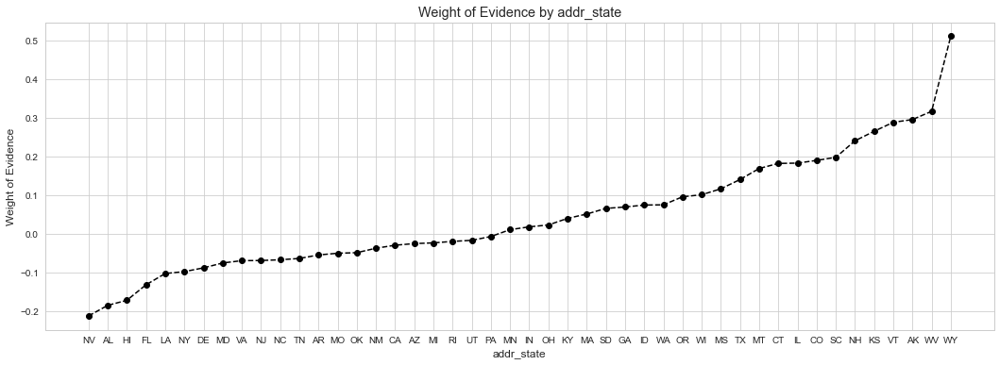

In [31]:
plot_by_woe(df_temp.iloc[2: -2, : ])
# We plot the weight of evidence values.

- **'ND' 'NE' 'IA' NV' 'AL' 'FL' 'HI'**  werden zusammengefasst, da sie einen extrem niedrigen Anteil an Beobachtungen aufweisen, was zu diesen WoE-Werten führt. Diese Gruppe bildet die Referenzkategorie für addr_state, da sie das höchste Risiko darstellen.


- **'OK' 'LA' 'NC' NM ' 'MO'   'VA ' 'NJ'** werden zusammengefasst, da sie einen niedrigen Anteil an Beobachtungen und ähnliche WoE-Werte aufweisen.


- **'MD', 'TN', 'AZ','PA'** werden zusammengefasst, da sind  ähnliche WoE-Werte aufweisen.


- **'MI' 'DE' 'AR'** werden zusammengefasst, da sind  ähnliche WoE-Werte aufweisen.


- **'UT' 'MN' 'OH' 'NI' 'GA' 'RI' 'WA'** werden zusammengefasst, da sie einen niedrigen Anteil an Beobachtungen und ähnliche WoE-Werte aufweisen.



- **'DC', 'ME', 'WY'** werden zusammengefasst, da sie einen niedrigen Anteil an Beobachtungen und ähnliche WoE-Werte haben.


**Nun richten wir unsere Aufmerksamkeit auf die übrigen 38 Bundesstaaten.**

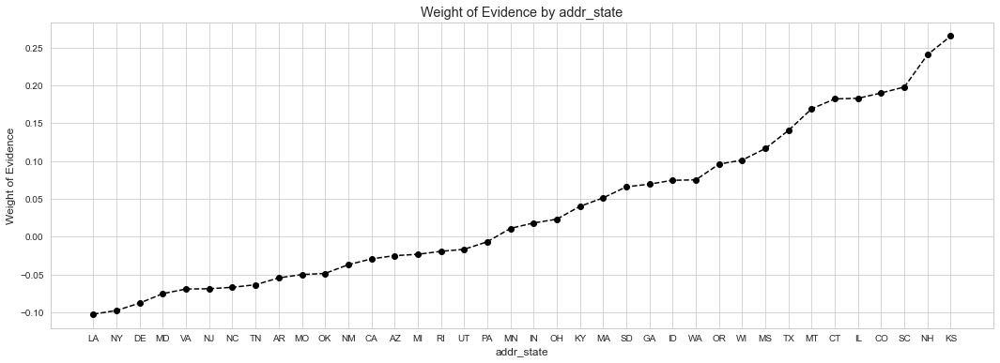

In [32]:
# We plot the weight of evidence values.
plot_by_woe(df_temp.iloc[6:-6 , : ])


Lass uns versuchen, die Kategorien zu erstellen, angefangen bei den Bundesstaaten mit dem niedrigsten Weight of Evidence. In diesem letzten Diagramm haben alle Bundesstaaten, vom New Mexico bis Kalifornien, CA, ähnliche WoE-Werte. Aber wir müssen auch die Anzahl der Kreditnehmer berücksichtigen.

- Drei Bundesstaaten zeichnen sich durch eine besonders hohe Anzahl an Kreditnehmern aus: **New York, Kalifornien und Texas**. Diese werden jeweils als eigene Gruppen behandelt.


- **'OK' 'LA' 'NC' NM ' 'MO'   'VA ' 'NJ'**  werden zusammengefasst, da sie einen ähnliche WoE-Werte aufweisen.


- **'MD', 'TN', 'AZ' ,'PA' und 'MI'** werden zusammengefasst, da sie einen niedrigen Anteil an Beobachtungen und ähnliche WoE-Werte haben.


- **'DE', 'AR'** werden zusammengefasst, da sie einen ähnliche WoE-Werte aufweisen.


-  **'UT' ,'MN', 'OH', 'IN', 'GA', 'RI', 'WA'** werden zusammengefasst, da sie einen ähnliche WoE-Werte aufweisen.


- **'OR', 'KY', 'MA',** werden zusammengefasst, da sie einen ähnliche WoE-Werte aufweisen.


- **MT, MS,  SD** werden zusammengefasst, da sie einen ähnliche WoE-Werte aufweisen.


- **'WI', 'IL', 'CT', 'AK'**  werden zusammengefasst, da sie einen niedrigen Anteil an Beobachtungen und ähnliche WoE-Werte haben.


- **'CO', 'SC'** werden zusammengefasst, da sie einen ähnliche WoE-Werte aufweisen.


- **'KS', 'NH','WV','VT', 'ID'**w erden zusammengefasst, da sie einen ähnliche WoE-Werte aufweisen.


- **WY ,DC , ME** werden zusammengefasst, da sie einen ähnliche WoE-Werte aufweisen.

**Denke daran, dass wir bereits Dummy-Variablen für alle einzelnen Bundesstaaten haben.
Daher können wir für die Kategorien, die nur aus einem Bundesstaat bestehen, diese vorhandenen Dummy-Variablen verwenden und müssen keine neuen erstellen.**

In [33]:
# 'ND' 'NE' 'IA' NV' 'AL' 'FL' 'HI' 
#  NY
# 'OK' 'LA' 'NC' NM ' 'MO'   'VA ' 'NJ' 
# MD, TN, AZ, PA, MI
# CA
# DE AR
# UT MN OH IN GA RI WA
# OR KY MA 
# MT MS SD
# TX 
# WI IL CT  AK 
# CO, SC
# KS, NH,WV,VT, ID ,
# WY,DC, ME,
# 'IA_NV_HI_ID_AL_FL' will be the reference category.


# 'ND' 'NE' 'IA' NV' 'AL' 'FL' 'HI' 
df_inputs_prepr['addr_state:ND_NE_IA_NV_FL_HI_AL'] = sum([df_inputs_prepr['addr_state:ND'], df_inputs_prepr['addr_state:NE'],
                                              df_inputs_prepr['addr_state:IA'], df_inputs_prepr['addr_state:NV'],
                                              df_inputs_prepr['addr_state:FL'], df_inputs_prepr['addr_state:HI'],
                                                          df_inputs_prepr['addr_state:AL']])

# 'OK' 'LA' 'NC' NM ' 'MO'   'VA ' 'NJ' 
df_inputs_prepr['addr_state:OK_LA_NC_NM_MO_VA_NJ'] = sum([df_inputs_prepr['addr_state:OK'], df_inputs_prepr['addr_state:LA'],
                                              df_inputs_prepr['addr_state:NC'], df_inputs_prepr['addr_state:NM'],
                                              df_inputs_prepr['addr_state:MO'], df_inputs_prepr['addr_state:VA'],
                                              df_inputs_prepr['addr_state:MO'], df_inputs_prepr['addr_state:NJ']])

# MD, TN, AZ, PA, MI
df_inputs_prepr['addr_state:MD_TN_AZ_PA_MI'] = sum([df_inputs_prepr['addr_state:MD'], df_inputs_prepr['addr_state:TN'],
                                              df_inputs_prepr['addr_state:AZ'], df_inputs_prepr['addr_state:PA'],
                                            df_inputs_prepr['addr_state:MI']])

# DE AR
df_inputs_prepr['addr_state:DE_AR'] = sum([df_inputs_prepr['addr_state:DE'], df_inputs_prepr['addr_state:AR']])


# UT MN OH IN GA RI WA
df_inputs_prepr['addr_state:UT_MN_OH_IN_GA_ RI_WA'] = sum([df_inputs_prepr['addr_state:UT'], df_inputs_prepr['addr_state:MN'],
                                              df_inputs_prepr['addr_state:OH'], df_inputs_prepr['addr_state:IN'],
                                              df_inputs_prepr['addr_state:GA'], df_inputs_prepr['addr_state:RI'], 
                                              df_inputs_prepr['addr_state:WA']])

# OR KY MA 
df_inputs_prepr['addr_state:OR_KY_MA'] = sum([df_inputs_prepr['addr_state:OR'], df_inputs_prepr['addr_state:KY'],
                                              df_inputs_prepr['addr_state:MA']])


# MT MS SD
df_inputs_prepr['addr_state:MT_MS_SD'] = sum([df_inputs_prepr['addr_state:MT'], df_inputs_prepr['addr_state:MS'],
                                              df_inputs_prepr['addr_state:SD']])

# WI IL CT  AK 
df_inputs_prepr['addr_state:WI_IL_CT_AK'] = sum([df_inputs_prepr['addr_state:WI'], df_inputs_prepr['addr_state:IL'],
                                               df_inputs_prepr['addr_state:CT'],df_inputs_prepr['addr_state:AK']])                                                                                                                                                                       
                                                                                                                                                                      
# CO, SC                                                    
df_inputs_prepr['addr_state:CO_SC'] = sum([df_inputs_prepr['addr_state:CO'], df_inputs_prepr['addr_state:SC']])
                                                 
                                                 
                                                 
# KS, NH,WV,VT, ID ,                                                                                            
df_inputs_prepr['addr_state:KS_NH_WV_VT_ID'] = sum([df_inputs_prepr['addr_state:KS'], df_inputs_prepr['addr_state:NH'],
                                              df_inputs_prepr['addr_state:WV'], df_inputs_prepr['addr_state:VT'],
                                              df_inputs_prepr['addr_state:ID']])
                                                 
# WY,DC, ME,                                                                                               
df_inputs_prepr['addr_state:WY_DC_ME'] = sum([df_inputs_prepr['addr_state:WY'], df_inputs_prepr['addr_state:DC'],
                                              df_inputs_prepr['addr_state:ME']])
                                                 

· ‘verification_status’;

· ‘purpose’;

· ‘initial_list_status’.

### 3.4 Variable: Vertrauenswürdig die Einkommensangaben ('verification_status')

Diese kategorische Variable gibt an, ob und in welchem Umfang das vom Kreditnehmer angegebene Einkommen verifiziert wurde. Sie ist für die Bonitätsbewertung entscheidend, da nicht verifizierte Einkommen mit erhöhtem Kreditausfallrisiko korrelieren.

In [34]:
# 'verification_status'
df_temp = woe_discrete(df_inputs_prepr, 'verification_status', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,verification_status,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,Verified,134404,0.862817,0.360305,115966.0,18438.0,0.352748,0.416414,-0.165926,NaN,NaN,0.020228
1,Source Verified,120187,0.884946,0.322193,106359.0,13828.0,0.323525,0.312300,0.035315,0.022129,0.201241,0.020228
2,Not Verified,118437,0.898579,0.317502,106425.0,12012.0,0.323726,0.271286,0.176725,0.013633,0.141410,0.020228


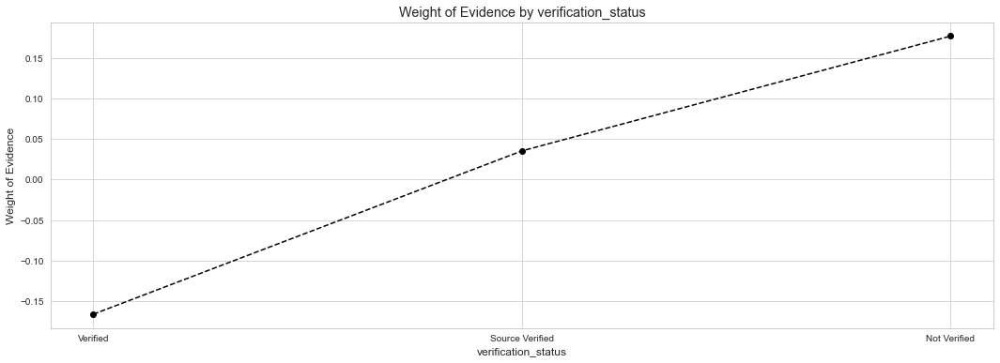

In [35]:
plot_by_woe(df_temp)
# We plot the weight of evidence values.

Die Variable verification_status hat eine gewisse, aber schwache Vorhersagekraft.

- Alle drei Kategorien verhalten sich unterschiedlich:

- Die Variable sollte nicht zusammengefasst werden, da sich insbesondere "Verified" und "Not Verified" klar unterscheiden.

- Es ist nicht empfehlenswert, sie zu gruppieren, sondern besser als drei separate Dummy-Variablen im Modell zu lassen (One-Hot-Encoding).

- Die Variable verification_status hat eine gewisse, aber schwache Vorhersagekraft.


### 3.5 Variable: wie der Kredit ursprünglich auf der Plattform gelistet wurde ('initial_list_status')


Diese Variable kann indirekt etwas über das wahrgenommene Risiko oder die Zielgruppe des Kredits aussagen:

- Kredite mit f (fractional)` wurden meist öffentlich angeboten → viele private Investoren → mehr Streuung.

- Kredite mit w (whole)` waren meist für institutionelle Anleger reserviert → eventuell bessere Bonität oder stabileres Profil.

In [36]:
# 'initial_list_status'
df_temp = woe_discrete(df_inputs_prepr, 'initial_list_status', df_targets_prepr)
df_temp

,initial_list_status,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,f,242463,0.871362,0.649986,211273.0,31190.0,0.642656,0.704413,-0.091756,NaN,NaN,0.017384
1,w,130565,0.899759,0.350014,117477.0,13088.0,0.357344,0.295587,0.189737,0.028397,0.281493,0.017384


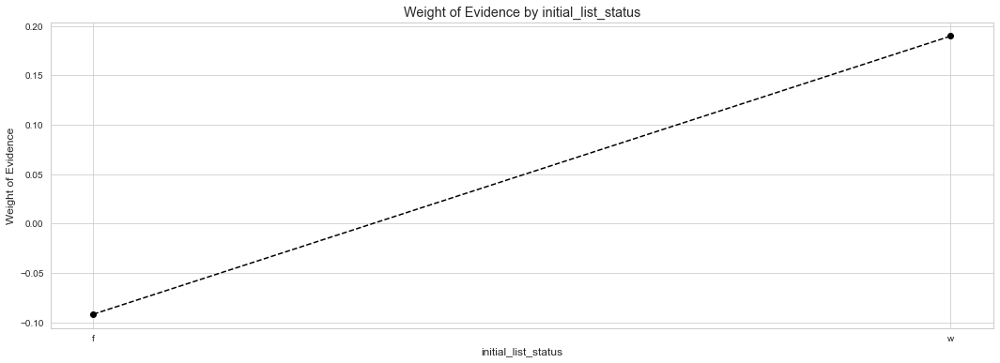

In [37]:
plot_by_woe(df_temp)

- Obwohl initial_list_status und verification_status keine starke Trennschärfe aufweisen, lässt sich dennoch eine gewisse Unterscheidung zwischen guten und schlechten Kreditnehmern in den jeweiligen Kategorien erkennen. Daher werden für beide Variablen Dummy-Variablen erstellt.

- Die Referenzkategorien werden diejenigen mit dem höchsten Kreditausfallrisiko bzw. dem niedrigsten WoE sein.

- Falls sich später herausstellt, dass diese Variablen keinen nennenswerten Beitrag zur Vorhersage der Ausfallwahrscheinlichkeit (PD) leisten, können sie anhand von p-Werten oder einer anderen Feature-Selection-Methode entfernt werden.

### 3.6 Variable: Verwendungszweck des Kredits“ ( 'purpose')

Die Variable purpose gibt den vom Kreditnehmer angegebenen Verwendungszweck des beantragten Kredits an. Sie ist eine kategorische Variable, die dabei hilft, die Motivation hinter der Kreditaufnahme zu verstehen.

Diese Variable wird häufig für die Bonitätsbewertung herangezogen, da der Verwendungszweck mit der Rückzahlungswahrscheinlichkeit korrelieren kann. Beispielsweise gelten Unternehmenszwecke (wie small_business) oft als risikoreicher als z. B. credit_card oder home_improvement.

In [38]:
# 'purpose'
df_temp = woe_discrete(df_inputs_prepr, 'purpose', df_targets_prepr)
# We calculate weight of evidence.
df_temp
# 'educational', 'small_business', 'wedding', 'renewable_energy', 'moving' und 'house'
# 'other', 'medical' und 'vacation'
# 'major_purchase', 'car' und 'home_improvement' 
# 'debt_consolidation'
# 'credit_card'

,purpose,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,small_business,5621,0.774239,0.015069,4352.0,1269.0,0.013238,0.028660,-0.772403,NaN,NaN,0.033728
1,educational,335,0.805970,0.000898,270.0,65.0,0.000821,0.001468,-0.580775,0.031731,0.191628,0.033728
2,moving,2385,0.838994,0.006394,2001.0,384.0,0.006087,0.008672,-0.354050,0.033024,0.226725,0.033728
3,house,1804,0.849778,0.004836,1533.0,271.0,0.004663,0.006120,-0.271947,0.010785,0.082103,0.033728
4,renewable_energy,290,0.851724,0.000777,247.0,43.0,0.000751,0.000971,-0.256621,0.001946,0.015325,0.033728
5,other,19030,0.854178,0.051015,16255.0,2775.0,0.049445,0.062672,-0.237060,0.002453,0.019562,0.033728
6,medical,3674,0.854927,0.009849,3141.0,533.0,0.009554,0.012038,-0.231035,0.000749,0.006025,0.033728
7,vacation,2001,0.870065,0.005364,1741.0,260.0,0.005296,0.005872,-0.103276,0.015138,0.127758,0.033728
8,wedding,1844,0.876356,0.004943,1616.0,228.0,0.004916,0.005149,-0.046446,0.006291,0.056830,0.033728
9,debt_consolidation,219582,0.876625,0.588648,192491.0,27091.0,0.585524,0.611839,-0.043962,0.000269,0.002484,0.033728


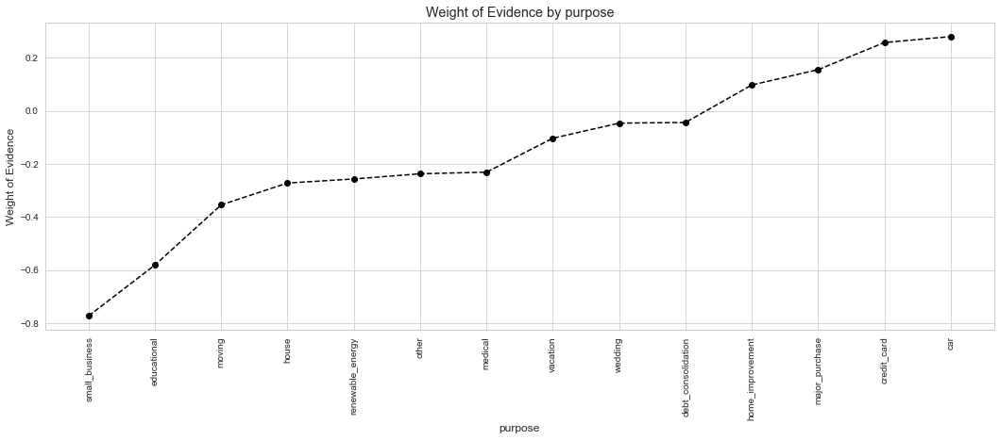

In [39]:
plot_by_woe(df_temp, 90)

In [40]:
# 'educational', 'small_business', 'wedding', 'renewable_energy', 'moving' und 'house'
# 'other', 'medical' und 'vacation'
# 'major_purchase', 'car' und 'home_improvement'
# 'debt_consolidation'
# 'credit_card'
df_inputs_prepr['purpose:educ__sm_b__wedd__ren_en__mov__house'] = sum([df_inputs_prepr['purpose:educational'], df_inputs_prepr['purpose:small_business'],
                                                                 df_inputs_prepr['purpose:wedding'], df_inputs_prepr['purpose:renewable_energy'],
                                                                 df_inputs_prepr['purpose:moving'], df_inputs_prepr['purpose:house']])


df_inputs_prepr['purpose:oth__med__vacation'] = sum([df_inputs_prepr['purpose:other'], df_inputs_prepr['purpose:medical'],
                                             df_inputs_prepr['purpose:vacation']])


df_inputs_prepr['purpose:major_purch__car__home_impr'] = sum([df_inputs_prepr['purpose:major_purchase'], df_inputs_prepr['purpose:car'],
                                                        df_inputs_prepr['purpose:home_improvement']])

- **'small_business', 'educational' und 'renewable_energy'** sind die drei häufigsten Kreditverwendungszwecke mit dem höchsten Kreditausfallrisiko. **'credit_card, car und 'debt_consolidation'** gehören zu den drei mit dem geringsten Risiko.

- Wir fassen folgende Kategorien zu einer Gruppe zusammen: **'educational', 'small_business', 'wedding', 'renewable_energy', 'moving' und 'house'**. Diese neue Kategorie nennen wir 'educ__sm_b__wedd__ren_en__mov__house'. Sie werden zusammengefasst, da sie sowohl einen geringen Anteil an Beobachtungen als auch ein gemeinsam hohes Kreditrisiko aufweisen. Da sie das höchste WoE (und Risiko) habe

- Die Kategorien **'other', 'medical' und 'vacation'** werden zur Gruppe 'oth__med__vacation' zusammengefasst, da sie ebenfalls einen geringen Anteil an Beobachtungen und ein ähnliches Risiko aufweisen.

- Die Kategorien **'major_purchase', 'car' und 'home_improvement'** werden zur Gruppe 'major_purch__car__home_impr' zusammengefasst da sie einen relativ geringen Anteil an Beobachtungen und ein ähnliches Kreditrisiko aufweisen.

- **'debt_consolidation'** erhält eine eigene Dummy-Variable, da diese Kategorie einen sehr hohen Anteil an Beobachtungen ausmacht (etwa 58 %) und  bleibt als eigenständige Kategorie bestehen.

- **'credit_card'** erhält ebenfalls eine eigene Dummy-Variable, da diese Kategorie etwa 22 % der Beobachtungen ausmacht und bleibt ebenfalls als eigenständige Kategorie bestehen.

- Die Gruppe 'educ__sm_b__wedd__ren_en__mov__house' wird als Referenzkategorie verwendet.

### Vorgehensweise zur Vorbereitung kontinuierlicher Variablen

Nachdem die diskreten Variablen bereits mittels Weight of Evidence (WoE) analysiert und in geeignete Kategorien überführt wurden, wurde nun ein vergleichbarer Ansatz auf kontinuierliche Variablen angewendet – mit einer zusätzlichen Vorstufe:

1- **Diskretisierung:** Kontinuierliche Variablen wurden zunächst in sinnvolle Intervalle (Bins) unterteilt, um sie in kategorischer Form weiterverarbeiten zu können.

2- **Berechnung von WoE und IV:** Für jede dieser neuen Kategorien wurde – analog zu den diskreten Variablen – das Weight of Evidence (WoE) und der Informationswert (IV) berechnet. Dies dient der Einschätzung der Trennschärfe zwischen "guten" und "schlechten" Fällen in jeder Kategorie.

3- **Anpassung der Sortierung:** Im Gegensatz zu diskreten Variablen, bei denen die Kategorien nach WoE-Werten sortiert werden, behalten kontinuierliche Variablen ihre natürliche Reihenfolge bei (z. B. nach aufsteigendem Wertebereich). Dadurch bleibt die zugrundeliegende quantitative Struktur erhalten.

4- **Wiederverwendung von Funktionen:** Es wurde möglichst auf bereits bestehende Funktionen zur WoE-Berechnung zurückgegriffen. Lediglich kleinere Anpassungen waren nötig – insbesondere beim Sortieren der Kategorien.

**Variablen:**

3.7 ‘term_int’;

3.8 'emp_length_int';

3.9 'mths_since_issue_d';

3.10 ‘interest rate"’;

3.11 'funded amount'

3.12 'months_since_earliest_cr_line'

3.13 'delinq_2yrs'

3.14 'inq_last_6mths'

3.15 'open_acc'

3.16 'pub_rec'

3.17 'total_acc'

3.18 'acc_now_delinq'

3.20 'total_rev_hi_lim_factor'

3.21 'installment_factor'

3.22 'annual_inc'

3.23 'mths_since_last_delinq'

3.24 'dti'

3.25 'mths_since_last_record'

Visualisierung: Die grafische Darstellung der WoE-Werte erfolgt anschließend analog zur diskreten Variante, mit der vorhandenen Plot-Funktion.

### Funktion: woe_ordered_continuous()

Diese Funktion berechnet den Weight of Evidence (WoE) und den Information Value (IV) für eine diskretisierte kontinuierliche Variable in Bezug auf eine binäre Zielvariable (z. B. "gut" vs. "schlecht" in der Kreditvergabe).

In [41]:
# Hier definieren wir eine Funktion, die der obigen ähnlich ist, ...
# ... mit einem kleinen Unterschied: Die Ergebnisse werden nach den Werten einer anderen Spalte sortiert.
# Die Funktion nimmt 3 Argumente entgegen: einen DataFrame, einen String und einen weiteren DataFrame.
# Die Funktion gibt einen DataFrame als Ergebnis zurück.
def woe_ordered_continuous(df, discrete_variabe_name, good_bad_variable_df):
    df = pd.concat([df[discrete_variabe_name], good_bad_variable_df], axis = 1)
    df = pd.concat([df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].count(),
                    df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].mean()], axis = 1)
    df = df.iloc[:, [0, 1, 3]]
    df.columns = [df.columns.values[0], 'n_obs', 'prop_good']
    df['prop_n_obs'] = df['n_obs'] / df['n_obs'].sum()
    df['n_good'] = df['prop_good'] * df['n_obs']
    df['n_bad'] = (1 - df['prop_good']) * df['n_obs']
    df['prop_n_good'] = df['n_good'] / df['n_good'].sum()
    df['prop_n_bad'] = df['n_bad'] / df['n_bad'].sum()
    df['WoE'] = np.log(df['prop_n_good'] / df['prop_n_bad'])
    #df = df.sort_values(['WoE'])
    #df = df.reset_index(drop = True)
    df['diff_prop_good'] = df['prop_good'].diff().abs()
    df['diff_WoE'] = df['WoE'].diff().abs()
    df['IV'] = (df['prop_n_good'] - df['prop_n_bad']) * df['WoE']
    df['IV'] = df['IV'].sum()
    return df

### Variable: Kreditlaufzeit (`term_int`)

Wir beginnen mit der Analyse der Variable `term_int`.  
Dabei handelt es sich um eine numerische Variable, die die **Laufzeit des Kredits in Monaten** als Ganzzahl angibt.

Wie zu erkennen ist, gibt es nur **zwei Ausprägungen**:  
- **36 Monate**  
- **60 Monate**

Diese beiden Werte repräsentieren die verfügbaren Kreditlaufzeiten in unserem Datensatz.


In [42]:
# term
# Nur zwei Werte  36 und 60.
df_inputs_prepr['term_int'].unique()

array([60, 36], dtype=int64)

In [43]:
df_temp = woe_ordered_continuous(df_inputs_prepr, 'term_int', df_targets_prepr)
df_temp

,term_int,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,36,270378,0.894574,0.72482,241873.0,28505.0,0.735735,0.643773,0.133524,NaN,NaN,0.03974
1,60,102650,0.846342,0.27518,86877.0,15773.0,0.264265,0.356227,-0.298616,0.048232,0.43214,0.03974


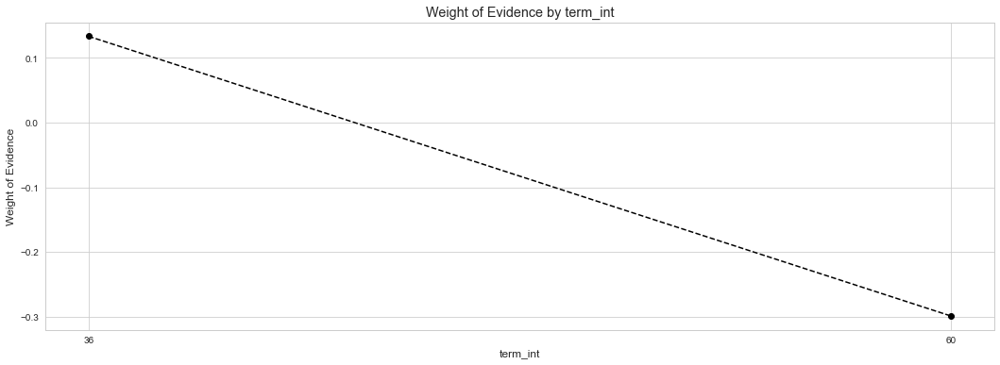

In [44]:
# We plot the weight of evidence values.
plot_by_woe(df_temp)

Die Analyse zeigt, dass **Kredite mit einer Laufzeit von 60 Monaten deutlich risikoreicher** sind als solche mit 36 Monaten.

Für das finale Modell behalten wir daher zwei Kategorien bzw. Dummy-Variablen bei:
- **36 Monate**
- **60 Monate**

Dabei setzen wir die **60 Monate** als **Referenzkategorie**.

Um dies im Modell zu berücksichtigen, erstellen wir eine neue Spalte im Eingabedatenrahmen mit dem Namen `term_preprocessed_36`.

Diese neue Variable erhält:
- den Wert **1**, wenn die ursprüngliche `term`-Variable den Wert **36** hat,  
- und den Wert **0** in allen anderen Fällen.


In [45]:
# Leave as is.
# '60' will be the reference category.
df_inputs_prepr['term:36'] = np.where((df_inputs_prepr['term_int'] == 36), 1, 0)
df_inputs_prepr['term:60'] = np.where((df_inputs_prepr['term_int'] == 60), 1, 0)

###  Variable: Beschäftigungsdauer (emp_length_int)

Zur Analyse der Beschäftigungsdauer haben wir eine Variable mit dem Namen `emp_length_int` erstellt.  
Diese enthält ganzzahlige Werte, die die Anzahl der Beschäftigungsjahre angeben.  
Die Werte reichen von **0 bis 10** und bilden damit **11 diskrete Stufen**,  
die die Dauer der Berufstätigkeit in Jahren widerspiegeln.


In [46]:
# Has only 11 levels: from 0 to 10. Hence, we turn it into a factor with 11 levels.
# emp_length_int
df_inputs_prepr['emp_length_int'].unique()


array([ 8.,  7., 10.,  3.,  1.,  6.,  0.,  2.,  9.,  5.,  4., -1.])

In [47]:
df_temp = woe_ordered_continuous(df_inputs_prepr, 'emp_length_int', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,emp_length_int,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,-1.0,16682,0.860748,0.044721,14359.0,2323.0,0.043678,0.052464,-0.183292,NaN,NaN,0.005848
1,0.0,29060,0.871955,0.077903,25339.0,3721.0,0.077077,0.084037,-0.086457,0.011206,0.096835,0.005848
2,1.0,23719,0.880433,0.063585,20883.0,2836.0,0.063522,0.064050,-0.008269,0.008479,0.078189,0.005848
3,2.0,33090,0.881173,0.088706,29158.0,3932.0,0.088694,0.088803,-0.001229,0.000739,0.007040,0.005848
4,3.0,29349,0.879110,0.078678,25801.0,3548.0,0.078482,0.080130,-0.020780,0.002063,0.019552,0.005848
5,4.0,22519,0.881655,0.060368,19854.0,2665.0,0.060392,0.060188,0.003392,0.002545,0.024172,0.005848
6,5.0,24644,0.874493,0.066065,21551.0,3093.0,0.065554,0.069854,-0.063529,0.007163,0.066921,0.005848
7,6.0,20799,0.872686,0.055757,18151.0,2648.0,0.055212,0.059804,-0.079889,0.001807,0.016360,0.005848
8,7.0,20995,0.879066,0.056283,18456.0,2539.0,0.056140,0.057342,-0.021190,0.006380,0.058698,0.005848
9,8.0,17972,0.880703,0.048179,15828.0,2144.0,0.048146,0.048421,-0.005702,0.001637,0.015488,0.005848


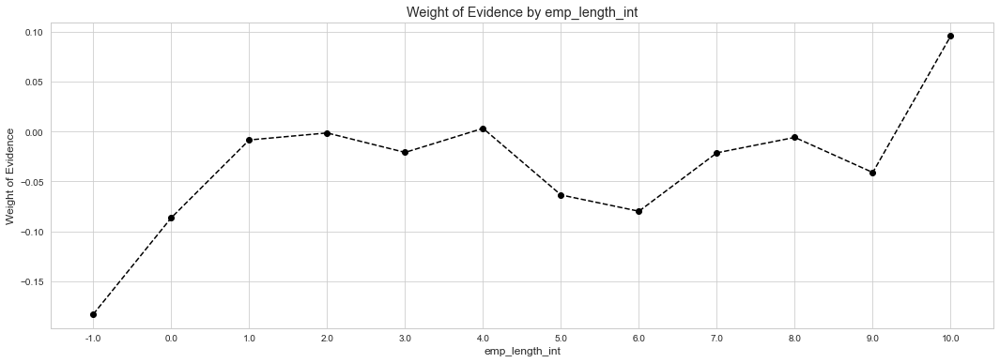

In [48]:
plot_by_woe(df_temp)
# We plot the weight of evidence values.

In [49]:
# We create the following categories: '0', '1', '2 - 4', '5 - 6', '7 - 9', '10'
# '0' will be the reference category
df_inputs_prepr['emp_length:0'] = np.where(df_inputs_prepr['emp_length_int'].isin([0]), 1, 0)
df_inputs_prepr['emp_length:1'] = np.where(df_inputs_prepr['emp_length_int'].isin([1]), 1, 0)
df_inputs_prepr['emp_length:2-4'] = np.where(df_inputs_prepr['emp_length_int'].isin(range(2, 5)), 1, 0)
df_inputs_prepr['emp_length:5-6'] = np.where(df_inputs_prepr['emp_length_int'].isin(range(5, 7)), 1, 0)
df_inputs_prepr['emp_length:7-9'] = np.where(df_inputs_prepr['emp_length_int'].isin(range(7, 10)), 1, 0)
df_inputs_prepr['emp_length:10'] = np.where(df_inputs_prepr['emp_length_int'].isin([10]), 1, 0)

Anhand der Entwicklung des **Weight of Evidence (WoE)** in Abhängigkeit von der **Beschäftigungsdauer** lässt sich die Variable in sinnvolle **Kategorien für das PD-Modell (Probability of Default)** einteilen.  
Dabei gibt es **nicht nur eine „richtige“ Lösung** – das Ziel ist es, eine **Balance zwischen Aussagekraft und Modellkomplexität** zu finden.

---

#### Gewählte Gruppierung:

- **0 Jahre Beschäftigung**  
  Höchstes Ausfallrisiko → wird als **Referenzkategorie** im Modell verwendet.

- **1 Jahr**  
  Deutlich anderer WoE-Wert als 0 Jahre → **eigene Kategorie**

- **2 bis 4 Jahre**  
  Ähnliche WoE-Werte → **zusammengefasst in eine Kategorie**

- **5 bis 6 Jahre**  
  Stabil niedriger WoE-Wert → **eigene Kategorie**

- **7 bis 9 Jahre**  
  Vergleichbare WoE-Werte → **gemeinsame Kategorie**

- **10 Jahre oder mehr**  
  Höchster WoE-Wert, viele Beobachtungen (~1/3) → **eigene Kategorie**

---

####  Ziel der Gruppierung

- **Weniger Dummy-Variablen** → einfaches & interpretierbares Modell  
- **Hohe Trennschärfe** → zuverlässige Risikodifferenzierung  
- **Robustheit und Generalisierbarkeit** → durch Zusammenfassung ähnlicher Gruppen



###  Variable: Ausgabe des jeweiligen Kredits vergangen sind  ('mths_since_issue_d')
Die Variable `mths_since_issue_d` gibt an, wie viele Monate seit der Ausgabe des jeweiligen Kredits vergangen sind. Sie enthält etwa **90 verschiedene ganzzahlige Werte**.

Um diese Variable für das Modell aufzubereiten, gehen wir in zwei Schritten vor:



#### 1. **Feine Klassifikation (Fine Classing)**  
Zunächst unterteilen wir die Variable in ca. **50 Gruppen**, um eine feinere Auflösung zu erhalten. Dabei entstehen **gleichmäßig verteilte Kategorien** entlang der Wertebereiche.



#### 2. **Grobe Klassifikation (Coarse Classing)**  
Anschließend fassen wir die feineren Gruppen auf Basis ihrer **Ähnlichkeiten im Verhalten** (z. B. in Bezug auf das Ausfallrisiko) zu größeren Kategorien zusammen.  
Dies reduziert die **Komplexität** und erleichtert die **Modellinterpretation**.



#### 3. **Berechnung des WoE (Weight of Evidence)**  
Für jede der neu gebildeten Kategorien berechnen wir den **Weight of Evidence (WoE)**.  
Dieser hilft uns dabei, das Verhältnis von **"guten" zu "schlechten" Kreditnehmern** je Kategorie zu bewerten.

---

Die entstehenden Intervalle sind dabei selbstverständlich in **aufsteigender Reihenfolge** sortiert – beginnend mit dem Intervall, das die **niedrigsten Werte** (also die **ältesten Kredite**) umfasst.


In [50]:
# mths_since_issue_d
df_inputs_prepr['mths_since_issue_d'].unique()

array([ 38,  49,  55,  74,  46,  78,  57,  40,  53,  37,  52,  42,  39,
        60,  51,  72,  61,  50,  64,  69,  41,  44,  48,  56,  36,  45,
        80,  95,  70,  59,  63,  79,  93,  62,  65,  88, 107,  58,  73,
        47,  98,  68,  54,  43,  71,  86,  85,  83,  77, 117,  75,  67,
        82,  84,  99, 101,  91,  81, 116,  66, 106,  90, 103,  76, 108,
        89,  96, 118,  92, 102,  87, 109, 114, 111, 100, 104, 120,  97,
       110, 121,  94, 113, 105, 115, 119, 122, 112, 124, 126, 125, 123],
      dtype=int64)

In [51]:
# Here we do fine-classing: using the 'cut' method, we split the variable into 50 categories by its values.
df_inputs_prepr['mths_since_issue_d_factor'] = pd.cut(df_inputs_prepr['mths_since_issue_d'], 50)


In [52]:
df_inputs_prepr['mths_since_issue_d_factor'] 

427211      (37.8, 39.6]
206088      (48.6, 50.4]
136020      (54.0, 55.8]
412305      (37.8, 39.6]
36159       (73.8, 75.6]
260400      (45.0, 46.8]
29626       (77.4, 79.2]
117003      (55.8, 57.6]
378696      (39.6, 41.4]
159555      (52.2, 54.0]
258931      (45.0, 46.8]
435023     (35.91, 37.8]
434939     (35.91, 37.8]
166714      (50.4, 52.2]
397514      (37.8, 39.6]
412695      (37.8, 39.6]
326791      (41.4, 43.2]
399112      (37.8, 39.6]
386208      (37.8, 39.6]
90207       (59.4, 61.2]
177298      (50.4, 52.2]
41491       (70.2, 72.0]
84297       (59.4, 61.2]
193825      (48.6, 50.4]
391693      (37.8, 39.6]
431675     (35.91, 37.8]
66434       (63.0, 64.8]
454638     (35.91, 37.8]
89746       (59.4, 61.2]
50163       (68.4, 70.2]
367344      (39.6, 41.4]
349219      (39.6, 41.4]
346074      (39.6, 41.4]
290389      (43.2, 45.0]
214844      (48.6, 50.4]
222888      (46.8, 48.6]
122435      (55.8, 57.6]
465903     (35.91, 37.8]
390024      (37.8, 39.6]
377139      (39.6, 41.4]


In [53]:
# mths_since_issue_d
df_temp = woe_ordered_continuous(df_inputs_prepr, 'mths_since_issue_d_factor', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,mths_since_issue_d_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(35.91, 37.8]",28164,0.928100,0.075501,26139.0,2025.0,0.079510,0.045734,0.553049,NaN,NaN,0.078922
1,"(37.8, 39.6]",39434,0.916443,0.105713,36139.0,3295.0,0.109929,0.074416,0.390157,0.011657,0.162892,0.078922
2,"(39.6, 41.4]",38612,0.905263,0.103510,34954.0,3658.0,0.106324,0.082614,0.252307,0.011180,0.137850,0.078922
3,"(41.4, 43.2]",29087,0.894902,0.077975,26030.0,3057.0,0.079179,0.069041,0.137006,0.010361,0.115301,0.078922
4,"(43.2, 45.0]",28532,0.890719,0.076488,25414.0,3118.0,0.077305,0.070419,0.093299,0.004182,0.043707,0.078922
5,"(45.0, 46.8]",12189,0.890721,0.032676,10857.0,1332.0,0.033025,0.030083,0.093319,0.000002,0.000020,0.078922
6,"(46.8, 48.6]",24493,0.886253,0.065660,21707.0,2786.0,0.066029,0.062921,0.048218,0.004468,0.045101,0.078922
7,"(48.6, 50.4]",22910,0.879921,0.061416,20159.0,2751.0,0.061320,0.062130,-0.013123,0.006332,0.061342,0.078922
8,"(50.4, 52.2]",20521,0.871400,0.055012,17882.0,2639.0,0.054394,0.059601,-0.091415,0.008521,0.078292,0.078922
9,"(52.2, 54.0]",18242,0.858513,0.048902,15661.0,2581.0,0.047638,0.058291,-0.201813,0.012887,0.110398,0.078922


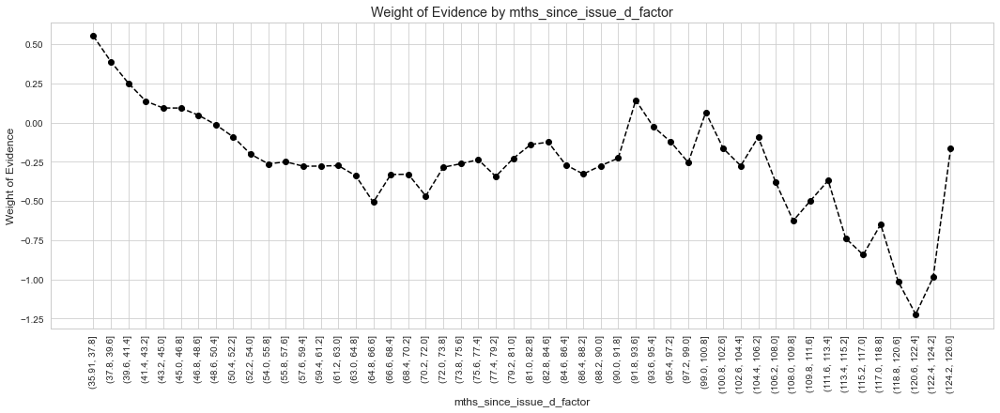

In [54]:
plot_by_woe(df_temp, 90)
# We plot the weight of evidence values, rotating the labels 90 degrees.

In [55]:
# We create the following categories:
# < 38, 38 - 39, 40 - 41, 42 - 48, 49 - 52, 53 - 64, 65 - 84, > 84.
df_inputs_prepr['mths_since_issue_d:<38'] = np.where(df_inputs_prepr['mths_since_issue_d'].isin(range(38)), 1, 0)
df_inputs_prepr['mths_since_issue_d:38-39'] = np.where(df_inputs_prepr['mths_since_issue_d'].isin(range(38, 40)), 1, 0)
df_inputs_prepr['mths_since_issue_d:40-41'] = np.where(df_inputs_prepr['mths_since_issue_d'].isin(range(40, 42)), 1, 0)
df_inputs_prepr['mths_since_issue_d:42-48'] = np.where(df_inputs_prepr['mths_since_issue_d'].isin(range(42, 49)), 1, 0)
df_inputs_prepr['mths_since_issue_d:49-52'] = np.where(df_inputs_prepr['mths_since_issue_d'].isin(range(49, 53)), 1, 0)
df_inputs_prepr['mths_since_issue_d:53-64'] = np.where(df_inputs_prepr['mths_since_issue_d'].isin(range(53, 65)), 1, 0)
df_inputs_prepr['mths_since_issue_d:65-84'] = np.where(df_inputs_prepr['mths_since_issue_d'].isin(range(65, 85)), 1, 0)
df_inputs_prepr['mths_since_issue_d:>84'] = np.where(df_inputs_prepr['mths_since_issue_d'].isin(range(85, int(df_inputs_prepr['mths_since_issue_d'].max()))), 1, 0)

Basierend auf der WoE-Analyse wird diese kontinuierliche Variable in sinnvolle Gruppen unterteilt. Die Einteilung erfolgt dabei sowohl nach dem Verlauf des WoE-Werts als auch unter Berücksichtigung der Anzahl der Beobachtungen je Kategorie.

[0–37 Monate]: Enthält die riskantesten Kategorien mit den höchsten WoE-Werten.

[38–39], [40–41] Monate: Eindeutig abgrenzbare Gruppen mit hohen WoE-Werten.

[42–48 Monate]: Vergleichsweise stabile WoE-Werte, daher zusammengefasst.

[49–52 Monate]: Ähnliche Struktur, eigene Gruppe.

[53–64 Monate]: Homogene Gruppe mit stabilen WoE-Werten.

[65–84 Monate], [>84 Monate]: Geringere Anzahl an Beobachtungen mit stark schwankendem WoE → separate Dummies sinnvoll.


Die vorgestellten Preprocessing-Schritte zeigen, wie kontinuierliche Variablen mithilfe des WoE sinnvoll kategorisiert werden können. Dies verbessert sowohl die Modellinterpretation als auch die Trennschärfe, ohne unnötig viele Dummy-Variablen zu erzeugen. Variablen ohne klares Risikomuster oder mit instabilen WoE-Werten werden ausgeschlossen, um die Modellqualität nicht zu gefährden.

### Variable: Zinssatz ("interest rate")

Der Zinssatz zeigt eine fast monotone Beziehung zum WoE: Je höher der Zinssatz, desto niedriger der WoE, was auf ein höheres Ausfallrisiko hindeutet.

.  <= 9.548%

. > 9.548% & <= 12.025%

. > 12.025% & <= 15.74%

. > 15.74% & <= 20.281%

. > 20.281%

Die Aufteilung erfolgt so, dass Sprünge im WoE sinnvoll abgebildet und Kategorien mit wenigen Beobachtungen zusammengefasst werden.

In [1]:
#df_inputs_prepr['int_rate'].unique()

In [57]:
# int_rate # Hier führen wir eine Feinklassifizierung durch: 
# Mit der Methode „cut“ teilen wir die Variable anhand ihrer Werte in 50 Kategorien auf.
df_inputs_prepr['int_rate_factor'] = pd.cut(df_inputs_prepr['int_rate'], 50)

In [58]:
df_temp = woe_ordered_continuous(df_inputs_prepr, 'int_rate_factor', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,int_rate_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(5.399, 5.833]",787,0.966963,0.002110,761.0,26.0,0.002315,0.000587,1.371727,NaN,NaN,0.339987
1,"(5.833, 6.246]",8379,0.977563,0.022462,8191.0,188.0,0.024916,0.004246,1.769540,0.010600,0.397812,0.339987
2,"(6.246, 6.658]",7826,0.965627,0.020980,7557.0,269.0,0.022987,0.006075,1.330709,0.011936,0.438831,0.339987
3,"(6.658, 7.071]",1859,0.966111,0.004984,1796.0,63.0,0.005463,0.001423,1.345373,0.000483,0.014664,0.339987
4,"(7.071, 7.484]",3152,0.976206,0.008450,3077.0,75.0,0.009360,0.001694,1.709413,0.010095,0.364040,0.339987
5,"(7.484, 7.897]",12659,0.960186,0.033936,12155.0,504.0,0.036973,0.011383,1.178110,0.016019,0.531303,0.339987
6,"(7.897, 8.31]",9664,0.946502,0.025907,9147.0,517.0,0.027824,0.011676,0.868329,0.013684,0.309781,0.339987
7,"(8.31, 8.722]",6522,0.961055,0.017484,6268.0,254.0,0.019066,0.005736,1.201069,0.014552,0.332740,0.339987
8,"(8.722, 9.135]",9468,0.932510,0.025381,8829.0,639.0,0.026856,0.014432,0.621083,0.028545,0.579986,0.339987
9,"(9.135, 9.548]",6663,0.959027,0.017862,6390.0,273.0,0.019437,0.006166,1.148208,0.026518,0.527125,0.339987


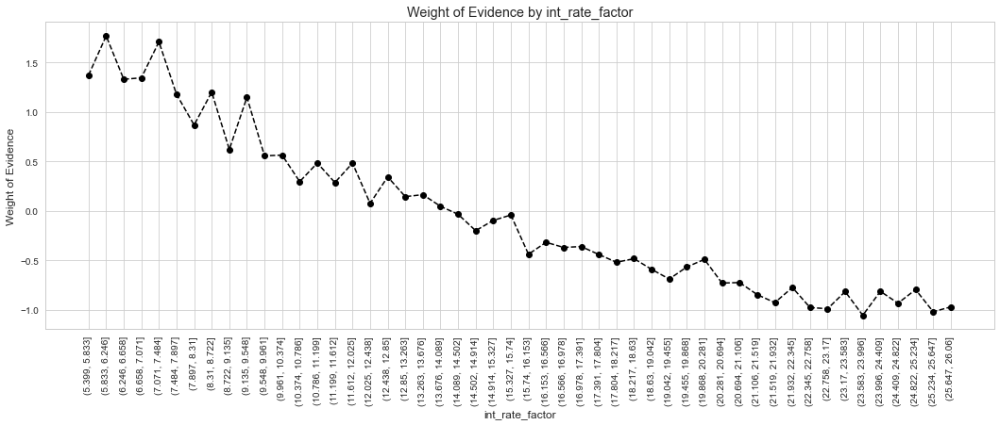

In [59]:
plot_by_woe(df_temp, 90)
# We plot the weight of evidence values.

**Analyse des Zinssatzes als Risikoindikator**

Die Gruppierung des Zinssatzes (int_rate_factor) zeigt einen klaren monotonen Zusammenhang mit dem Kreditrisiko:

- Niedrige Zinssätze (<8%) korrelieren mit positiven WoE-Werten (bis +1.77) → geringeres Ausfallrisiko

- Ab ~14.1% wechselt WoE ins Negative → Risiko über dem Durchschnitt

- Zinssätze >20% erreichen WoE bis -1.06 → Ausfallwahrscheinlichkeit 2.9× höher

Der Information Value (IV) von 0.34 klassifiziert die Variable als starken Prädiktor (IV > 0.3). Besonders kritisch:

Risikosprung bei ~12% Zinsen (WoE wird dauerhaft negativ)

Extremzone ab 20% (WoE < -0.73)

→ Die Variable eignet sich ideal für WoE-basiertes Feature-Engineering im Kredit-Scoring.

In [60]:
# '< 9.548', '9.548 - 12.025', '12.025 - 15.74', '15.74 - 20.281', '> 20.281'
df_inputs_prepr['int_rate:<9.548'] = np.where((df_inputs_prepr['int_rate'] <= 9.548), 1, 0)
df_inputs_prepr['int_rate:9.548-12.025'] = np.where((df_inputs_prepr['int_rate'] > 9.548) & (df_inputs_prepr['int_rate'] <= 12.025), 1, 0)
df_inputs_prepr['int_rate:12.025-15.74'] = np.where((df_inputs_prepr['int_rate'] > 12.025) & (df_inputs_prepr['int_rate'] <= 15.74), 1, 0)
df_inputs_prepr['int_rate:15.74-20.281'] = np.where((df_inputs_prepr['int_rate'] > 15.74) & (df_inputs_prepr['int_rate'] <= 20.281), 1, 0)
df_inputs_prepr['int_rate:>20.281'] = np.where((df_inputs_prepr['int_rate'] > 20.281), 1, 0)

Die Aufteilung des Zinssatzes in fünf Risikogruppen basiert auf der Weight-of-Evidence(WoE)-Analyse.

- Die Grenzen 9.548%, 12.025%, 15.74% und 20.281% markieren signifikante Risikosprünge:

- (<9.548%): Geringstes Ausfallrisiko (positive WoE)

- 12.025%: Schwelle zu überdurchschnittlichem Risiko (WoE wird negativ)

- (>20.281%): Höchstes Risiko (WoE < -0.73)

Die Gruppenbildung sichert einen monotonen Zusammenhang zwischen Zins und Risiko –
eine essentielle Voraussetzung für stabile logistische Regressionskoeffizienten.

### Variable: Finanziertes Kreditvolumen ("funded amount")

Die Analyse zeigt starke Schwankungen im WoE, jedoch ohne erkennbares Muster oder monotone Struktur. Zudem fehlt eine klare Beziehung zwischen dieser Variable und der Zielgröße. Mit anderen Worten: Der Weight of Evidence (WoE) schwankt stark, und es scheint keine erkennbare Verbindung zur unabhängigen Variable zu bestehen.

Entscheidung: Diese Variable wird nicht im Modell verwendet.

In [61]:
# funded_amnt
df_inputs_prepr['funded_amnt_factor'] = pd.cut(df_inputs_prepr['funded_amnt'], 50)
# Here we do fine-classing: using the 'cut' method, we split the variable into 50 categories by its values.
df_temp = woe_ordered_continuous(df_inputs_prepr, 'funded_amnt_factor', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,funded_amnt_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(465.5, 1190.0]",1248,0.893429,0.003346,1115.0,133.0,0.003392,0.003004,0.121451,NaN,NaN,0.01489
1,"(1190.0, 1880.0]",3103,0.898808,0.008318,2789.0,314.0,0.008484,0.007092,0.179236,0.005378,0.057785,0.01489
2,"(1880.0, 2570.0]",5984,0.888369,0.016042,5316.0,668.0,0.016170,0.015086,0.069379,0.010439,0.109857,0.01489
3,"(2570.0, 3260.0]",7276,0.884689,0.019505,6437.0,839.0,0.019580,0.018948,0.032798,0.003680,0.036581,0.01489
4,"(3260.0, 3950.0]",4782,0.884776,0.012819,4231.0,551.0,0.012870,0.012444,0.033649,0.000087,0.000852,0.01489
5,"(3950.0, 4640.0]",9016,0.880989,0.024170,7943.0,1073.0,0.024161,0.024233,-0.002977,0.003787,0.036626,0.01489
6,"(4640.0, 5330.0]",15905,0.886639,0.042638,14102.0,1803.0,0.042896,0.040720,0.052055,0.005650,0.055032,0.01489
7,"(5330.0, 6020.0]",17141,0.901814,0.045951,15458.0,1683.0,0.047021,0.038010,0.212739,0.015175,0.160684,0.01489
8,"(6020.0, 6710.0]",6913,0.876031,0.018532,6056.0,857.0,0.018421,0.019355,-0.049443,0.025784,0.262182,0.01489
9,"(6710.0, 7400.0]",11722,0.890804,0.031424,10442.0,1280.0,0.031763,0.028908,0.094166,0.014773,0.143609,0.01489


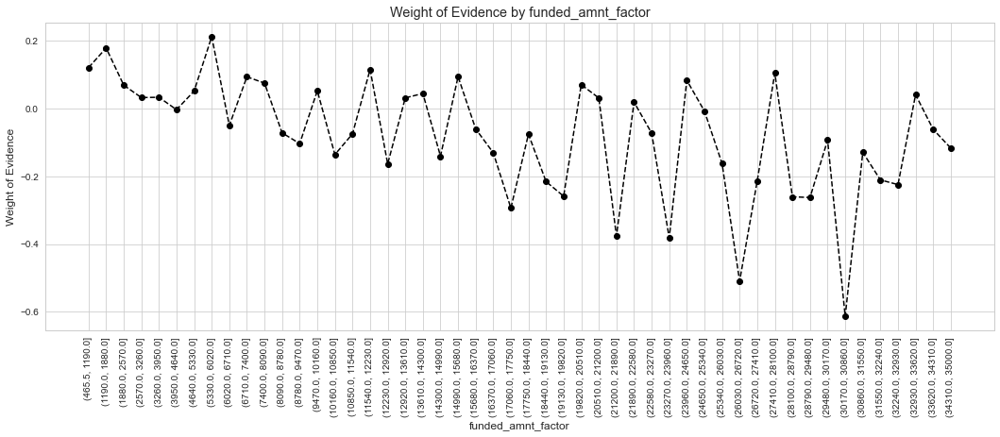

In [62]:
plot_by_woe(df_temp, 90)

### Data Preparation: Continuous Variables, Part 1 and 2: Homework

### Variable: Monate seit der ersten Kredithistorie (months_since_earliest_cr_line) 

Diese Variable misst die Zeitspanne (in Monaten) seit der ersten verzeichneten Kreditlinie eines Antragstellers – ein Indikator für die Länge der individuellen Kredithistorie.

In [63]:
# mths_since_earliest_cr_line
df_inputs_prepr['mths_since_earliest_cr_line_factor'] = pd.cut(df_inputs_prepr['months_since_earliest_cr_line'], 50)
# Here we do fine-classing: using the 'cut' method, we split the variable into 50 categories by its values.
df_temp = woe_ordered_continuous(df_inputs_prepr, 'mths_since_earliest_cr_line_factor', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,mths_since_earliest_cr_line_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(-0.58, 11.6]",26,0.884615,0.000070,23.0,3.0,0.000070,0.000068,0.032072,NaN,NaN,0.015289
1,"(11.6, 23.2]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.015289
2,"(23.2, 34.8]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.015289
3,"(34.8, 46.4]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.015289
4,"(46.4, 58.0]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.015289
5,"(58.0, 69.6]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.015289
6,"(69.6, 81.2]",628,0.898089,0.001684,564.0,64.0,0.001716,0.001445,0.171362,NaN,NaN,0.015289
7,"(81.2, 92.8]",1898,0.876185,0.005088,1663.0,235.0,0.005059,0.005307,-0.048017,0.021904,0.219378,0.015289
8,"(92.8, 104.4]",2779,0.840230,0.007450,2335.0,444.0,0.007103,0.010028,-0.344867,0.035955,0.296850,0.015289
9,"(104.4, 116.0]",4736,0.857475,0.012696,4061.0,675.0,0.012353,0.015245,-0.210338,0.017244,0.134529,0.015289


In [2]:
#df_inputs_prepr['months_since_earliest_cr_line'] #months_since_earliest_cr_line  mths_since_issue_d

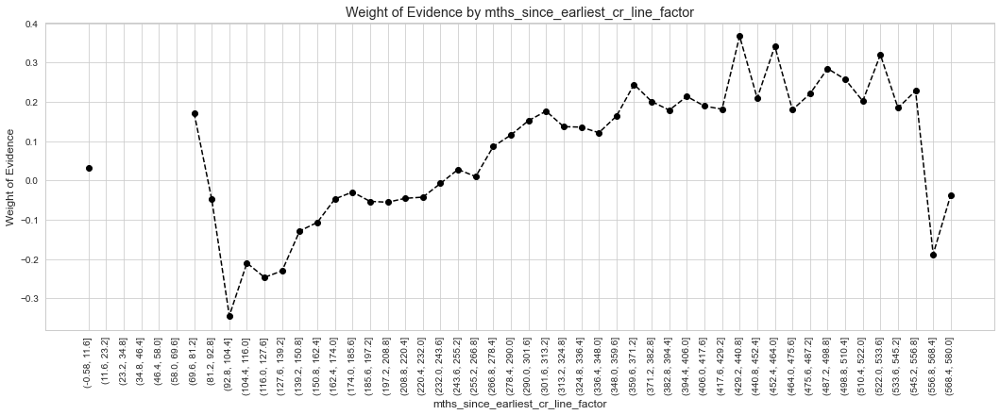

In [65]:
plot_by_woe(df_temp, 90)

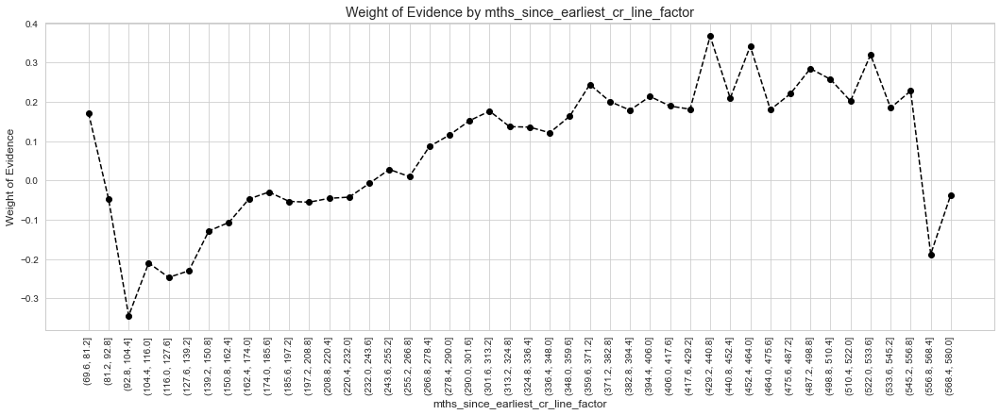

In [66]:
plot_by_woe(df_temp.iloc[6: , : ], 90)
# We plot the weight of evidence values.

In [67]:
# We create the following categories:
# < 140, # 141 - 164, # 165 - 247, # 248 - 270, # 271 - 352, # > 352
df_inputs_prepr['mths_since_earliest_cr_line:<140'] = np.where(df_inputs_prepr['months_since_earliest_cr_line'].isin(range(140)), 1, 0)
df_inputs_prepr['mths_since_earliest_cr_line:141-164'] = np.where(df_inputs_prepr['months_since_earliest_cr_line'].isin(range(140, 165)), 1, 0)
df_inputs_prepr['mths_since_earliest_cr_line:165-247'] = np.where(df_inputs_prepr['months_since_earliest_cr_line'].isin(range(165, 248)), 1, 0)
df_inputs_prepr['mths_since_earliest_cr_line:248-270'] = np.where(df_inputs_prepr['months_since_earliest_cr_line'].isin(range(248, 271)), 1, 0)
df_inputs_prepr['mths_since_earliest_cr_line:271-352'] = np.where(df_inputs_prepr['months_since_earliest_cr_line'].isin(range(271, 353)), 1, 0)
df_inputs_prepr['mths_since_earliest_cr_line:>352'] = np.where(df_inputs_prepr['months_since_earliest_cr_line'].isin(range(353, int(df_inputs_prepr['months_since_earliest_cr_line'].max()))), 1, 0)

Zur besseren Modellierbarkeit und um die Informationsstruktur dieser kontinuierlichen Variable zu erhalten, wurde eine binäre Kategorisierung (Dummy-Variablen) vorgenommen. Dabei wurde die Verteilung der Werte sowie deren Zusammenhang mit dem Ausfallrisiko berücksichtigt.

Die Einteilung erfolgte in folgende Gruppen:

-  < 140 Monate
Kurze Kredithistorie – potenziell höheres Risiko.

-  141–164 Monate
Etwas längere Historie mit leicht verbessertem Risikoprofil.

-  165–247 Monate
Reife Kredithistorie mit stabileren WoE-Werten.

- 248–270 Monate
Eigenständige Gruppe mit beobachteter WoE-Abweichung.

- 271–352 Monate
Sehr lange Historie, aber mit konsistentem Risikoverhalten.

- <> 352 Monate
Extrem lange Kredithistorie – potenziell sehr geringes Ausfallrisiko, aber geringe Anzahl an Beobachtungen.

Jede dieser Kategorien wurde in eine eigene Dummy-Variable umgewandelt. Dadurch bleibt die Struktur der ursprünglichen Verteilung erhalten, während gleichzeitig die Eingangsvariable für das Modell interpretiert und verarbeitet werden kann.

### Variable: Zahlungsausfälle in den letzten 2 Jahren (delinq_2yrs)
Diese Variable zeigt, wie häufig ein Kreditnehmer in den letzten zwei Jahren mit Zahlungen im Verzug war. Die Verteilung der WoE-Werte war in den höheren Ausprägungen inkonsistent, mit wenigen Beobachtungen und teils extremen Schwankungen.

Um die Trennschärfe zu verbessern und robuste Gruppen zu bilden, haben wir die Werte in drei Kategorien eingeteilt:

- delinq_2yrs:0 – Keine Zahlungsausfälle

- delinq_2yrs:1–3 – Vereinzelte Zahlungsausfälle

- delinq_2yrs:≥4 – Auffällige Häufung von Ausfällen

Diese Gruppierung berücksichtigt sowohl das Kreditrisiko als auch die Stabilität der WoE-Werte je Gruppe. Besonders hohe Werte wurden zusammengefasst, um Ausreißereffekte zu vermeiden.



In [68]:
# delinq_2yrs
df_temp = woe_ordered_continuous(df_inputs_prepr, 'delinq_2yrs', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,delinq_2yrs,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,0.0,306296,0.882072,0.821107,270175.0,36121.0,0.821825,0.815778,0.007386,NaN,NaN,inf
1,1.0,45003,0.879941,0.120642,39600.0,5403.0,0.120456,0.122024,-0.012935,0.002130,0.020321,inf
2,2.0,13066,0.874560,0.035027,11427.0,1639.0,0.034759,0.037016,-0.062917,0.005381,0.049982,inf
3,3.0,4570,0.868271,0.012251,3968.0,602.0,0.012070,0.013596,-0.119050,0.006289,0.056133,inf
4,4.0,1909,0.878470,0.005118,1677.0,232.0,0.005101,0.005240,-0.026785,0.010199,0.092264,inf
5,5.0,1013,0.878578,0.002716,890.0,123.0,0.002707,0.002778,-0.025773,0.000108,0.001013,inf
6,6.0,510,0.876471,0.001367,447.0,63.0,0.001360,0.001423,-0.045386,0.002108,0.019613,inf
7,7.0,266,0.857143,0.000713,228.0,38.0,0.000694,0.000858,-0.213050,0.019328,0.167664,inf
8,8.0,137,0.868613,0.000367,119.0,18.0,0.000362,0.000407,-0.116058,0.011470,0.096992,inf
9,9.0,98,0.877551,0.000263,86.0,12.0,0.000262,0.000271,-0.035369,0.008938,0.080689,inf


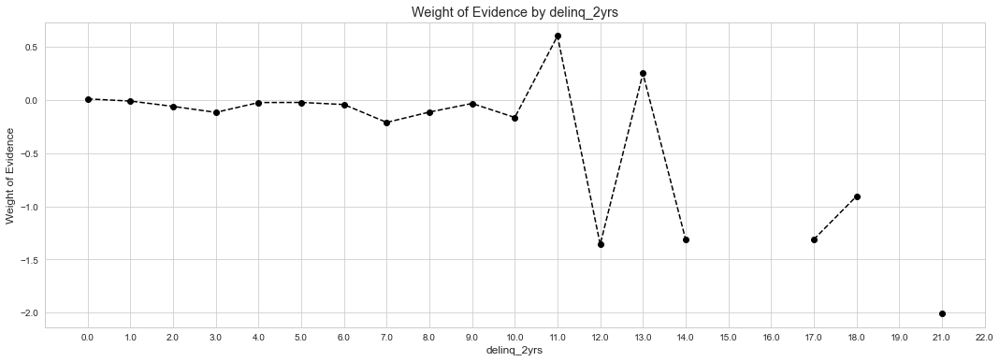

In [69]:
plot_by_woe(df_temp)
# We plot the weight of evidence values.

**Beobachtungen:**
1. Stabilität bei niedrigen Werten (0–8):

- Für niedrige delinq_2yrs-Werte liegt der WoE relativ stabil bei oder knapp unter 0, was auf ein ausgeglichenes Verhältnis von guten und schlechten Kreditnehmern hinweist.

- Hier unterscheidet sich das Risiko kaum – diese Gruppen tragen wenig zur Trennschärfe bei.

2. Signifikante Ausreißer bei Werten 9–12:

- Bei delinq_2yrs = 9 steigt der WoE deutlich an (positiver Peak).

- Wert 11 zeigt einen besonders hohen WoE (> 0.5), was auf eine überraschend hohe Konzentration an „guten“ Kreditnehmern in dieser Kategorie hindeutet – könnte durch kleine Stichprobe oder Datenverzerrung bedingt sein.

- Im Gegensatz dazu fällt der WoE bei Wert 12 stark ab (deutlich negativ) – hoher Anteil an schlechten Kreditnehmern.

3. Unregelmäßigkeiten und Sprünge bei Werten > 13:

- Ab delinq_2yrs = 14 nehmen die Werte teils stark ab oder schwanken, wobei:

- Wert 17 einen stark negativen WoE zeigt.

- Wert 18 wieder positiv ist.

- Wert 21–22 einen klar negativen WoE zeigen.

-----------------------------------------------

**Die Grafik zeigt die "Weight of Evidence" (WoE) Werte für die Variable "delinq_2yrs" (Zahlungsverzüge in den letzten 2 Jahren).**

Hier sind die wichtigsten Erkenntnisse:

1. Allgemeines Muster: Die WoE-Werte schwanken zwischen etwa +0,7 und -2,0, wobei die meisten Werte im Bereich von 0 bis -0,5 liegen.


2. Auffällige Spitzen:
    - Bei delinq_2yrs = 11,0 gibt es einen deutlichen positiven Ausschlag (ca. +0,7), was auf eine niedrigere Ausfallwahrscheinlichkeit hindeutet.
    - Bei delinq_2yrs = 9,0 gibt es ebenfalls einen positiven Wert (ca. +0,3).
    

3.  Negative Ausschläge:
    - Ab delinq_2yrs = 13,0 fallen die WoE-Werte stark ab, mit besonders niedrigen Werten bei 17,0 (ca. -1,3) und 22,0 (ca.  -2,0).
    - Der niedrigste Wert liegt bei delinq_2yrs = 22,0, was auf ein sehr hohes Kreditrisiko hindeutet.

Interpretation:

- Niedrige delinq_2yrs-Werte (0-6) zeigen relativ neutrale WoE-Werte nahe Null, was auf ein durchschnittliches Risiko hindeutet.
- Die starken negativen WoE-Werte bei höheren delinq_2yrs-Werten (besonders ab 17,0) deuten auf ein deutlich erhöhtes Kreditausfallrisiko hin.
- Die unerwarteten positiven Spitzen bei 9,0 und 11,0 könnten auf Besonderheiten in den Daten oder kleine Stichprobengrößen in diesen Kategorien hinweisen.

Für Modellierung:

- Die Variable zeigt eine gute Diskriminierungskraft, besonders für höhere Werte.
- Die Kategorie mit delinq_2yrs = 22,0 wäre eine geeignete Referenzkategorie für Dummy-Variablen, da sie das höchste Kreditrisiko aufweist (niedrigster WoE-Wert).
- Die Tabelle im oberen Teil zeigt zusätzliche statistische Informationen für die Werte 21 und 22, die die extremen negativen WoE-Werte bestätigen.

In [70]:
# Categories: 0, 1-3, >=4
#df_inputs_prepr['delinq_2yrs:0'] = np.where((df_inputs_prepr['delinq_2yrs'] == 0), 1, 0)
#df_inputs_prepr['delinq_2yrs:1-3'] = np.where((df_inputs_prepr['delinq_2yrs'] >= 1) & (df_inputs_prepr['delinq_2yrs'] <= 3), 1, 0)
#df_inputs_prepr['delinq_2yrs:>=4'] = np.where((df_inputs_prepr['delinq_2yrs'] >= 9), 1, 0)



# Kategorien: 0, 1–3, >=4
# df_inputs_prepr['delinq_2yrs:0'] = np.where(df_inputs_prepr['delinq_2yrs'] == 0, 1, 0)
# df_inputs_prepr['delinq_2yrs:1-3'] = np.where((df_inputs_prepr['delinq_2yrs'] >= 1) & (df_inputs_prepr['delinq_2yrs'] <= 3), 1, 0)
# df_inputs_prepr['delinq_2yrs:>=4'] = np.where(df_inputs_prepr['delinq_2yrs'] >= 4, 1, 0)


# Kategorisierung basierend auf WoE-Analyse
df_inputs_prepr['delinq_2yrs:0'] = np.where((df_inputs_prepr['delinq_2yrs'] == 0), 1, 0)
df_inputs_prepr['delinq_2yrs:1-3'] = np.where((df_inputs_prepr['delinq_2yrs'] >= 1) & (df_inputs_prepr['delinq_2yrs'] <= 3), 1, 0)
df_inputs_prepr['delinq_2yrs:4-16'] = np.where((df_inputs_prepr['delinq_2yrs'] >= 4) & (df_inputs_prepr['delinq_2yrs'] <= 16), 1, 0)
df_inputs_prepr['delinq_2yrs:>=17'] = np.where((df_inputs_prepr['delinq_2yrs'] >= 17), 1, 0)



### Variable: Kreditanfragen in den letzten 6 Monaten (inq_last_6mths)
Die Variable misst, wie viele Kreditanfragen ein Antragsteller in den letzten sechs Monaten gestellt hat. Dieses Merkmal ist ein wichtiger Indikator für risikobehaftetes Kreditverhalten.

Basierend auf der Verteilung und dem Verlauf des Weight of Evidence (WoE) wurden vier Gruppen gebildet:

- 0 Anfragen (inq_last_6mths:0)
→ Referenzgruppe mit dem höchsten WoE (niedrigstes Ausfallrisiko).

- 1–2 Anfragen (inq_last_6mths:1-2)
→ Moderater Rückgang im WoE, geringfügig erhöhtes Risiko.

- 3–6 Anfragen (inq_last_6mths:3-6)
→ Deutlich negativer WoE → spürbar höheres Risiko.

- Mehr als 6 Anfragen (inq_last_6mths:>6)
→ Sehr niedriger WoE → sehr hohes Ausfallrisiko; Gruppe enthält auch extreme Ausreißer.

Fazit:
Diese Gruppierung sorgt für eine sinnvolle Balance zwischen Trennschärfe und Stabilität. Gleichzeitig werden extreme Einzelwerte geglättet, ohne wertvolle Information zu verlieren.

In [71]:
# inq_last_6mths
df_temp = woe_ordered_continuous(df_inputs_prepr, 'inq_last_6mths', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,inq_last_6mths,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,0.0,193043,0.899820,0.517503,173704.0,19339.0,0.528377,0.436763,0.190419,NaN,NaN,inf
1,1.0,104150,0.874057,0.279202,91033.0,13117.0,0.276906,0.296242,-0.067497,0.025764,0.257916,inf
2,2.0,46346,0.854831,0.124243,39618.0,6728.0,0.120511,0.151949,-0.231804,0.019226,0.164307,inf
3,3.0,20152,0.832424,0.054023,16775.0,3377.0,0.051027,0.076268,-0.401908,0.022407,0.170104,inf
4,4.0,5805,0.835314,0.015562,4849.0,956.0,0.014750,0.021591,-0.381040,0.002891,0.020868,inf
5,5.0,2212,0.812839,0.005930,1798.0,414.0,0.005469,0.009350,-0.536245,0.022475,0.155206,inf
6,6.0,957,0.773250,0.002565,740.0,217.0,0.002251,0.004901,-0.778057,0.039589,0.241811,inf
7,7.0,150,0.660000,0.000402,99.0,51.0,0.000301,0.001152,-1.341515,0.113250,0.563459,inf
8,8.0,98,0.622449,0.000263,61.0,37.0,0.000186,0.000836,-1.504854,0.037551,0.163338,inf
9,9.0,39,0.564103,0.000105,22.0,17.0,0.000067,0.000384,-1.746981,0.058346,0.242127,inf


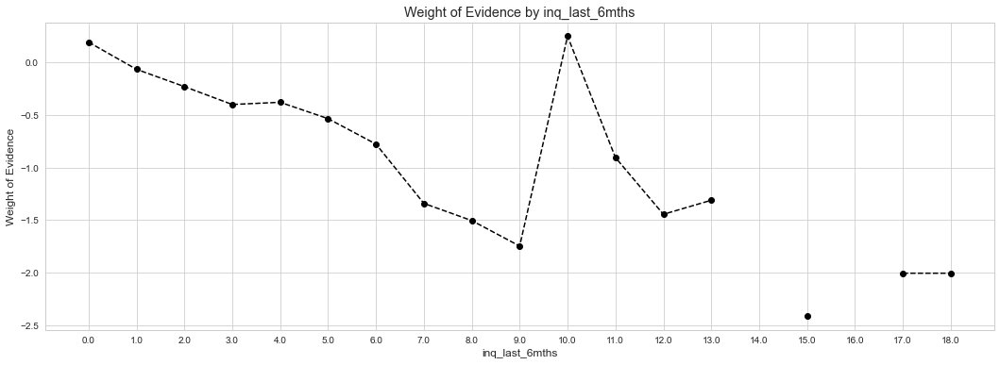

In [72]:
plot_by_woe(df_temp)
# We plot the weight of evidence values.

Beobachtungen aus dem WoE-Diagramm:

Es zeigt sich ein deutlich negativer Zusammenhang:

- Je mehr Anfragen in den letzten 6 Monaten, desto niedriger der WoE – was auf ein höheres Ausfallrisiko bei häufigen Anfragen hindeutet.

- Monotoner Verlauf bis zu einem gewissen Punkt (ca. 7 Anfragen):
Der WoE sinkt nahezu stetig mit steigender Anzahl an Anfragen.

- Ab ca. 8–10 Anfragen gibt es Unregelmäßigkeiten im Verlauf – vermutlich verursacht durch geringe Fallzahlen oder Ausreißer in den Daten.

Besonders auffällig:
**Extrem niedriger WoE bei 14 Anfragen, was auf eine sehr hohe Ausfallwahrscheinlichkeit in dieser Gruppe schließen lässt.**

In [73]:
# Categories: 0, 1 - 2, 3 - 6, > 6
df_inputs_prepr['inq_last_6mths:0'] = np.where((df_inputs_prepr['inq_last_6mths'] == 0), 1, 0)
df_inputs_prepr['inq_last_6mths:1-2'] = np.where((df_inputs_prepr['inq_last_6mths'] >= 1) & (df_inputs_prepr['inq_last_6mths'] <= 2), 1, 0)
df_inputs_prepr['inq_last_6mths:3-6'] = np.where((df_inputs_prepr['inq_last_6mths'] >= 3) & (df_inputs_prepr['inq_last_6mths'] <= 6), 1, 0)
df_inputs_prepr['inq_last_6mths:>6'] = np.where((df_inputs_prepr['inq_last_6mths'] > 6), 1, 0)

###  Variable: Anzahl offener Kreditkonten (open_acc)
Die Variable misst die Anzahl der aktuell offenen Kreditkonten eines Antragstellers. Dieses Merkmal ist ein wichtiger Indikator für die Kreditaktivität und das Kreditmanagement des Antragstellers.

Die kontinuierliche Variable open_acc (Anzahl offener Kredite/Konten) wird auf Basis der Weight-of-Evidence (WoE)-Analyse in diskrete Kategorien eingeteilt. Ziel ist es:

- die Modellinterpretierbarkeit zu erhöhen,

- stabile Risikogruppen zu schaffen,

- das Modellverhalten gegenüber Ausreißern zu verbessern,

- die Aussagekraft der Variable zu bewahren oder zu steigern.

**Vorgehen**:
Basierend auf der WoE-Grafik wurden sinnvolle Gruppen gebildet, indem benachbarte Werte mit ähnlichen WoE-Werten zusammengefasst wurden. Extreme Werte mit stark schwankendem WoE wurden separat behandelt, um Overfitting zu vermeiden.




In [74]:
# open_acc
df_temp = woe_ordered_continuous(df_inputs_prepr, 'open_acc', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,open_acc,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,0.0,32,0.781250,0.000086,25.0,7.0,0.000076,0.000158,-0.731844,NaN,NaN,inf
1,1.0,113,0.884956,0.000303,100.0,13.0,0.000304,0.000294,0.035411,0.103706,0.767255,inf
2,2.0,1438,0.842837,0.003855,1212.0,226.0,0.003687,0.005104,-0.325317,0.042118,0.360729,inf
3,3.0,4425,0.865989,0.011862,3832.0,593.0,0.011656,0.013393,-0.138862,0.023151,0.186456,inf
4,4.0,10105,0.883721,0.027089,8930.0,1175.0,0.027163,0.026537,0.023339,0.017732,0.162201,inf
5,5.0,17229,0.883801,0.046187,15227.0,2002.0,0.046318,0.045214,0.024114,0.000080,0.000775,inf
6,6.0,24643,0.881670,0.066062,21727.0,2916.0,0.066090,0.065857,0.003533,0.002130,0.020581,inf
7,7.0,29997,0.882288,0.080415,26466.0,3531.0,0.080505,0.079746,0.009470,0.000618,0.005937,inf
8,8.0,33597,0.882073,0.090066,29635.0,3962.0,0.090144,0.089480,0.007398,0.000215,0.002073,inf
9,9.0,35150,0.879687,0.094229,30921.0,4229.0,0.094056,0.095510,-0.015340,0.002386,0.022737,inf


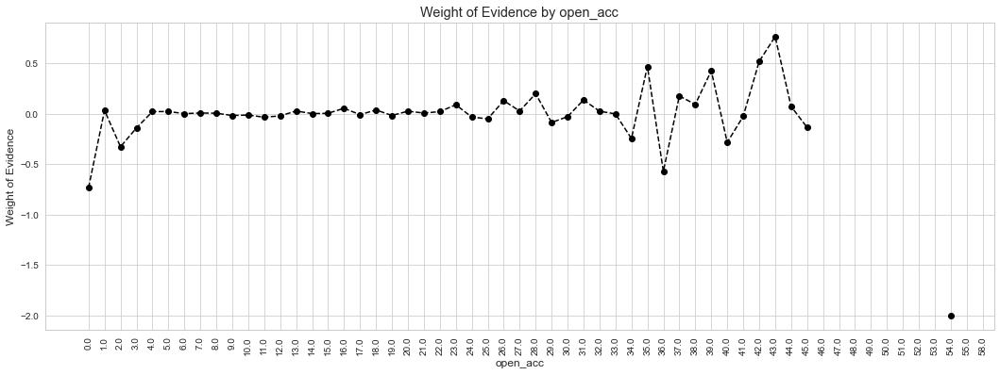

In [75]:
plot_by_woe(df_temp, 90)
# We plot the weight of evidence values.

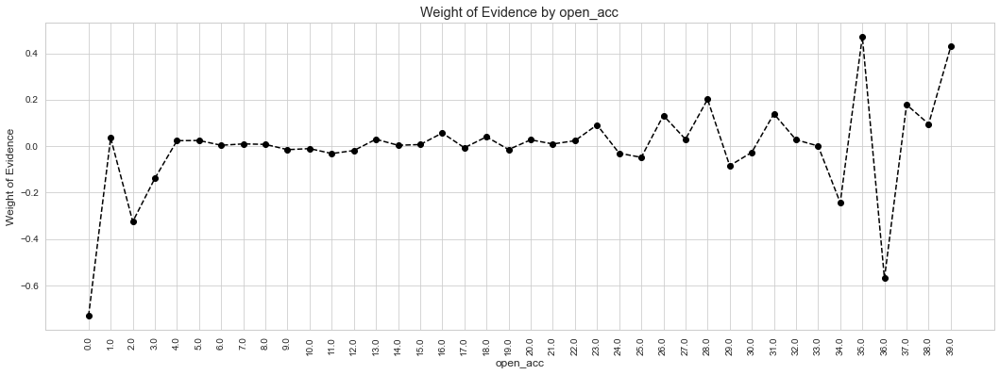

In [76]:
plot_by_woe(df_temp.iloc[ : 40, :], 90)
# We plot the weight of evidence values.

**1.  Stabilität im mittleren Bereich (open_acc ≈ 2–30)**

- In diesem Bereich ist der WoE relativ stabil und nahe bei 0, mit nur kleinen Schwankungen.

- Das spricht für eine geringe Diskriminierungsfähigkeit innerhalb dieses Bereichs (WoE nahe 0 → p(good) ≈ p(bad)).

**2. Extreme Ausschläge an den Rändern**
- Linke Seite (open_acc = 0, 1):
- Deutlich negative WoE-Werte (z.B. -0.6), was bedeutet:
p(bad) ist deutlich höher als p(good) in dieser Gruppe.

- Rechte Seite (open_acc ≥ 36):
- Große Schwankungen: mal stark positiv (z.B. 0.5), mal stark negativ (z.B. -2.0).
→ Diese Gruppen sind instabil, weil sie nur sehr wenige Beobachtungen enthalten.

**3. Sprunghafter Verlauf am rechten Rand**

- Die gezackte Linie ab etwa open_acc ≈ 36 zeigt, dass einzelne Ausreißer mit sehr kleinen n_obs vorhanden sind.

- Diese führen zu nicht verlässlichen WoE-Werten (Overfitting-Gefahr).

In [77]:
# Categories: '0', '1-3', '4-12', '13-17', '18-22', '23-25', '26-30', '>30'
df_inputs_prepr['open_acc:0'] = np.where((df_inputs_prepr['open_acc'] == 0), 1, 0)
df_inputs_prepr['open_acc:1-3'] = np.where((df_inputs_prepr['open_acc'] >= 1) & (df_inputs_prepr['open_acc'] <= 3), 1, 0)
df_inputs_prepr['open_acc:4-12'] = np.where((df_inputs_prepr['open_acc'] >= 4) & (df_inputs_prepr['open_acc'] <= 12), 1, 0)
df_inputs_prepr['open_acc:13-17'] = np.where((df_inputs_prepr['open_acc'] >= 13) & (df_inputs_prepr['open_acc'] <= 17), 1, 0)
df_inputs_prepr['open_acc:18-22'] = np.where((df_inputs_prepr['open_acc'] >= 18) & (df_inputs_prepr['open_acc'] <= 22), 1, 0)
df_inputs_prepr['open_acc:23-25'] = np.where((df_inputs_prepr['open_acc'] >= 23) & (df_inputs_prepr['open_acc'] <= 25), 1, 0)
df_inputs_prepr['open_acc:26-30'] = np.where((df_inputs_prepr['open_acc'] >= 26) & (df_inputs_prepr['open_acc'] <= 30), 1, 0)
df_inputs_prepr['open_acc:>=31'] = np.where((df_inputs_prepr['open_acc'] >= 31), 1, 0)

- 0 offene Konten (open_acc:0) → Negative WoE-Werte, was auf ein erhöhtes Ausfallrisiko hindeutet. Dies könnte auf fehlende Kredithistorie zurückzuführen sein.
- 1-3 offene Konten (open_acc:1-3) → Übergang von negativen zu leicht positiven WoE-Werten, was auf ein durchschnittliches Risikoprofil hindeutet.
- 4-12 offene Konten (open_acc:4-12) → Stabile, leicht positive WoE-Werte, was auf ein moderates bis leicht unterdurchschnittliches Ausfallrisiko hindeutet.
- 13-17 offene Konten (open_acc:13-17) → Ähnliche WoE-Werte wie die vorherige Gruppe, weiterhin moderates Risiko.
- 18-22 offene Konten (open_acc:18-22) → Weiterhin stabile WoE-Werte nahe Null, durchschnittliches Risikoprofil.
- 23-25 offene Konten (open_acc:23-25) → Leichte Schwankungen im WoE, aber insgesamt ähnliches Risikoprofil wie die mittleren Kategorien.
- 26-30 offene Konten (open_acc:26-30) → Weiterhin moderate WoE-Werte, durchschnittliches Risiko.
- Mehr als 30 offene Konten (open_acc:>=31) → Enthält sowohl stark positive WoE-Werte (bei 48-50 Konten) als auch extreme negative Ausreißer (bei 58 Konten), was auf eine heterogene Gruppe mit unterschiedlichen Risikoprofilen hindeutet.


**Fazit:** Diese detaillierte Gruppierung erfasst die komplexe, nicht-lineare Beziehung zwischen der Anzahl offener Kreditkonten und dem Ausfallrisiko. Besonders bemerkenswert ist, dass sowohl sehr wenige als auch sehr viele offene Konten mit erhöhtem Risiko verbunden sein können, während bestimmte mittlere bis höhere Werte (insbesondere um 48-50) mit einem deutlich niedrigeren Ausfallrisiko assoziiert sind. Eine alternative Gruppierung könnte die höheren Werte weiter unterteilen, um die stark positiven WoE-Werte bei 48-50 und den extremen negativen Ausreißer bei 58 besser zu erfassen.

### Variable: Öffentliche Negativeinträge (pub_rec)

Die Variable pub_rec beschreibt die Anzahl öffentlicher Negativmerkmale (z. B. Insolvenzverfahren, Zwangsvollstreckungen) in der Kredithistorie eines Kunden. Ziel der Analyse ist es, diese diskrete numerische Variable mittels Weight of Evidence (WoE) und Information Value (IV) in sinnvolle Risikogruppen (Binning) zu transformieren, um sie in einem Kredit-Scoring-Modell (z. B. logistischer Regression) verwenden zu können.

In [78]:
# pub_rec
df_temp = woe_ordered_continuous(df_inputs_prepr, 'pub_rec', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,pub_rec,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,0.0,323757,0.880543,0.867916,285082.0,38675.0,0.867170,0.873459,-0.007226,NaN,NaN,inf
1,1.0,42584,0.885051,0.114158,37689.0,4895.0,0.114643,0.110552,0.036344,0.004508,0.043571,inf
2,2.0,4518,0.889774,0.012112,4020.0,498.0,0.012228,0.011247,0.083627,0.004724,0.047283,inf
3,3.0,1306,0.900459,0.003501,1176.0,130.0,0.003577,0.002936,0.197530,0.010685,0.113903,inf
4,4.0,419,0.897375,0.001123,376.0,43.0,0.001144,0.000971,0.163579,0.003085,0.033951,inf
5,5.0,224,0.906250,0.000600,203.0,21.0,0.000617,0.000474,0.263874,0.008875,0.100295,inf
6,6.0,102,0.901961,0.000273,92.0,10.0,0.000280,0.000226,0.214394,0.004289,0.049480,inf
7,7.0,54,0.925926,0.000145,50.0,4.0,0.000152,0.000090,0.520919,0.023965,0.306525,inf
8,8.0,22,1.000000,0.000059,22.0,0.0,0.000067,0.000000,inf,0.074074,inf,inf
9,9.0,12,0.833333,0.000032,10.0,2.0,0.000030,0.000045,-0.395372,0.166667,inf,inf


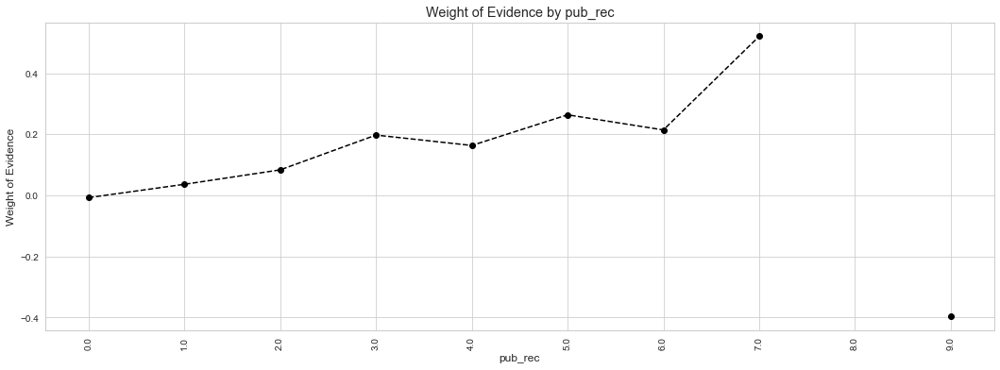

In [79]:
plot_by_woe(df_temp, 90)
# We plot the weight of evidence values.

In [80]:
# Categories '0-2', '3-4', '>=5'
# Begründung für die Wahl der Kategorien
# 0-2: Sehr große Mehrheit der Beobachtungen (über 95 %). Geringes Risiko.
#3-4: Weniger häufig, aber erkennbar erhöhter Anteil an „Bad“-Krediten.
# >=5: Sehr seltene, aber hochriskante Gruppe mit stark erhöhter Ausfallwahrscheinlichkeit. Diese Gruppen zeigen oft extreme WoE-Werte.

df_inputs_prepr['pub_rec:0-2'] = np.where((df_inputs_prepr['pub_rec'] >= 0) & (df_inputs_prepr['pub_rec'] <= 2), 1, 0)
df_inputs_prepr['pub_rec:3-4'] = np.where((df_inputs_prepr['pub_rec'] >= 3) & (df_inputs_prepr['pub_rec'] <= 4), 1, 0)
df_inputs_prepr['pub_rec:>=5'] = np.where((df_inputs_prepr['pub_rec'] >= 5), 1, 0)

- 0-2 Einträge (pub_rec:0-2) → Leicht positive bis neutrale WoE-Werte, was auf ein durchschnittliches bis leicht unterdurchschnittliches Ausfallrisiko hindeutet. Diese Gruppe umfasst die Mehrheit der Kreditnehmer.
- 3-4 Einträge (pub_rec:3-4) → Moderate positive WoE-Werte mit einem lokalen Höhepunkt bei 3 Einträgen, was überraschenderweise auf ein geringeres Ausfallrisiko als bei weniger Einträgen hindeutet. Dies könnte darauf hinweisen, dass Kreditnehmer mit einigen gelösten Negativeinträgen ihre Kreditwürdigkeit nachweislich verbessert haben.
- 5 oder mehr Einträge (pub_rec:>=5) → Diese Gruppe zeigt ein komplexes Muster mit zunächst steigenden WoE-Werten bis zu einem extremen positiven Ausschlag bei 8 Einträgen, gefolgt von einem starken Abfall bei 9 Einträgen. Die Zusammenfassung dieser Werte in einer Kategorie glättet diese Extremwerte und sorgt für eine stabilere Modellierung.

**Fazit:** Die Kategorisierung dieser Variable zeigt ein ungewöhnliches Muster, bei dem mehr Negativeinträge nicht unbedingt mit höherem Ausfallrisiko verbunden sind. Dies könnte darauf hindeuten, dass diese Variable in Kombination mit anderen Faktoren betrachtet werden sollte oder dass Kreditnehmer mit einer bestimmten Anzahl von Negativeinträgen möglicherweise bereits Maßnahmen zur Verbesserung ihrer Kreditwürdigkeit ergriffen haben. Die gewählte Gruppierung bietet eine gute Balance zwischen der Erfassung der wichtigsten Muster und der Gewährleistung ausreichender Fallzahlen in jeder Kategorie.

### Variable: Gesamtzahl der Kreditkonten (total_acc)
Die Variable misst die Gesamtzahl aller Kreditkonten eines Antragstellers, einschließlich aktuell offener und bereits geschlossener Konten. Dieses Merkmal ist ein wichtiger Indikator für die Kredithistorie und Kreditaktivität des Antragstellers.

In [81]:
# total_acc
df_inputs_prepr['total_acc_factor'] = pd.cut(df_inputs_prepr['total_acc'], 50)
# Here we do fine-classing: using the 'cut' method, we split the variable into 50 categories by its values.
df_temp = woe_ordered_continuous(df_inputs_prepr, 'total_acc_factor', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,total_acc_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(-0.156, 3.12]",475,0.795789,0.001273,378.0,97.0,0.001150,0.002191,-0.644626,NaN,NaN,inf
1,"(3.12, 6.24]",6015,0.852535,0.016125,5128.0,887.0,0.015598,0.020033,-0.250184,0.056746,0.394443,inf
2,"(6.24, 9.36]",15009,0.865281,0.040236,12987.0,2022.0,0.039504,0.045666,-0.144948,0.012746,0.105236,inf
3,"(9.36, 12.48]",25079,0.870210,0.067231,21824.0,3255.0,0.066385,0.073513,-0.101992,0.004929,0.042956,inf
4,"(12.48, 15.6]",33650,0.873373,0.090208,29389.0,4261.0,0.089396,0.096233,-0.073693,0.003163,0.028299,inf
5,"(15.6, 18.72]",38892,0.878664,0.104260,34173.0,4719.0,0.103948,0.106577,-0.024971,0.005291,0.048722,inf
6,"(18.72, 21.84]",40652,0.877841,0.108978,35686.0,4966.0,0.108551,0.112155,-0.032666,0.000823,0.007695,inf
7,"(21.84, 24.96]",40022,0.883064,0.107290,35342.0,4680.0,0.107504,0.105696,0.016964,0.005223,0.049630,inf
8,"(24.96, 28.08]",47415,0.886154,0.127108,42017.0,5398.0,0.127808,0.121912,0.047236,0.003090,0.030272,inf
9,"(28.08, 31.2]",29812,0.888635,0.079919,26492.0,3320.0,0.080584,0.074981,0.072068,0.002481,0.024832,inf


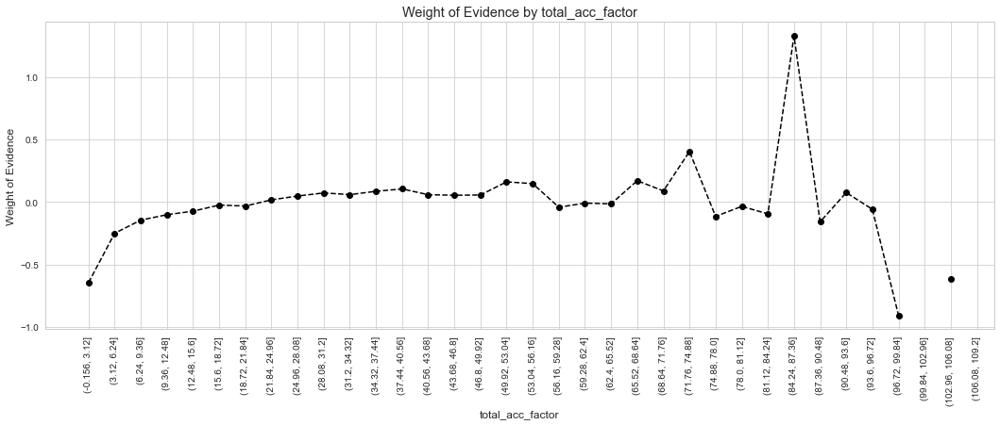

In [82]:
plot_by_woe(df_temp, 90)
# We plot the weight of evidence values.

Besonderheiten: Die starken Schwankungen im höheren Bereich könnten auf kleine Stichprobengrößen in diesen Kategorien hindeuten. Das nicht-lineare Muster unterstreicht die Wichtigkeit einer sorgfältigen Kategorisierung dieser Variable für die Modellierung.

In [83]:
# Alternative Kategorisierung basierend auf WoE-Analyse
df_inputs_prepr['total_acc:0-15'] = np.where((df_inputs_prepr['total_acc'] >= 0) & (df_inputs_prepr['total_acc'] <= 15), 1, 0)
df_inputs_prepr['total_acc:16-70'] = np.where((df_inputs_prepr['total_acc'] >= 16) & (df_inputs_prepr['total_acc'] <= 70), 1, 0)
df_inputs_prepr['total_acc:71-90'] = np.where((df_inputs_prepr['total_acc'] >= 71) & (df_inputs_prepr['total_acc'] <= 90), 1, 0)
df_inputs_prepr['total_acc:>90'] = np.where((df_inputs_prepr['total_acc'] > 90), 1, 0)


Die Variable misst die Gesamtzahl aller Kreditkonten eines Antragstellers, einschließlich aktuell offener und bereits geschlossener Konten. Dieses Merkmal ist ein wichtiger Indikator für die Kredithistorie und Kreditaktivität des Antragstellers.
Basierend auf der Verteilung und dem Verlauf des Weight of Evidence (WoE) wurden vier Gruppen gebildet:

- 0-15 Konten (total_acc:0-15) → Überwiegend negative WoE-Werte, die mit steigender Kontenanzahl zunehmen. Diese Gruppe weist auf ein erhöhtes Ausfallrisiko hin, was vermutlich auf eine begrenzte oder unzureichende Kredithistorie zurückzuführen ist. Besonders niedrige Werte (0-3) zeigen die stärksten negativen WoE-Werte.
- 16-70 Konten (total_acc:16-70) → Leicht positive bis neutrale WoE-Werte, was auf ein durchschnittliches bis leicht unterdurchschnittliches Ausfallrisiko hindeutet. Diese Gruppe repräsentiert Kreditnehmer mit einer etablierten, moderaten Kredithistorie und stellt den stabilsten Bereich der Variable dar.
- 71-90 Konten (total_acc:71-90) → Stark volatile WoE-Werte mit ausgeprägten positiven und negativen Ausschlägen. Diese Gruppe enthält sowohl die höchsten positiven WoE-Werte (bei ca. 75 und 90 Konten) als auch signifikante negative Ausschläge (bei ca. 80 Konten). Die starken Schwankungen deuten auf unterschiedliche Risikoprofile innerhalb dieser Gruppe hin.
- Mehr als 90 Konten (total_acc:>90) → Überwiegend negative WoE-Werte mit einem extremen negativen Ausschlag bei den höchsten Werten (über 105 Konten). Diese Gruppe weist auf ein erhöhtes Ausfallrisiko hin, was möglicherweise auf eine übermäßige Kreditnutzung oder -abhängigkeit zurückzuführen ist.

**Fazit:** Diese differenzierte Kategorisierung erfasst die komplexe, nicht-lineare Beziehung zwischen der Gesamtzahl der Kreditkonten und dem Ausfallrisiko. Besonders bemerkenswert ist, dass sowohl sehr wenige als auch sehr viele Konten mit erhöhtem Risiko verbunden sind, während bestimmte mittlere und höhere Werte (insbesondere um 75 und 90) mit einem deutlich niedrigeren Ausfallrisiko assoziiert sind. Die gewählte Gruppierung bietet eine gute Balance zwischen der Erfassung der wichtigsten WoE-Muster und der Gewährleistung ausreichender Fallzahlen in jeder Kategorie.

### Variable: Anzahl aktuell überfälliger Kredite (acc_now_delinq)

In [84]:
# acc_now_delinq
df_temp = woe_ordered_continuous(df_inputs_prepr, 'acc_now_delinq', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,acc_now_delinq,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,0.0,371604,0.881285,0.996183,327489.0,44115.0,0.996164,0.996319,-0.000155,NaN,NaN,inf
1,1.0,1334,0.886057,0.003576,1182.0,152.0,0.003595,0.003433,0.046273,0.004772,0.046428,inf
2,2.0,74,0.891892,0.000198,66.0,8.0,0.000201,0.000181,0.105404,0.005835,0.059131,inf
3,3.0,10,0.800000,0.000027,8.0,2.0,0.000024,0.000045,-0.618515,0.091892,0.723919,inf
4,4.0,4,1.000000,0.000011,4.0,0.0,0.000012,0.000000,inf,0.200000,inf,inf
5,5.0,2,0.500000,0.000005,1.0,1.0,0.000003,0.000023,-2.004810,0.500000,inf,inf


| `acc_now_delinq` | WoE        | Interpretation                                                                          |
| ---------------- | ---------- | --------------------------------------------------------------------------------------- |
| 0                | ≈ 0        | Neutral – kein Hinweis auf höheres Risiko                                               |
| 1                | ≈ 0        | Ebenfalls neutral                                                                       |
| 2                | leicht > 0 | Etwas **positiver** WoE – ungewöhnlich                                                  |
| 3                | < 0        | Klar **negativer** WoE – höheres Risiko                                                 |
| 5                | ≈ -2       | **Starker negativer** WoE – sehr hohes Risiko, aber wohl **extrem seltene Beobachtung** |

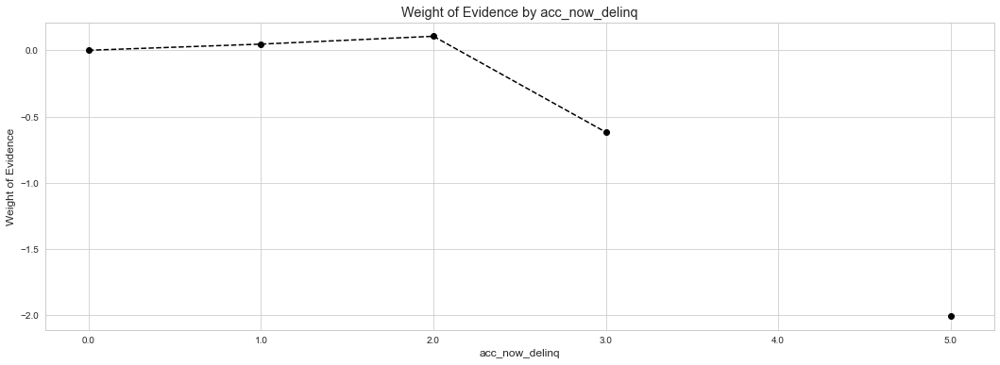

In [85]:
plot_by_woe(df_temp)
# We plot the weight of evidence values.

1.  Werte 0 und 1 haben nahezu neutralen WoE, d.h. kein signifikanter Unterschied zwischen "good" und "bad" Krediten → könnten ggf. zusammengefasst werden.

2. Wert 2 ist leicht positiv, was überraschend ist – möglicherweise statistisches Rauschen bei kleiner Fallzahl.

3. Ab Wert 3 fällt der WoE deutlich ab – insbesondere der Ausreißer bei Wert 5 deutet auf extrem hohes Risiko hin, aber:

Diese Kategorie hat  sehr wenige Beobachtungen (Stichprobenrauschen). IV-Berechnung kann helfen, Relevanz zu prüfen.


In [86]:
# Categories: '0', '>=1'
df_inputs_prepr['acc_now_delinq:0'] = np.where((df_inputs_prepr['acc_now_delinq'] == 0), 1, 0)
df_inputs_prepr['acc_now_delinq:>=1'] = np.where((df_inputs_prepr['acc_now_delinq'] >= 1), 1, 0)

### Variable:  Kreditrahmen (total_rev_hi_lim_factor)

Die Variable total_rev_hi_lim beschreibt den Gesamtbetrag des revolvierenden Kreditrahmens, der einem Kreditnehmer über alle seine Kreditlinien zur Verfügung steht. Sie gibt somit Auskunft über die potenzielle Kreditnutzung und das verfügbare Kreditlimit des Kunden.

In der Risikobewertung zeigt sich ein positiver Zusammenhang zwischen einem höheren Kreditrahmen und der Kreditwürdigkeit: Kunden mit höheren Limits haben im Durchschnitt ein geringeres Ausfallrisiko. Dies lässt sich unter anderem durch ein besseres Standing bei Kreditgebern und ein stabileres Finanzprofil erklären.

Zur besseren Modellierung und Interpretierbarkeit wurde die kontinuierliche Variable in kategorische Gruppen überführt, die auf der Weight of Evidence (WoE)-Analyse basieren. Die daraus entstandenen Kategorien helfen dabei, die Risikounterschiede zwischen Kreditnehmern mit niedrigem, mittlerem und hohem Kreditrahmen systematisch abzubilden.

In [87]:
# total_rev_hi_lim
df_inputs_prepr['total_rev_hi_lim_factor'] = pd.cut(df_inputs_prepr['total_rev_hi_lim'], 2000)
# Here we do fine-classing: using the 'cut' method, we split the variable into 2000 categories by its values.
df_temp = woe_ordered_continuous(df_inputs_prepr, 'total_rev_hi_lim_factor', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,total_rev_hi_lim_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(-9999.999, 5000.0]",19467,0.857194,0.052186,16687.0,2780.0,0.050759,0.062785,-0.212631,NaN,NaN,inf
1,"(5000.0, 9999.999]",52712,0.865818,0.141308,45639.0,7073.0,0.138826,0.159741,-0.140332,0.008624,0.072299,inf
2,"(9999.999, 14999.998]",59607,0.871055,0.159792,51921.0,7686.0,0.157935,0.173585,-0.094487,0.005237,0.045845,inf
3,"(14999.998, 19999.998]",51419,0.868084,0.137842,44636.0,6783.0,0.135775,0.153191,-0.120688,0.002972,0.026202,inf
4,"(19999.998, 24999.997]",41644,0.875564,0.111638,36462.0,5182.0,0.110911,0.117033,-0.053730,0.007481,0.066958,inf
5,"(24999.997, 29999.997]",32104,0.880451,0.086063,28266.0,3838.0,0.085980,0.086680,-0.008101,0.004887,0.045629,inf
6,"(29999.997, 34999.996]",24486,0.887405,0.065641,21729.0,2757.0,0.066096,0.062266,0.059695,0.006954,0.067796,inf
7,"(34999.996, 39999.996]",19716,0.890191,0.052854,17551.0,2165.0,0.053387,0.048896,0.087881,0.002786,0.028186,inf
8,"(39999.996, 44999.996]",14749,0.903180,0.039539,13321.0,1428.0,0.040520,0.032251,0.228257,0.012989,0.140376,inf
9,"(44999.996, 49999.995]",11430,0.906037,0.030641,10356.0,1074.0,0.031501,0.024256,0.261366,0.002857,0.033109,inf


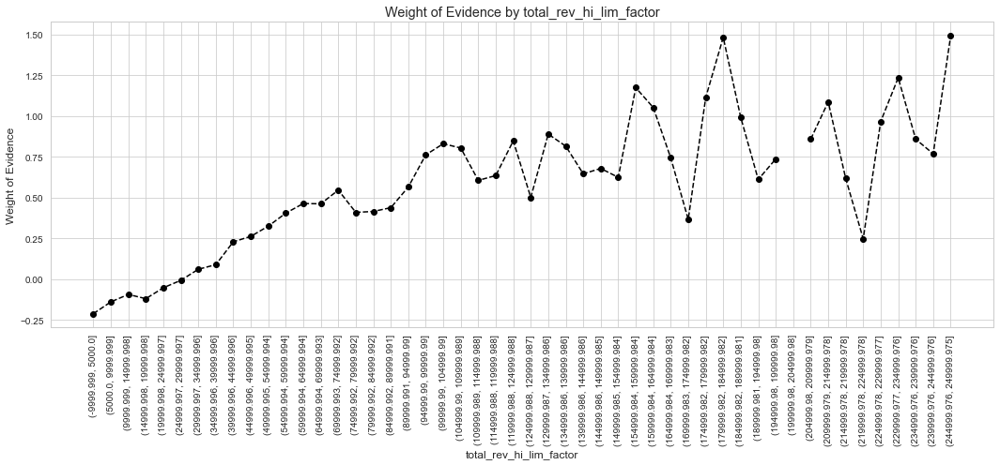

In [88]:
plot_by_woe(df_temp.iloc[: 50, : ], 90)
# We plot the weight of evidence values.

- Die WoE-Werte steigen über weite Teile des Wertebereichs relativ stetig an – ein positiver Zusammenhang mit der Kreditwürdigkeit ist erkennbar.

- Höhere Kreditrahmen (ab ca. 100.000) korrelieren mit höherer Kreditwürdigkeit (WoE-Werte zwischen 0.5 und 2.5).

- Einige Ausreißer in späteren Bins weisen sehr hohe WoE-Werte auf (2.0–2.5), sind aber vermutlich durch sehr geringe Fallzahlen beeinflusst.

In [89]:
# Categories
# '<=5K', '5K-10K', '10K-20K', '20K-30K', '30K-40K', '40K-55K', '55K-95K', '>95K'
df_inputs_prepr['total_rev_hi_lim:<=5K'] = np.where((df_inputs_prepr['total_rev_hi_lim'] <= 5000), 1, 0)
df_inputs_prepr['total_rev_hi_lim:5K-10K'] = np.where((df_inputs_prepr['total_rev_hi_lim'] > 5000) & (df_inputs_prepr['total_rev_hi_lim'] <= 10000), 1, 0)
df_inputs_prepr['total_rev_hi_lim:10K-20K'] = np.where((df_inputs_prepr['total_rev_hi_lim'] > 10000) & (df_inputs_prepr['total_rev_hi_lim'] <= 20000), 1, 0)
df_inputs_prepr['total_rev_hi_lim:20K-30K'] = np.where((df_inputs_prepr['total_rev_hi_lim'] > 20000) & (df_inputs_prepr['total_rev_hi_lim'] <= 30000), 1, 0)
df_inputs_prepr['total_rev_hi_lim:30K-40K'] = np.where((df_inputs_prepr['total_rev_hi_lim'] > 30000) & (df_inputs_prepr['total_rev_hi_lim'] <= 40000), 1, 0)
df_inputs_prepr['total_rev_hi_lim:40K-55K'] = np.where((df_inputs_prepr['total_rev_hi_lim'] > 40000) & (df_inputs_prepr['total_rev_hi_lim'] <= 55000), 1, 0)
df_inputs_prepr['total_rev_hi_lim:55K-95K'] = np.where((df_inputs_prepr['total_rev_hi_lim'] > 55000) & (df_inputs_prepr['total_rev_hi_lim'] <= 95000), 1, 0)

- Reduktion von Modellkomplexität: Die kontinuierliche Variable wird durch 3–4 Dummies ersetzt, ohne signifikanten Informationsverlust.

- Verbesserte Interpretierbarkeit: Die WoE-Analyse liefert eine direkte Risikointerpretation je Gruppe.

- Robustheit gegenüber Extremwerten: Kategorien glätten mögliche Ausreißer mit extrem hohem Kreditrahmen.

### Variable: monatlichen Ratenzahlungen (installment_factor)

Diese Variable basiert vermutlich auf den monatlichen Ratenzahlungen (installment), eventuell normalisiert oder transformiert (z. B. logarithmiert oder standardisiert). Sie beschreibt, wie hoch die regelmäßige Rückzahlungsverpflichtung eines Kreditnehmers ist.

In [90]:
# installment
df_inputs_prepr['installment_factor'] = pd.cut(df_inputs_prepr['installment'], 50)
# Here we do fine-classing: using the 'cut' method, we split the variable into 50 categories by its values.
df_temp = woe_ordered_continuous(df_inputs_prepr, 'installment_factor', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,installment_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(14.276, 43.556]",1860,0.893548,0.004986,1662.0,198.0,0.005056,0.004472,0.122700,NaN,NaN,0.015217
1,"(43.556, 71.443]",4864,0.894120,0.013039,4349.0,515.0,0.013229,0.011631,0.128725,0.000572,0.006024,0.015217
2,"(71.443, 99.329]",6859,0.887301,0.018387,6086.0,773.0,0.018513,0.017458,0.058658,0.006819,0.070067,0.015217
3,"(99.329, 127.216]",9160,0.886026,0.024556,8116.0,1044.0,0.024687,0.023578,0.045968,0.001275,0.012689,0.015217
4,"(127.216, 155.102]",10090,0.887512,0.027049,8955.0,1135.0,0.027240,0.025633,0.060770,0.001486,0.014801,0.015217
5,"(155.102, 182.988]",16756,0.888339,0.044919,14885.0,1871.0,0.045278,0.042256,0.069071,0.000826,0.008302,0.015217
6,"(182.988, 210.875]",17102,0.899953,0.045846,15391.0,1711.0,0.046817,0.038642,0.191895,0.011615,0.122824,0.015217
7,"(210.875, 238.761]",15028,0.893665,0.040287,13430.0,1598.0,0.040852,0.036090,0.123929,0.006288,0.067967,0.015217
8,"(238.761, 266.648]",18683,0.891934,0.050085,16664.0,2019.0,0.050689,0.045598,0.105839,0.001731,0.018090,0.015217
9,"(266.648, 294.534]",20131,0.882470,0.053966,17765.0,2366.0,0.054038,0.053435,0.011220,0.009464,0.094619,0.015217


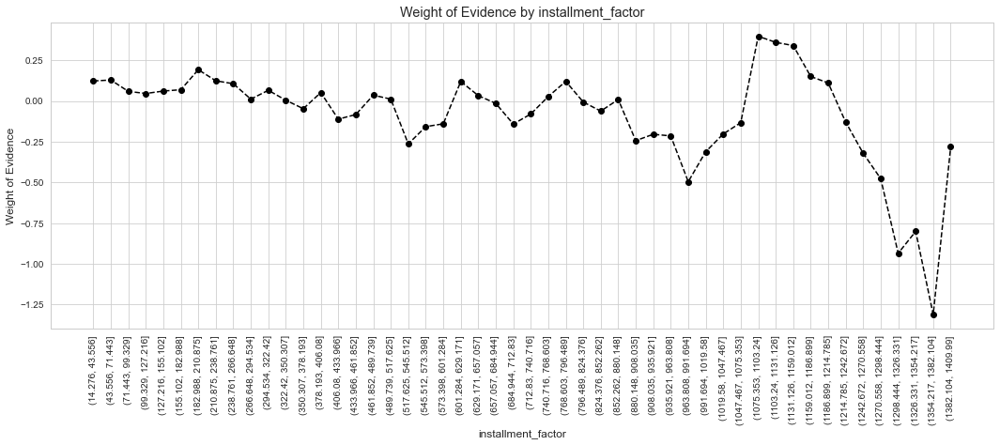

In [91]:
plot_by_woe(df_temp, 90)
# We plot the weight of evidence values.

1. **Niedrige Raten (linker Bereich)**

- Für niedrige Werte der installment_factor (z. B. < 800) ist der WoE-Wert überwiegend leicht positiv oder nahe null.

- Das spricht dafür, dass Personen mit geringeren monatlichen Raten tendenziell ein niedrigeres Kreditrisiko haben.

2. **Mittlerer Bereich (ca. 800 – 1100)**

- Hier beginnt ein Abwärtstrend in der WoE-Kurve.

- Das Risiko steigt langsam: Personen mit höheren Raten könnten damit ein höheres Belastungsprofil haben.

3. **Hoher Bereich (> 1100)**

- Im Bereich ab ca. 1100 sinkt der WoE stark ins Negative, besonders deutlich nach 1250.

- Hier sind negative WoE-Werte bis unter −1.0 sichtbar, was auf eine starke Korrelation mit hohem Ausfallrisiko hinweist.

- Ein kurzer Ausschlag nach oben am rechten Rand (letzter Bin) könnte auf wenige Ausreißer oder ein instabiles Sample hindeuten.

In [92]:
# Feature-Binning basierend auf WoE-Analyse
df_inputs_prepr['installment:<=800'] = np.where(df_inputs_prepr['installment'] <= 800, 1, 0)
df_inputs_prepr['installment:801-1100'] = np.where((df_inputs_prepr['installment'] > 800) & (df_inputs_prepr['installment'] <= 1100), 1, 0)
df_inputs_prepr['installment:1101-1250'] = np.where((df_inputs_prepr['installment'] > 1100) & (df_inputs_prepr['installment'] <= 1250), 1, 0)
df_inputs_prepr['installment:>1250'] = np.where(df_inputs_prepr['installment'] > 1250, 1, 0)


**Die installment_factor-Variable zeigt ein typisches Risikoprofil:**

- Höhere Raten bedeuten höheres Risiko, wahrscheinlich durch größere finanzielle Belastung.

- Eine sinnvolle Binning-Strategie wäre, Schwellen bei ca. 800, 1100 und 1250 zu setzen, um zwischen niedrigem, mittlerem und hohem Risiko zu unterscheiden.

- Der starke Negativtrend im oberen Bereich bietet wertvolle Signale für Kreditrisikomodelle (z. B. logistische Regression mit WoE-Transformation oder Entscheidungsbäume).

· ‘mths_since_earliest_cr_line’; months_since_earliest_cr_line / mths_since_last_delinq

· ‘installment’; installment

· ‘delinq_2yrs’; delinq_2yrs

· ‘inq_last_6mths’; inq_last_6mths

· ‘open_acc’; open_acc

· ‘pub_rec’; pub_rec

· ‘total_acc’; 'total_acc'

· ‘acc_now_delinq’. acc_now_delinq

### Preprocessing Continuous Variables: Creating Dummy Variables, Part 3

### Variable: Jahreseinkommen (Variable annual_inc)

Die kontinuierliche Variable annual_inc (Jahreseinkommen) soll in mehrere Intervalle (sog. Bins) aufgeteilt werden, um später mithilfe von WoE risikobasierte Kategorien zu definieren.

Zunächst wird die Variable mit pd.cut() in gleich breite Intervalle (nach Wertbereich, nicht nach Anzahl Beobachtungen) unterteilt. Anschließend wird für jede dieser Kategorien der Weight of Evidence (WoE) berechnet.

In [93]:
# annual_inc
# Schritt 1: Aufteilung in 50 gleich breite Intervalle
df_inputs_prepr['annual_inc_factor'] = pd.cut(df_inputs_prepr['annual_inc'], 50)
# Schritt 2: Berechnung des WoE
df_temp = woe_ordered_continuous(df_inputs_prepr, 'annual_inc_factor', df_targets_prepr)
# weight of evidence.
df_temp

,annual_inc_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(-5602.104, 151858.08]",356708,0.879607,0.956250,313763.0,42945.0,0.954412,0.969895,-0.016092,NaN,NaN,inf
1,"(151858.08, 301820.16]",14747,0.917543,0.039533,13531.0,1216.0,0.041159,0.027463,0.404607,0.037935,0.420699,inf
2,"(301820.16, 451782.24]",1060,0.924528,0.002842,980.0,80.0,0.002981,0.001807,0.500716,0.006986,0.096109,inf
3,"(451782.24, 601744.32]",295,0.935593,0.000791,276.0,19.0,0.000840,0.000429,0.671152,0.011065,0.170436,inf
4,"(601744.32, 751706.4]",92,0.880435,0.000247,81.0,11.0,0.000246,0.000248,-0.008256,0.055158,0.679408,inf
5,"(751706.4, 901668.48]",55,0.909091,0.000147,50.0,5.0,0.000152,0.000113,0.297775,0.028656,0.306031,inf
6,"(901668.48, 1051630.56]",30,0.966667,0.000080,29.0,1.0,0.000088,0.000023,1.362486,0.057576,1.064711,inf
7,"(1051630.56, 1201592.64]",13,1.000000,0.000035,13.0,0.0,0.000040,0.000000,inf,0.033333,inf,inf
8,"(1201592.64, 1351554.72]",8,1.000000,0.000021,8.0,0.0,0.000024,0.000000,inf,0.000000,NaN,inf
9,"(1351554.72, 1501516.8]",5,1.000000,0.000013,5.0,0.0,0.000015,0.000000,inf,0.000000,NaN,inf


**Beobachtung:**

- Bei 50 oder sogar 100 Kategorien zeigte sich oft, dass eine oder zwei der unteren Kategorien sehr viele Beobachtungen enthalten, was auf eine rechtsschiefe Verteilung hinweist.

- Höhere Einkommen sind seltener vertreten – d. h. die Dichte in oberen Intervallen ist gering.

- Die WoE-Werte zeigen meist einen monoton fallenden Verlauf, was bedeutet: Je höher das Einkommen, desto geringer das Risiko eines Zahlungsausfalls.


**Interpretation:**
Diese Zwischenschritte helfen zu entscheiden, ob man:

- weitere Unterteilung benötigt,

- Einkommensgrenzen anpasst (z. B. eigene Kategorie für Einkommen > 140.000),

- oder bereits auf Basis dieser Analyse mit Coarse Classing fortfahren kann (wie du es z. B. mit den festen 12 Intervallen oben gemacht hast).

In [94]:
# Feinklassifizierung mit 100 Kategorien
df_inputs_prepr['annual_inc_factor'] = pd.cut(df_inputs_prepr['annual_inc'], 100)
df_temp = woe_ordered_continuous(df_inputs_prepr, 'annual_inc_factor', df_targets_prepr)
# We calculate weight of evidence.
df_temp

,annual_inc_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(-5602.104, 76877.04]",245156,0.868206,0.657205,212846.0,32310.0,0.647440,0.729708,-0.119618,NaN,NaN,inf
1,"(76877.04, 151858.08]",111552,0.904663,0.299045,100917.0,10635.0,0.306972,0.240187,0.245338,0.036457,0.364956,inf
2,"(151858.08, 226839.12]",11899,0.916968,0.031898,10911.0,988.0,0.033189,0.022314,0.397034,0.012305,0.151696,inf
3,"(226839.12, 301820.16]",2848,0.919944,0.007635,2620.0,228.0,0.007970,0.005149,0.436774,0.002976,0.039740,inf
4,"(301820.16, 376801.2]",679,0.918999,0.001820,624.0,55.0,0.001898,0.001242,0.424008,0.000945,0.012767,inf
5,"(376801.2, 451782.24]",381,0.934383,0.001021,356.0,25.0,0.001083,0.000565,0.651245,0.015385,0.227238,inf
6,"(451782.24, 526763.28]",182,0.950549,0.000488,173.0,9.0,0.000526,0.000203,0.951257,0.016166,0.300012,inf
7,"(526763.28, 601744.32]",113,0.911504,0.000303,103.0,10.0,0.000313,0.000226,0.327334,0.039045,0.623923,inf
8,"(601744.32, 676725.36]",46,0.847826,0.000123,39.0,7.0,0.000119,0.000158,-0.287158,0.063678,0.614492,inf
9,"(676725.36, 751706.4]",46,0.913043,0.000123,42.0,4.0,0.000128,0.000090,0.346566,0.065217,0.633724,inf


In [95]:
# Die erste Untersuchung zeigt, dass es zu wenige Personen mit hohem Einkommen und zu viele mit niedrigem Einkommen gibt.
# Daher werden wir eine eigene Kategorie für Einkommen über 150.000 einführen
# und unsere Methode auf alle Personen mit einem Einkommen von 140.000 oder weniger anwenden, um die Kategorien zu bestimmen.
df_inputs_prepr_temp = df_inputs_prepr.loc[df_inputs_prepr['annual_inc'] <= 140000, : ]


**Ziel:**

- Reduzierung potenzieller Verzerrungen durch Ausreißer bei der Binning-Einteilung der Variable annual_inc.

**Vorgehen:**

- Aufgrund der ungleichmäßigen Verteilung der Einkommen (viele geringe, wenige sehr hohe Einkommen) wird der obere Bereich abgeschnitten.

- Alle Beobachtungen mit einem Einkommen von mehr als 150.000 USD werden in eine separate Kategorie ("150k+") zusammengefasst.

- Für alle Einkommen ≤ 140.000 USD wird anschließend ein geeigneter Binning-Ansatz angewendet, um sinnvolle Einkommensgruppen zu bilden.

In [96]:
# Um ein geeignetes Binning für die kontinuierliche Variable annual_inc (Einkommen) 
# zu finden, wird zunächst eine Feineinteilung (fine classing) vorgenommen.
# Mit pd.cut(..., 50) wird das Einkommensintervall (bis max. 140k) in 50 gleich große Bereiche aufgeteilt.
# Diese erste grobe Klassifikation ermöglicht es, Muster im Zusammenhang mit dem Zielwert zu erkennen.
df_inputs_prepr_temp["annual_inc_factor"] = pd.cut(df_inputs_prepr_temp['annual_inc'], 50)
df_temp = woe_ordered_continuous(df_inputs_prepr_temp, 'annual_inc_factor', df_targets_prepr[df_inputs_prepr_temp.index])
# calculate weight of evidence.
df_temp

,annual_inc_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(1757.896, 4658.08]",13,0.846154,0.000037,11.0,2.0,0.000036,0.000047,-0.278941,NaN,NaN,0.042025
1,"(4658.08, 7420.16]",37,0.810811,0.000105,30.0,7.0,0.000097,0.000165,-0.528402,0.035343,0.249461,0.042025
2,"(7420.16, 10182.24]",299,0.836120,0.000852,250.0,49.0,0.000810,0.001154,-0.354048,0.025310,0.174353,0.042025
3,"(10182.24, 12944.32]",550,0.807273,0.001567,444.0,106.0,0.001439,0.002497,-0.551304,0.028848,0.197255,0.042025
4,"(12944.32, 15706.4]",1201,0.823480,0.003421,989.0,212.0,0.003205,0.004994,-0.443581,0.016208,0.107723,0.042025
5,"(15706.4, 18468.48]",1516,0.833773,0.004318,1264.0,252.0,0.004096,0.005936,-0.371082,0.010293,0.072499,0.042025
6,"(18468.48, 21230.56]",2957,0.846128,0.008423,2502.0,455.0,0.008108,0.010718,-0.279141,0.012355,0.091941,0.042025
7,"(21230.56, 23992.64]",2525,0.836040,0.007193,2111.0,414.0,0.006841,0.009752,-0.354638,0.010088,0.075497,0.042025
8,"(23992.64, 26754.72]",7081,0.840842,0.020171,5954.0,1127.0,0.019294,0.026548,-0.319185,0.004802,0.035453,0.042025
9,"(26754.72, 29516.8]",5530,0.843580,0.015753,4665.0,865.0,0.015117,0.020376,-0.298575,0.002739,0.020610,0.042025


**Binning und WoE-Berechnung für annual_inc:**

- Um ein geeignetes Binning für die kontinuierliche Variable annual_inc (Einkommen) zu finden, wird zunächst eine Feineinteilung (fine classing) vorgenommen.
Mit pd.cut(..., 50) wird das Einkommensintervall (bis max. 140k) in 50 gleich große Bereiche aufgeteilt. Diese erste grobe Klassifikation ermöglicht es, Muster im Zusammenhang mit dem Zielwert zu erkennen.
- Anschließend wird mit der Funktion woe_ordered_continuous(...) für jede dieser 50 Einkommensgruppen der Weight of Evidence (WoE) berechnet.
- Die WoE-Werte helfen dabei, systematische Unterschiede zwischen „guten“ und „schlechten“ Kreditnehmern pro Einkommensgruppe zu erkennen. Diese Information wird im nächsten Schritt verwendet, um eine sinnvollere, gröbere Gruppierung (coarse classing) vorzunehmen.

**Ziel** ist es also, aus der kontinuierlichen Einkommensvariable eine geordnete, erklärbare kategoriale Variable zu erzeugen, die sich gut zur Modellierung eignet.

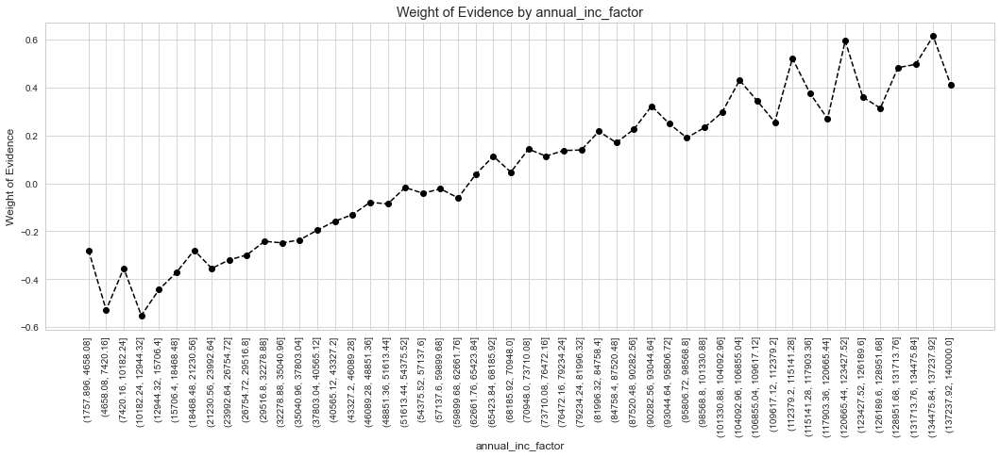

In [97]:
# We plot the weight of evidence values.
plot_by_woe(df_temp, 90)


**Analyse der WoE-Grafik zu annual_inc_factor:**
        
1. Starke Unterschiede bei sehr niedrigem Einkommen

- Die ersten beiden Einkommensintervalle (ganz links) haben einen extrem niedrigen WoE-Wert (~ -0.8) bzw. einen stark positiven (~ +0.4).

- Dies deutet auf eine deutliche Trennung zwischen "guten" und "schlechten" Kreditnehmern in diesen Gruppen hin.

- Wahrscheinlich sind in der untersten Einkommensgruppe überdurchschnittlich viele "bad" Kreditnehmer vertreten (negative WoE), während die nächste Gruppe überdurchschnittlich viele "good" Kreditnehmer hat (positive WoE).

2. Monotone Zunahme des WoE bei steigendem Einkommen
- Ab ca. dem dritten Einkommensintervall steigt der WoE relativ gleichmäßig an.

- Das ist ideal für ein Credit Scoring-Modell, da es bedeutet:

- „Je höher das Einkommen, desto geringer das Ausfallrisiko.“

3. Stabilisierung & Plateaubildung

- Ab einem Einkommen von ca. 60.000–70.000 USD steigt der WoE langsamer bzw. pendelt sich ein.

- Dies kann bedeuten, dass ab einer bestimmten Einkommenshöhe keine nennenswerte Verbesserung des Kreditrisikos mehr erkennbar ist.



In [98]:
# WoE is monotonically decreasing with income, so we split income in 10 equal categories, each with width of 15k.
df_inputs_prepr['annual_inc:<20K'] = np.where((df_inputs_prepr['annual_inc'] <= 20000), 1, 0)
df_inputs_prepr['annual_inc:20K-30K'] = np.where((df_inputs_prepr['annual_inc'] > 20000) & (df_inputs_prepr['annual_inc'] <= 30000), 1, 0)
df_inputs_prepr['annual_inc:30K-40K'] = np.where((df_inputs_prepr['annual_inc'] > 30000) & (df_inputs_prepr['annual_inc'] <= 40000), 1, 0)
df_inputs_prepr['annual_inc:40K-50K'] = np.where((df_inputs_prepr['annual_inc'] > 40000) & (df_inputs_prepr['annual_inc'] <= 50000), 1, 0)
df_inputs_prepr['annual_inc:50K-60K'] = np.where((df_inputs_prepr['annual_inc'] > 50000) & (df_inputs_prepr['annual_inc'] <= 60000), 1, 0)
df_inputs_prepr['annual_inc:60K-70K'] = np.where((df_inputs_prepr['annual_inc'] > 60000) & (df_inputs_prepr['annual_inc'] <= 70000), 1, 0)
df_inputs_prepr['annual_inc:70K-80K'] = np.where((df_inputs_prepr['annual_inc'] > 70000) & (df_inputs_prepr['annual_inc'] <= 80000), 1, 0)
df_inputs_prepr['annual_inc:80K-90K'] = np.where((df_inputs_prepr['annual_inc'] > 80000) & (df_inputs_prepr['annual_inc'] <= 90000), 1, 0)
df_inputs_prepr['annual_inc:90K-100K'] = np.where((df_inputs_prepr['annual_inc'] > 90000) & (df_inputs_prepr['annual_inc'] <= 100000), 1, 0)
df_inputs_prepr['annual_inc:100K-120K'] = np.where((df_inputs_prepr['annual_inc'] > 100000) & (df_inputs_prepr['annual_inc'] <= 120000), 1, 0)
df_inputs_prepr['annual_inc:120K-140K'] = np.where((df_inputs_prepr['annual_inc'] > 120000) & (df_inputs_prepr['annual_inc'] <= 140000), 1, 0)
df_inputs_prepr['annual_inc:>140K'] = np.where((df_inputs_prepr['annual_inc'] > 140000), 1, 0)

Binning-Strategie für annual_inc (jährliches Einkommen):

Da die Weight of Evidence (WoE) mit steigendem Einkommen monoton ansteigt, bietet sich eine geordnete Einteilung in Einkommensklassen an. Dabei wurde sowohl auf den Informationsgehalt als auch auf eine ausreichende Anzahl an Beobachtungen je Intervall geachtet.

**Vorgehen:**
- Niedriges Einkommen (≤ 20.000): Eigenes Intervall aufgrund geringer Fallzahl.

- Mittleres Einkommen (20.000 – 100.000): Aufteilung in 8 gleich breite Intervalle à 10.000.

- Höheres Einkommen (100.000 – 140.000): Zusammengefasst in zwei breitere Intervalle (100k–120k und 120k–140k) wegen seltener Beobachtungen.

- Sehr hohes Einkommen (> 140.000): Eigenes Intervall zur Abgrenzung von Extremwerten.

**Fazit:**
Diese Klassifizierung ermöglicht eine stabile und interpretierbare Modellierung, indem sie WoE-Trends abbildet und gleichzeitig Verzerrungen durch seltene Extremwerte vermeidet.

### Variable: Monate seit letzter Zahlungsverspätung  (mths_since_last_delinq)



- Da die Variable mths_since_last_delinq (Monate seit letzter Zahlungsverspätung) fehlende Werte enthält, wird zunächst eine separate Kategorie für Missing Values vorgesehen (nicht im Code, aber konzeptionell wichtig).

- Für alle nicht-fehlenden Werte erfolgt eine feinkörnige Einteilung (Fine Classing) in 50 Intervalle mittels pd.cut(). Dies dient der späteren Gruppierung zu sinnvollen Klassen auf Basis der Weight of Evidence (WoE).

- Anschließend wird mithilfe der Funktion woe_ordered_continuous() die WoE-Verteilung über diese Klassen berechnet, um systematische Zusammenhänge mit dem Zielmerkmal zu erkennen und ggf. monotone Trends zur Modellierung zu nutzen.

**Behandlung der Variable mths_since_last_delinq (Monate seit letzter Zahlungsverspätung)**

Die Variable mths_since_last_delinq enthält viele fehlende Werte, sodass eine sinnvolle Modellierung im ursprünglichen Preprocessing zunächst nicht möglich war. Im Rahmen der Modellvorbereitung wird dieses Problem nun gezielt behandelt.

Vorgehen:

- Fehlende Werte werden nicht verworfen, sondern erhalten eine eigene Dummy-Variable, die 1 ist, wenn der Wert fehlt, und 0 sonst. So kann das Modell lernen, ob das Fehlen selbst eine Aussagekraft besitzt.

- Für alle nicht fehlenden Werte wird eine feine Binning-Kategorisierung (Fine Classing) mit pd.cut(..., 50) vorgenommen. Dies dient als Basis zur späteren Ableitung optimaler Gruppen basierend auf der WoE-Analyse.

- Die Weight of Evidence (WoE) wird dann über diese feinen Intervalle berechnet, um den Zusammenhang mit dem Zielmerkmal zu analysieren.

Dieses Vorgehen ermöglicht eine saubere Trennung von fehlenden und beobachteten Werten sowie eine datengetriebene Gruppierung der Wertebereiche – analog zur Verarbeitung der annual_inc-Variable.

In [99]:
# mths_since_last_delinq
# Wir müssen eine Kategorie für fehlende Werte erstellen und für den Rest eine Fein- und Grobklassifizierung vornehmen.
df_inputs_prepr_temp = df_inputs_prepr[pd.notnull(df_inputs_prepr['mths_since_last_delinq'])]
df_inputs_prepr_temp['mths_since_last_delinq_factor'] = pd.cut(df_inputs_prepr_temp['mths_since_last_delinq'], 50)
df_temp = woe_ordered_continuous(df_inputs_prepr_temp, 'mths_since_last_delinq_factor', df_targets_prepr[df_inputs_prepr_temp.index])
# We calculate weight of evidence.
df_temp

,mths_since_last_delinq_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(-0.188, 3.76]",5310,0.859699,0.030723,4565.0,745.0,0.029985,0.036174,-0.187627,NaN,NaN,inf
1,"(3.76, 7.52]",11131,0.869374,0.064402,9677.0,1454.0,0.063564,0.070600,-0.104983,0.009675,0.082644,inf
2,"(7.52, 11.28]",13391,0.879098,0.077478,11772.0,1619.0,0.077325,0.078611,-0.016501,0.009724,0.088482,inf
3,"(11.28, 15.04]",13213,0.874745,0.076448,11558.0,1655.0,0.075919,0.080359,-0.056840,0.004353,0.040338,inf
4,"(15.04, 18.8]",9330,0.883816,0.053982,8246.0,1084.0,0.054164,0.052634,0.028654,0.009071,0.085494,inf
5,"(18.8, 22.56]",11704,0.879699,0.067717,10296.0,1408.0,0.067630,0.068366,-0.010831,0.004116,0.039485,inf
6,"(22.56, 26.32]",10845,0.885662,0.062747,9605.0,1240.0,0.063091,0.060209,0.046756,0.005962,0.057587,inf
7,"(26.32, 30.08]",10609,0.884532,0.061382,9384.0,1225.0,0.061639,0.059480,0.035649,0.001130,0.011107,inf
8,"(30.08, 33.84]",7550,0.886887,0.043683,6696.0,854.0,0.043983,0.041466,0.058918,0.002355,0.023269,inf
9,"(33.84, 37.6]",9642,0.887990,0.055787,8562.0,1080.0,0.056240,0.052440,0.069956,0.001103,0.011038,inf


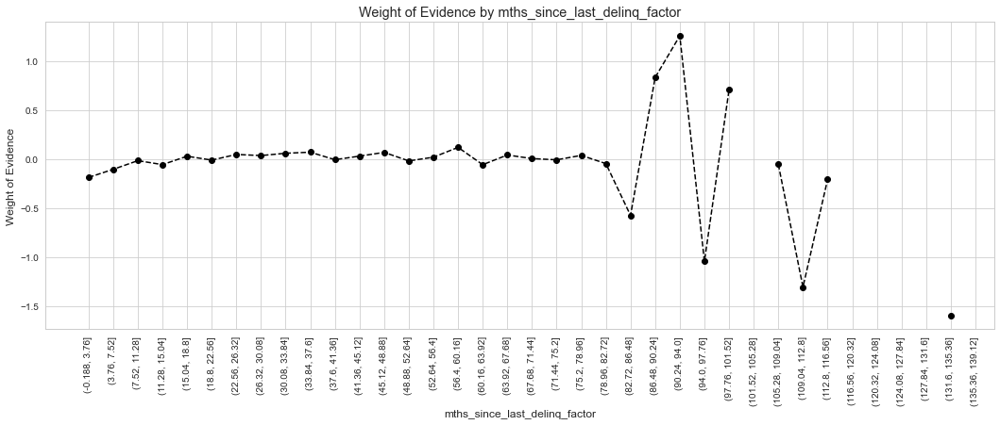

In [100]:
# We plot the weight of evidence values.
plot_by_woe(df_temp, 90)


**Analyse: Weight of Evidence für mths_since_last_delinq**

- Die Grafik zeigt den Verlauf des Weight of Evidence (WoE) über 50 fein eingeteilte Intervalle der Variable mths_since_last_delinq (Monate seit der letzten Zahlungsverspätung). Es lassen sich dabei folgende Muster erkennen:

- Für Werte unter ca. 90 Monaten schwankt der WoE um Null, d.h. es besteht kein starker Zusammenhang mit dem Ziel (z. B. Ausfallwahrscheinlichkeit).

- Ab etwa 90 Monaten nimmt der WoE deutlich ab und zeigt negative Ausreißer – insbesondere zwischen 100 und 140 Monaten.

- Diese extrem negativen WoE-Werte deuten darauf hin, dass lange Zeiträume seit der letzten Delinquenz mit einem niedrigeren Risiko verbunden sind – was plausibel ist: Wer sehr lange „clean“ war, ist wahrscheinlich weniger ausfallgefährdet.

Einige Intervalle (z. B. ganz rechts) sind vermutlich mit wenigen Beobachtungen besetzt, was zu sprunghaften WoE-Werten führt.

In [101]:
# Categories: Missing, 0-3, 4-30, 31-56, >=57
df_inputs_prepr['mths_since_last_delinq:Missing'] = np.where((df_inputs_prepr['mths_since_last_delinq'].isnull()), 1, 0)
df_inputs_prepr['mths_since_last_delinq:0-3'] = np.where((df_inputs_prepr['mths_since_last_delinq'] >= 0) & (df_inputs_prepr['mths_since_last_delinq'] <= 3), 1, 0)
df_inputs_prepr['mths_since_last_delinq:4-30'] = np.where((df_inputs_prepr['mths_since_last_delinq'] >= 4) & (df_inputs_prepr['mths_since_last_delinq'] <= 30), 1, 0)
df_inputs_prepr['mths_since_last_delinq:31-56'] = np.where((df_inputs_prepr['mths_since_last_delinq'] >= 31) & (df_inputs_prepr['mths_since_last_delinq'] <= 56), 1, 0)
df_inputs_prepr['mths_since_last_delinq:>=57'] = np.where((df_inputs_prepr['mths_since_last_delinq'] >= 57), 1, 0)

**Umsetzung: Kategorisierung auf Basis der WoE-Struktur**

Basierend auf der WoE-Analyse wurde folgende Gruppierung vorgenommen:

- Missing: Eine separate Kategorie für fehlende Werte.

- 0–3 Monate: Sehr kurzfristige Rückstände – möglicherweise risikobehaftet.

- 4–30 Monate: Moderater Zeitraum – weitgehend neutraler WoE.

- 31–56 Monate: Längere Vergangenheit – WoE beginnt tendenziell zu sinken.

- (>= 57 Monate:) Sehr lange seit der letzten Delinquenz – WoE ist deutlich negativ (niedrigeres Risiko).

Diese Gruppierung ermöglicht ein stabileres und interpretierbares Modell, indem die kontinuierliche Variable in bedeutungsvolle Risikoklassen übersetzt wird.

### Variable dti (Debt-to-Income Ratio):

**Verarbeitung der Variable dti**

- Zur Vorbereitung der kontinuierlichen Variable dti wurde zunächst eine feine Klassifikation (fine classing) vorgenommen. Dabei wurde die Variable mithilfe der Methode pd.cut() in 100 gleich große Wertebereiche unterteilt und als neue kategoriale Variable dti_factor gespeichert.

- Anschließend wurde der Weight of Evidence (WoE) für jede dieser Kategorien berechnet. Diese Analyse hilft dabei, potenzielle Zusammenhänge zwischen der Höhe des Verschuldungsgrads und dem Ausfallrisiko zu erkennen und die Variable in sinnvolle Risikogruppen zu überführen.

- Diese Vorarbeit ist besonders wichtig für die spätere grobe Klassifikation (coarse classing) und für die Modellinterpretation, da sie eine datengetriebene Transformation der dti-Werte ermöglicht.

In [102]:
# dti
# Hier führen wir eine Feinklassifizierung durch: 
# Mit der Methode „Cut“ teilen wir die Variable anhand ihrer Werte in 100 Kategorien auf.
df_inputs_prepr['dti_factor'] = pd.cut(df_inputs_prepr['dti'], 100)
df_temp = woe_ordered_continuous(df_inputs_prepr, 'dti_factor', df_targets_prepr)
# weight of evidence.
df_temp

,dti_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(-0.04, 0.4]",736,0.872283,0.001973,642.0,94.0,0.001953,0.002123,-0.083516,NaN,NaN,0.029784
1,"(0.4, 0.8]",779,0.907574,0.002088,707.0,72.0,0.002151,0.001626,0.279555,0.035291,0.363071,0.029784
2,"(0.8, 1.2]",887,0.891770,0.002378,791.0,96.0,0.002406,0.002168,0.104140,0.015804,0.175415,0.029784
3,"(1.2, 1.6]",1048,0.895038,0.002809,938.0,110.0,0.002853,0.002484,0.138460,0.003268,0.034320,0.029784
4,"(1.6, 2.0]",1185,0.896203,0.003177,1062.0,123.0,0.003230,0.002778,0.150915,0.001164,0.012455,0.029784
5,"(2.0, 2.399]",1345,0.916729,0.003606,1233.0,112.0,0.003751,0.002529,0.393897,0.020526,0.242982,0.029784
6,"(2.399, 2.799]",1540,0.914286,0.004128,1408.0,132.0,0.004283,0.002981,0.362314,0.002443,0.031583,0.029784
7,"(2.799, 3.199]",1721,0.901220,0.004614,1551.0,170.0,0.004718,0.003839,0.206047,0.013065,0.156267,0.029784
8,"(3.199, 3.599]",1913,0.898066,0.005128,1718.0,195.0,0.005226,0.004404,0.171107,0.003154,0.034940,0.029784
9,"(3.599, 3.999]",2221,0.902747,0.005954,2005.0,216.0,0.006099,0.004878,0.223311,0.004681,0.052204,0.029784


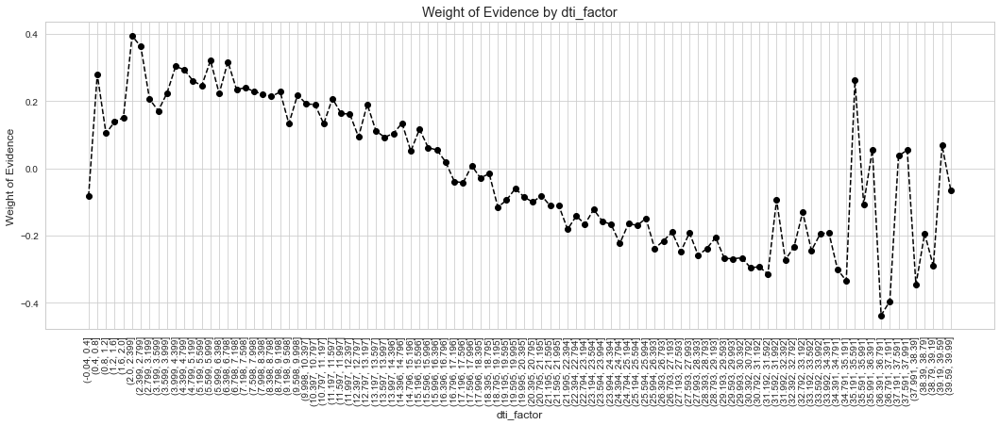

In [103]:
plot_by_woe(df_temp, 90)
# We plot the weight of evidence values.

**Analyse der WoE-Grafik für dti**

- Die Grafik zeigt den Weight of Evidence (WoE) für 100 fein eingeteilte Kategorien der Variable dti. Insgesamt lässt sich ein klar abnehmender Trend erkennen:

- Niedrige dti-Werte (unter ca. 15) weisen überwiegend positive WoE-Werte auf. Das bedeutet, dass Kreditnehmer mit niedrigem Verschuldungsgrad eine niedrigere Ausfallwahrscheinlichkeit haben.

- Ab einem dti-Wert von etwa 15 bis 25 beginnt der WoE langsam in den negativen Bereich zu sinken – dies deutet auf ein steigendes Risiko hin.

- Für dti-Werte über 30 verschärft sich der negative Trend deutlich. Diese Gruppen zeigen stark negative WoE-Werte, was auf eine signifikant höhere Ausfallwahrscheinlichkeit schließen lässt.

- Einige extreme Ausschläge am rechten Rand (z. B. ab dti > 35) sind vermutlich auf geringe Fallzahlen in diesen Gruppen zurückzuführen und sollten daher mit Vorsicht interpretiert werden.

**Fazit:** Die dti-Variable zeigt eine monotone Beziehung zum Ausfallrisiko und eignet sich sehr gut für eine coarse classing-Einordnung in wenige, aber trennscharfe Risikogruppen – z. B. "niedrig, mittel, hoch".

- Ein erster Blick auf die Verteilung der dti-Werte zeigt, dass der Großteil der Beobachtungen unter einem Wert von 35 liegt. Um eine stabile und sinnvolle Gruppierung (Coarse Classing) vorzunehmen, beschränken wir uns daher zunächst auf diese Hauptgruppe.
- stellt sicher, dass wir nur die Daten mit dti-Werten von 35 oder weniger weiterverarbeiten. Für Werte über 35 wird später eine eigene, separate Kategorie gebildet. Dieses Vorgehen hilft, die Analyse robuster zu gestalten und extreme Werte, die statistisch wenig Gewicht haben, nicht zu verzerren.

In [104]:
# Ähnlich wie beim Einkommen zeigt eine erste Untersuchung, dass die meisten Werte unter 200 liegen.
# Daher erstellen wir eine Kategorie für Personen über 35 und wenden unseren Ansatz an, um
# die Kategorien aller Personen mit einem Einkommen von 150.000 oder weniger zu bestimmen.
df_inputs_prepr_temp = df_inputs_prepr.loc[df_inputs_prepr['dti'] <= 35, : ]

Um die Variable dti (Debt-to-Income Ratio) optimal für das Scorecard-Modell vorzubereiten, führen wir eine Fein-Klassifizierung durch. Dabei wird der kontinuierliche Wertebereich der dti-Werte in 50 gleichbreite Intervalle unterteilt:

In [105]:
# Hier führen wir eine Feinklassifizierung durch:
# Mit der „Cut“-Methode teilen wir die Variable anhand ihrer Werte in 50 Kategorien auf.
df_inputs_prepr_temp['dti_factor'] = pd.cut(df_inputs_prepr_temp['dti'], 50)
df_temp = woe_ordered_continuous(df_inputs_prepr_temp, 'dti_factor', df_targets_prepr[df_inputs_prepr_temp.index])
# We calculate weight of evidence.
df_temp

,dti_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(-0.035, 0.7]",1323,0.886621,0.003574,1173.0,150.0,0.003595,0.003417,0.050920,NaN,NaN,0.028904
1,"(0.7, 1.4]",1630,0.891411,0.004404,1453.0,177.0,0.004454,0.004032,0.099471,0.004790,0.048551,0.028904
2,"(1.4, 2.1]",2024,0.904644,0.005468,1831.0,193.0,0.005612,0.004396,0.244162,0.013233,0.144691,0.028904
3,"(2.1, 2.8]",2583,0.913279,0.006978,2359.0,224.0,0.007231,0.005103,0.348582,0.008635,0.104420,0.028904
4,"(2.8, 3.5]",3148,0.903113,0.008505,2843.0,305.0,0.008714,0.006948,0.226538,0.010166,0.122044,0.028904
5,"(3.5, 4.2]",3875,0.901935,0.010469,3495.0,380.0,0.010712,0.008656,0.213152,0.001178,0.013386,0.028904
6,"(4.2, 4.9]",4585,0.907743,0.012387,4162.0,423.0,0.012757,0.009636,0.280614,0.005807,0.067461,0.028904
7,"(4.9, 5.6]",5334,0.906074,0.014410,4833.0,501.0,0.014814,0.011412,0.260852,0.001668,0.019762,0.028904
8,"(5.6, 6.3]",5907,0.905705,0.015958,5350.0,557.0,0.016398,0.012688,0.256522,0.000369,0.004330,0.028904
9,"(6.3, 7.0]",6520,0.907975,0.017614,5920.0,600.0,0.018145,0.013667,0.283397,0.002270,0.026875,0.028904


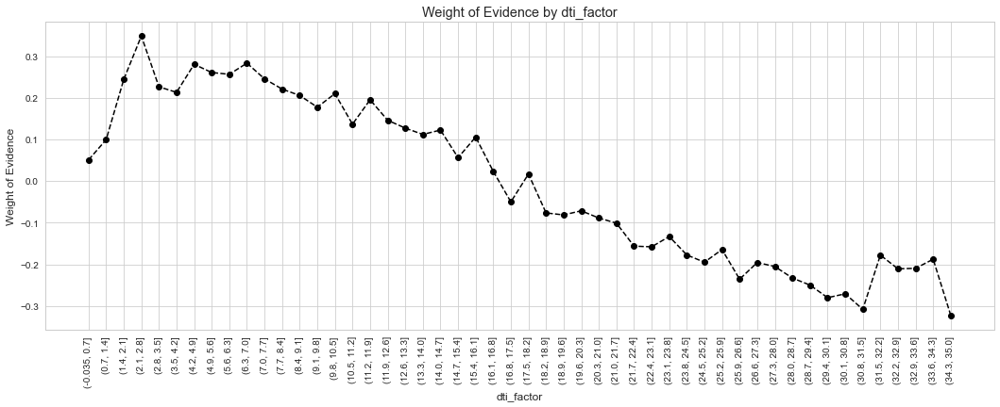

In [106]:
plot_by_woe(df_temp, 90)
# We plot the weight of evidence values.

📊 **Analyse der Weight-of-Evidence-Grafik zur Variable dti**

Die Grafik zeigt die Weight-of-Evidence (WoE)-Verteilung der fein-klassifizierten dti-Werte (Debt-to-Income Ratio). Wir erkennen einen klar abnehmenden Trend: Bei niedrigen dti-Werten liegt der WoE im positiven Bereich, was auf ein geringeres Ausfallrisiko hindeutet. Mit steigendem dti sinkt der WoE-Wert und wird zunehmend negativ – ein typisches Muster, das zeigt, dass eine höhere Verschuldung in Relation zum Einkommen mit einem höheren Kreditrisiko verbunden ist.

Auf Basis dieser WoE-Kurve wurden die folgenden Coarse-Classing-Kategorien gebildet:

<= 1.4: Sehr niedrige Verschuldung, stabil positiver WoE.

1.4 – 3.5: Ebenfalls positive WoE-Werte, Risiko weiterhin gering.

3.5 – 7.7: Beginn eines leichten Risikozuwachses.

7.7 – 10.5: Übergang zu neutralem bzw. leicht negativem WoE.

10.5 – 16.1: Kontinuierlicher Rückgang, negativ werdender Einfluss.

16.1 – 20.3: Deutlich negativ, Risiko steigt.

20.3 – 21.7 und 21.7 – 22.4: Feinklassifizierung zur besseren Trennung der Risikowerte in einem sensiblen Bereich.

22.4 – 35: Stark negativer WoE, hohes Ausfallrisiko.

(> 35:) Extrem negative WoE-Werte – höchste Risikogruppe.

Diese Einteilung ermöglicht eine sinnvolle Risikodifferenzierung und sorgt gleichzeitig dafür, dass ausreichend viele Datenpunkte pro Kategorie vorhanden bleiben – ein wichtiger Aspekt für die Stabilität der späteren Modellschätzung.

In [107]:
# Categories:
df_inputs_prepr['dti:<=1.4'] = np.where((df_inputs_prepr['dti'] <= 1.4), 1, 0)
df_inputs_prepr['dti:1.4-3.5'] = np.where((df_inputs_prepr['dti'] > 1.4) & (df_inputs_prepr['dti'] <= 3.5), 1, 0)
df_inputs_prepr['dti:3.5-7.7'] = np.where((df_inputs_prepr['dti'] > 3.5) & (df_inputs_prepr['dti'] <= 7.7), 1, 0)
df_inputs_prepr['dti:7.7-10.5'] = np.where((df_inputs_prepr['dti'] > 7.7) & (df_inputs_prepr['dti'] <= 10.5), 1, 0)
df_inputs_prepr['dti:10.5-16.1'] = np.where((df_inputs_prepr['dti'] > 10.5) & (df_inputs_prepr['dti'] <= 16.1), 1, 0)
df_inputs_prepr['dti:16.1-20.3'] = np.where((df_inputs_prepr['dti'] > 16.1) & (df_inputs_prepr['dti'] <= 20.3), 1, 0)
df_inputs_prepr['dti:20.3-21.7'] = np.where((df_inputs_prepr['dti'] > 20.3) & (df_inputs_prepr['dti'] <= 21.7), 1, 0)
df_inputs_prepr['dti:21.7-22.4'] = np.where((df_inputs_prepr['dti'] > 21.7) & (df_inputs_prepr['dti'] <= 22.4), 1, 0)
df_inputs_prepr['dti:22.4-35'] = np.where((df_inputs_prepr['dti'] > 22.4) & (df_inputs_prepr['dti'] <= 35), 1, 0)
df_inputs_prepr['dti:>35'] = np.where((df_inputs_prepr['dti'] > 35), 1, 0)

### Variable:Monate seit letztem negativen öffentlichen Eintrag  (mths_since_last_record)

Zur Vorbereitung der Variable mths_since_last_record (Monate seit letztem negativen öffentlichen Eintrag) wurde zunächst eine eigene Kategorie für fehlende Werte vorgesehen, da fehlende Einträge potenziell eine eigene Bedeutung tragen (z. B. nie ein Eintrag vorhanden). Anschließend wurden die übrigen Werte in 50 gleich große Intervalle (Fine-Classing) eingeteilt. Diese feine Aufteilung ermöglicht die anschließende Berechnung der Weight-of-Evidence (WoE)-Werte und unterstützt dabei, ein geeignetes binning für die Modellierung abzuleiten.

- Zuerst werden alle fehlenden Werte (NaN) aus der Variable mths_since_last_record entfernt. Diese werden später separat als eigene Kategorie behandelt.

- Danach erfolgt das sogenannte Fine-Classing: Die verbleibenden Werte werden mit pd.cut() in 50 gleich große Gruppen eingeteilt. Das erlaubt eine detaillierte Betrachtung der Verteilung und später eine gezielte Auswahl sinnvoller Kategorien (Coarse-Classing).

In [108]:
# Wir erstellen eine temporäre Kopie ohne fehlende Werte
df_inputs_prepr_temp = df_inputs_prepr[pd.notnull(df_inputs_prepr['mths_since_last_record'])]

# Wir unterteilen die Variable in 50 gleich große Intervalle (Fine-Classing)
df_inputs_prepr_temp['mths_since_last_record_factor'] = pd.cut(df_inputs_prepr_temp['mths_since_last_record'], 50)


In [109]:
# Hier führen wir eine Feinklassifizierung durch: 
# Mit der „Cut“-Methode teilen wir die Variable anhand ihrer Werte in 50 Kategorien auf.
df_temp = woe_ordered_continuous(df_inputs_prepr_temp, 'mths_since_last_record_factor', df_targets_prepr[df_inputs_prepr_temp.index])
# We calculate weight of evidence.
df_temp

,mths_since_last_record_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,"(-0.129, 2.58]",1038,0.760116,0.020651,789.0,249.0,0.017763,0.042593,-0.874574,NaN,NaN,inf
1,"(2.58, 5.16]",134,0.880597,0.002666,118.0,16.0,0.002657,0.002737,-0.029791,0.120481,0.844782,inf
2,"(5.16, 7.74]",123,0.910569,0.002447,112.0,11.0,0.002522,0.001882,0.292716,0.029972,0.322508,inf
3,"(7.74, 10.32]",246,0.882114,0.004894,217.0,29.0,0.004885,0.004961,-0.015286,0.028455,0.308002,inf
4,"(10.32, 12.9]",190,0.873684,0.003780,166.0,24.0,0.003737,0.004105,-0.093953,0.008430,0.078668,inf
5,"(12.9, 15.48]",315,0.901587,0.006267,284.0,31.0,0.006394,0.005303,0.187100,0.027903,0.281053,inf
6,"(15.48, 18.06]",341,0.879765,0.006784,300.0,41.0,0.006754,0.007013,-0.037677,0.021822,0.224777,inf
7,"(18.06, 20.64]",242,0.913223,0.004815,221.0,21.0,0.004975,0.003592,0.325753,0.033458,0.363430,inf
8,"(20.64, 23.22]",442,0.893665,0.008794,395.0,47.0,0.008893,0.008040,0.100851,0.019558,0.224902,inf
9,"(23.22, 25.8]",318,0.896226,0.006327,285.0,33.0,0.006416,0.005645,0.128094,0.002561,0.027243,inf


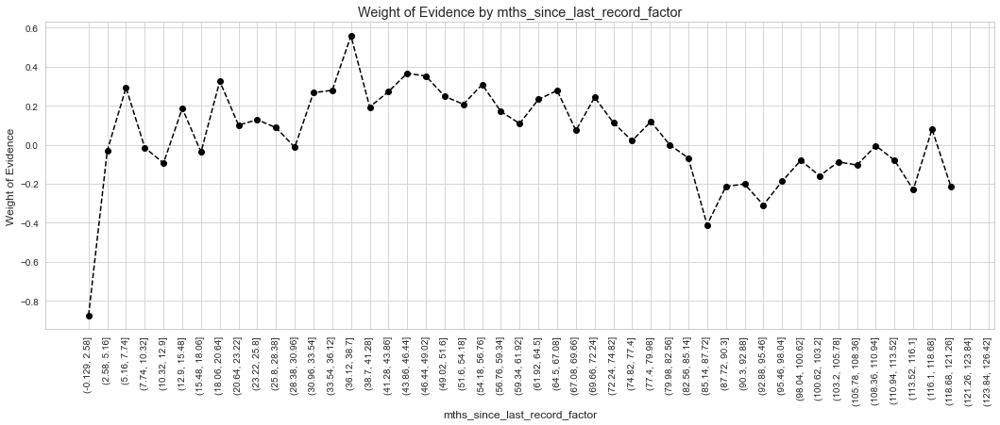

In [110]:
plot_by_woe(df_temp, 90)

**Beobachtungen:**

- Starker negativer WoE im ersten Intervall (0–2.9 Monate): Das deutet darauf hin, dass ein sehr aktueller negativer Eintrag stark mit einem höheren Ausfallrisiko korreliert.

- Für die meisten Intervalle zwischen ca. 6 bis 50 Monaten liegt der WoE deutlich im positiven Bereich, was auf ein niedrigeres Risiko in dieser Gruppe hindeutet.

- Nach ca. 60 Monaten beginnt der WoE wieder zu fallen – teilweise sogar in den negativen Bereich – was auf eine heterogene Risikostruktur bei sehr alten Einträgen hindeuten könnte.

- Es zeigt sich insgesamt ein nicht-linearer Verlauf, was nahelegt, dass eine fein abgestufte Kategorisierung oder ein nicht-lineares Modell vorteilhaft sein kann.

Zur Einschätzung der Risikostruktur in Bezug auf die Variable mths_since_last_record wurde der Weight of Evidence (WoE) über 50 gleich große Intervalle berechnet. Die Analyse zeigt, dass sehr aktuelle negative Einträge (unter 3 Monate) ein deutlich erhöhtes Ausfallrisiko aufweisen (stark negativer WoE), während Einträge, die zwischen 6 und 50 Monaten zurückliegen, eher mit niedrigem Risiko verbunden sind. Danach nimmt der WoE wieder ab, was auf abweichende Risikomuster bei sehr alten Einträgen hindeutet. Diese Ergebnisse dienen als Grundlage für eine sinnvolle Gruppierung (Coarse-Classing) der Variable für das Modell.

In [111]:
# Categories: 'Missing', '0-2', '3-20', '21-31', '32-80', '81-86', '>86'
df_inputs_prepr['mths_since_last_record:Missing'] = np.where((df_inputs_prepr['mths_since_last_record'].isnull()), 1, 0)
df_inputs_prepr['mths_since_last_record:0-2'] = np.where((df_inputs_prepr['mths_since_last_record'] >= 0) & (df_inputs_prepr['mths_since_last_record'] <= 2), 1, 0)
df_inputs_prepr['mths_since_last_record:3-20'] = np.where((df_inputs_prepr['mths_since_last_record'] >= 3) & (df_inputs_prepr['mths_since_last_record'] <= 20), 1, 0)
df_inputs_prepr['mths_since_last_record:21-31'] = np.where((df_inputs_prepr['mths_since_last_record'] >= 21) & (df_inputs_prepr['mths_since_last_record'] <= 31), 1, 0)
df_inputs_prepr['mths_since_last_record:32-80'] = np.where((df_inputs_prepr['mths_since_last_record'] >= 32) & (df_inputs_prepr['mths_since_last_record'] <= 80), 1, 0)
df_inputs_prepr['mths_since_last_record:81-86'] = np.where((df_inputs_prepr['mths_since_last_record'] >= 81) & (df_inputs_prepr['mths_since_last_record'] <= 86), 1, 0)
df_inputs_prepr['mths_since_last_record:>86'] = np.where((df_inputs_prepr['mths_since_last_record'] > 86), 1, 0)

Basierend auf der WoE-Analyse wurden die Werte der Variable mths_since_last_record in sieben diskrete Kategorien eingeteilt:

- Missing: Eine separate Kategorie für fehlende Werte, da diese Information potenziell modellrelevant ist.

- 0–2 Monate: Diese Gruppe zeigt einen stark negativen WoE-Wert und weist somit ein erhöhtes Risiko auf.

- 3–20 Monate: Diese Kategorie repräsentiert eine moderate Risikogruppe mit leicht positivem WoE.

- 21–31 Monate: Weiterhin positiv, aber mit leicht abnehmender Tendenz im WoE.

- 32–80 Monate: Diese Kategorie umfasst viele Intervalle mit stabil positivem WoE und gilt daher als risikoarm.

- 81–86 Monate: In diesem kurzen Intervall zeigen sich wieder steigende WoE-Werte.

- (>86) Monate: Diese Gruppe ist risikodivers, zeigt aber tendenziell wieder fallende WoE-Werte.

Diese Einteilung erlaubt eine robuste und interpretierbare Transformation der kontinuierlichen Variable für das Modell und berücksichtigt sowohl aktuelle als auch ältere Negativmerkmale sowie fehlende Daten.



In [112]:
# loan_data_inputs_train = df_inputs_prepr
# loan_data_inputs_train.to_csv('loan_data_inputs_train.csv')

In [113]:
#loan_data_inputs_test = df_inputs_prepr

In [114]:
# loan_data_targets_train.to_csv('loan_data_targets_train.csv')
# loan_data_inputs_test.to_csv('loan_data_inputs_test.csv')
# loan_data_targets_test.to_csv('loan_data_targets_test.csv')

In [115]:
#loan_data_targets_test.to_csv('loan_data_targets_test.csv')